<a href="https://colab.research.google.com/github/zorluhan/demo_app/blob/master/Copy_of_Automated_BP_2025_MyBot_Compatible.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
Weekly_Dep_Var = 'Consideration'
Monthly_Dep_Var = 'Consideration'
Weekly_Cor_Threshold = 0.4
Monthly_Cor_Threshold = 0.4
Weekly_Max_Lag = 20
Monthly_Max_Lag = 16
Additional_columns = 'n'
Log_Variance = 'n'

In [ ]:

def brandindex_to_flat(file_path):
    !pip install --upgrade ipywidgets  # Upgrade ipywidgets to the latest version
    !pip install streamlit
    import streamlit as st
    import pandas as pd
    # Load the Excel file
    xls = pd.ExcelFile(file_path)

    result = pd.DataFrame()
    date_column = None
    first_sheet_processed = False  # Flag to track if the first sheet has been processed

    for sheet in xls.sheet_names:
      if sheet == 'Meta':
        continue
      df = pd.read_excel(xls, sheet, header=8)

      # Get 'Date' and 'Volume' from the first sheet and format date
      if date_column is None:
        date_column = df[df.iloc[:, 0].notna()].iloc[:, 0]  # Extract the first column as a Series
        # Remove the last text line more reliably
        for i in range(len(date_column) - 1, -1, -1):  # Iterate backwards
            if not isinstance(date_column.iloc[i], str) or date_column.iloc[i].strip() == '':
                date_column = date_column[:i]  # Slice up to the last non-text/empty line
                break  # Exit the loop once the text line is removed

        date_column.name = 'Date'
        try:
            date_column = pd.to_datetime(date_column).dt.date  # Format date
        except ValueError:
            print("Warning: Could not convert 'Date' column to datetime. Check the format.")
        volume_col = next((col for col in df.columns if 'Volume' in col), None)
        if volume_col:
          result = pd.DataFrame({
              'Date': date_column,
              'Volume': df[volume_col]
          })
        else:
          print(f"Warning: 'Volume' column not found in the first sheet.")
        first_sheet_processed = True  # Mark the first sheet as processed

        # Process other sheets (including the first sheet for 'Positive'/'Yes')
      if 'Positive' in df.columns:
        df = df[df['Positive'].notna()]  # Stop at blank in 'Positive' column
        result[sheet] = df['Positive']
      elif 'Yes' in df.columns:
        df = df[df['Yes'].notna()]      # Stop at blank in 'Yes' column
        result[sheet] = df['Yes']
      elif first_sheet_processed:  # Check if it's the first sheet and we haven't processed 'Positive'/'Yes' yet
        print(f"Warning: Neither 'Positive' nor 'Yes' column found in the first sheet.")
      else:
        print(f"Warning: Neither 'Positive' nor 'Yes' column found in sheet: {sheet}")

    # Display the resulting DataFrame
    daily_df = result.copy()  # Create a copy to avoid modifying the original DataFrame




    daily_df_percentage = daily_df.copy()  # Create a copy to avoid modifying the original

        # Calculate percentages, EXCLUDING the 'Date' column
    for col in daily_df_percentage.columns:
        if col not in ['Volume', 'Date']:  # Exclude 'Date' from percentage calculation
            daily_df_percentage[col] = (daily_df_percentage[col] / daily_df_percentage['Volume']) * 100

    # Provide a download link in the notebook
    #print(f"\n--- Results for {file_path} ---")
    #print("\nDownload Daily Consolidation as CSV:")
    # display(FileLink(csv_file_name))
    # Save daily DataFrame to a CSV file
    #from ipywidgets import FileLink  # Import here, inside the function
    file_name = file_path.split('/')[-1].split('.')[0]
    csv_file_name = f"daily_data_{file_name}.csv"
    daily_df_percentage.to_csv(csv_file_name)
    st.subheader("Daily Data:")
    st.write(daily_df_percentage)
    print(daily_df_percentage)
    # Download button for daily data
    csv_daily = daily_df_percentage.to_csv(index=False)
    st.download_button(
        label="Download Daily Data as CSV",
        data=csv_daily,
        file_name='daily_data.csv',
        mime='text/csv'
    )

    return daily_df, csv_file_name  # Return the copy instead of the original



In [ ]:

def brandindex_weekly(result,file_path):
    #!pip install --upgrade ipywidgets  # Upgrade ipywidgets to the latest version
    #!pip install streamlit
    import streamlit as st
    import pandas as pd
    result['Date'] = pd.to_datetime(result['Date'])  # Ensure 'Date' is datetime

    # --- Create Weekly Aggregation DataFrame ---
    weekly_result = result.copy()
    weekly_result['Date'] = pd.to_datetime(weekly_result['Date']).dt.to_period('W-SAT').dt.start_time

    # Calculate weekly sums
    weekly_sums = weekly_result.groupby('Date').sum()

    # Calculate percentages for columns other than 'Volume'
    for col in weekly_sums.columns:
        if col != 'Volume':
            weekly_sums[col] = (weekly_sums[col] / weekly_sums['Volume']) * 100


    print("\nWeekly Aggregation with Percentages:")
    print(weekly_sums)
    st.subheader("Weekly Data:")
    st.write(weekly_sums)

    # Download button for daily data
    # Save daily DataFrame to a CSV file
    #from ipywidgets import FileLink  # Import here, inside the function
    file_name = file_path.split('/')[-1].split('.')[0]
    csv_file_name = f"weekly_data_{file_name}.csv"
    weekly_sums.to_csv(csv_file_name)
    csv_weekly = weekly_sums.to_csv()
    st.download_button(
        label="Download Weekly Data as CSV",
        data=csv_weekly,
        file_name='weekly_data.csv',
        mime='text/csv'
    )
    return weekly_sums, csv_file_name  # Return the copy instead of the original


In [ ]:
def brandindex_monthly(result,file_path):
    #!pip install --upgrade ipywidgets  # Upgrade ipywidgets to the latest version
    #!pip install streamlit
    import streamlit as st
    import pandas as pd

    # --- Create Monthly Aggregation DataFrame ---
    monthly_result = result.copy()
    monthly_result['Date'] = pd.to_datetime(monthly_result['Date']).dt.to_period('M').dt.start_time

    # Calculate monthly sums
    monthly_sums = monthly_result.groupby('Date').sum()

    # Calculate percentages for columns other than 'Volume'
    for col in monthly_sums.columns:
        if col != 'Volume':
            monthly_sums[col] = (monthly_sums[col] / monthly_sums['Volume']) * 100

    print("\nMonthly Aggregation with Percentages:")
    print(monthly_sums)

    # Download button for daily data
    # Save daily DataFrame to a CSV file
    #from ipywidgets import FileLink  # Import here, inside the function
    st.subheader("Monthly Data:")
    st.write(monthly_sums)
    file_name = file_path.split('/')[-1].split('.')[0]
    csv_file_name = f"monthly_data_{file_name}.csv"
    monthly_sums.to_csv(csv_file_name)
    csv_monthly = monthly_sums.to_csv()
    st.download_button(
        label="Download Monthly Data as CSV",
        data=csv_monthly,
        file_name='monthly_data.csv',
        mime='text/csv'
    )
    return monthly_sums, csv_file_name  # Return the copy instead of the original


In [ ]:
import pandas as pd
from io import BytesIO, StringIO
from google.colab import files

def brandindex_monthly_with_additional_data(result, file_path):
    """
    Function to generate a monthly summary of the daily data and optionally add new data columns.
    """
    # Step 1: Convert 'Date' column to datetime and create 'Month_data'
    result['Date'] = pd.to_datetime(result['Date'])
    result['Month_data'] = result['Date'].dt.to_period('M').dt.start_time  # Create 'Month_data' for grouping

    # Group by 'Month_data' and calculate monthly sums for numeric columns only
    numeric_columns = result.select_dtypes(include=['number']).columns
    monthly_sums = result.groupby('Month_data')[numeric_columns].sum()

    # Calculate percentages for columns other than 'Volume'
    for col in monthly_sums.columns:
        if col != 'Volume':
            monthly_sums[col] = (monthly_sums[col] / monthly_sums['Volume']) * 100

    # Reset index to make 'Month_data' a column and rename it to 'Date'
    monthly_sums = monthly_sums.reset_index().rename(columns={'Month_data': 'Date'})
    monthly_sums['Date'] = pd.to_datetime(monthly_sums['Date']).dt.strftime('%Y-%m-01')  # Format as YYYY-MM-DD with day as 01

    print("\nMonthly Aggregation with Percentages:")
    print(monthly_sums)

    # Step 2: Check if additional data columns need to be added
    print(file_path)
    ans = input("Do you have additional data columns to add? (y/n): ").strip().lower()
    if ans == 'y':
        cols = int(input("How many new columns to add? "))
        print("Upload the Excel/CSV file with 'Date' as the first column followed by the new columns.")
        uploaded_files = files.upload()

        # Get the uploaded file
        uploaded_file_name = list(uploaded_files.keys())[0]
        uploaded_file_content = uploaded_files[uploaded_file_name]

        # Read the uploaded file (CSV or Excel)
        if uploaded_file_name.endswith('.csv'):
            new_data = pd.read_csv(StringIO(uploaded_file_content.decode('utf-8')))
        elif uploaded_file_name.endswith(('.xls', '.xlsx')):
            new_data = pd.read_excel(BytesIO(uploaded_file_content))  # Wrap in BytesIO for Excel files
        else:
            raise ValueError("Unsupported file format. Please upload a CSV or Excel file.")

        # Step 3: Remove duplicate column names in `new_data`
        new_data = new_data.loc[:, ~new_data.columns.duplicated()]

        # Convert 'Date' column in the new data to datetime and create 'Month_new_data'
        new_data['Date'] = pd.to_datetime(new_data['Date'])
        new_data['Month_new_data'] = new_data['Date'].dt.to_period('M').dt.start_time

        # Ensure there are the expected number of columns
        new_columns = new_data.columns.difference(['Date', 'Month_new_data']).tolist()
        if len(new_columns) != cols:
            raise ValueError(f"Expected {cols} new columns, but found {len(new_columns)}.")

        # Group new data by 'Month_new_data' to calculate monthly averages
        new_data = new_data.groupby('Month_new_data', as_index=False)[new_columns].mean()

        # Rename 'Month_new_data' to 'Date' and format
        new_data = new_data.rename(columns={'Month_new_data': 'Date'})
        new_data['Date'] = pd.to_datetime(new_data['Date']).dt.strftime('%Y-%m-01')  # Format as YYYY-MM-DD with day as 01

        print("\nNew Data to be Merged:")
        print(new_data)

        # Step 4: Merge `new_data` with `monthly_sums`
        monthly_sums['Date'] = pd.to_datetime(monthly_sums['Date'])
        new_data['Date'] = pd.to_datetime(new_data['Date'])

        # Drop duplicate Date columns if they exist
        new_data = new_data.loc[:, ~new_data.columns.duplicated()]

        # Merge on 'Date'
        monthly_sums = pd.merge(monthly_sums, new_data, on='Date', how='left')

        print("\nNew columns added successfully to monthly data.")
        print(file_path)
        print(monthly_sums)

    # Step 5: Save the updated monthly data to CSV using `file_path`
    file_name = file_path.split('/')[-1].split('.')[0]
    csv_file_name = f"monthly_data_{file_name}.csv"
    monthly_sums.to_csv(csv_file_name, index=False)
    print(f"\nMonthly data with additional columns saved as: {csv_file_name}")

    return monthly_sums, csv_file_name




In [ ]:

def print_subheading(text):
  print('\n---\n')
  print('\033[1m' + text + '\033[0m')  # Using ANSI escape codes for bold formatting
  print('\n---\n')



In [ ]:
def monthly_cross_correlation(file_path,df,independent_vars,dependent_var):
  import pandas as pd
  import seaborn as sns
  import matplotlib.pyplot as plt
  # Create lagged features
  def create_lagged_features(df, variables, max_lag=Monthly_Max_Lag): # Set max_lag to 12
      lagged_data = {}
      for feature in variables:
          for lag in range(1, max_lag + 1):
              lagged_data[f'{feature}_lag_{lag}'] = df[feature].shift(lag)
      return pd.concat([df, pd.DataFrame(lagged_data)], axis=1)

  # Create lagged features with a maximum lag of 12
  max_lag = Monthly_Max_Lag
  df_lagged = create_lagged_features(df, independent_vars, max_lag=max_lag)

  # Drop rows with NaN values introduced by lagging
  df_lagged = df_lagged.dropna()

  # Initialize an empty DataFrame to store the correlations
  lagged_correlations = pd.DataFrame(index=independent_vars, columns=[f'Lag_{i}' for i in range(1, max_lag + 1)])

  # Calculate the correlation of each lagged feature with the 'Bookings' column
  for feature in independent_vars:
      for lag in range(1, max_lag + 1):
          lag_col = f'{feature}_lag_{lag}'
          correlation = df_lagged[dependent_var].corr(df_lagged[lag_col])
          lagged_correlations.at[feature, f'Lag_{lag}'] = correlation

  # Display the total lagged correlations before filtering
  print("Total Lagged Correlations:")
  print(lagged_correlations)

  # Display the styled DataFrame of correlations
  styled_lagged_correlations = lagged_correlations.style.background_gradient(cmap='coolwarm').set_caption("Correlations of Lagged Features with Bookings")
  styled_lagged_correlations

  # Plot the heatmap of all correlations
  plt.figure(figsize=(14, 10))  # Adjust figure size for better visibility
  sns.heatmap(lagged_correlations.astype(float), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
  plt.title("Correlation of Lagged Features with " +dependent_var+" :", fontsize=16)
  plt.show()

In [ ]:
def monthly_filtered_cross_correlation(file_path,df,independent_vars,dependent_var):
  import pandas as pd
  import seaborn as sns
  import matplotlib.pyplot as plt
  # Create lagged features
  filter_threshold = Monthly_Cor_Threshold
  def create_lagged_features(df, variables, max_lag=Monthly_Max_Lag):  # Set max_lag to 12
      lagged_data = {}
      for feature in variables:
          for lag in range(1, max_lag + 1):
              lagged_data[f'{feature}_lag_{lag}'] = df[feature].shift(lag)
      return pd.concat([df, pd.DataFrame(lagged_data)], axis=1)

  # Create lagged features with a maximum lag of 12
  max_lag = Monthly_Max_Lag
  df_lagged = create_lagged_features(df, independent_vars, max_lag=max_lag)

  # Drop rows with NaN values introduced by lagging
  df_lagged = df_lagged.dropna()

  # Initialize an empty DataFrame to store the correlations
  lagged_correlations = pd.DataFrame(index=independent_vars, columns=[f'Lag_{i}' for i in range(1, max_lag + 1)])

  # Calculate the correlation of each lagged feature with the 'Bookings' column
  for feature in independent_vars:
      for lag in range(1, max_lag + 1):
          lag_col = f'{feature}_lag_{lag}'
          correlation = df_lagged[dependent_var].corr(df_lagged[lag_col])
          lagged_correlations.at[feature, f'Lag_{lag}'] = correlation

  # Filter correlations to only include those with an absolute value above threshold
  filtered_correlations = lagged_correlations.where(lagged_correlations.abs() > filter_threshold)

  # Display the total lagged correlations above the threshold of 0.4
  print("Lagged Correlations with |Correlation| > " + str(filter_threshold) + ":")
  print(filtered_correlations)

  # Display the styled DataFrame of filtered correlations
  styled_filtered_correlations = filtered_correlations.style.background_gradient(cmap='coolwarm').set_caption("Filtered Correlations of Lagged Features with Bookings (|Correlation| > 0.4)")
  styled_filtered_correlations

  # Plot the heatmap of filtered correlations with adjusted formatting
  plt.figure(figsize=(14, 10))  # Adjust figure size for better visibility
  sns.heatmap(filtered_correlations.astype(float), annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt=".2f")
  plt.title("Correlation of Lagged Features with " +dependent_var+ " (|Correlation| > " + str(filter_threshold) + ")", fontsize=16)
  plt.xticks(rotation=45, ha='right', fontsize=10)  # Rotate x-axis labels for readability
  plt.yticks(fontsize=10)  # Adjust y-axis label font size
  plt.tight_layout()  # Adjust layout to prevent labels from overlapping
  plt.show()

In [ ]:
def weekly_cross_correlation(file_path,df,independent_vars,dependent_var):
  import pandas as pd
  import seaborn as sns
  import matplotlib.pyplot as plt
  # Create lagged features
  def create_lagged_features(df, variables, max_lag=Weekly_Max_Lag): # Set max_lag to 12
      lagged_data = {}
      for feature in variables:
          for lag in range(1, max_lag + 1):
              lagged_data[f'{feature}_lag_{lag}'] = df[feature].shift(lag)
      return pd.concat([df, pd.DataFrame(lagged_data)], axis=1)

  # Create lagged features with a maximum lag of 12
  max_lag = Weekly_Max_Lag
  df_lagged = create_lagged_features(df, independent_vars, max_lag=max_lag)

  # Drop rows with NaN values introduced by lagging
  df_lagged = df_lagged.dropna()

  # Initialize an empty DataFrame to store the correlations
  lagged_correlations = pd.DataFrame(index=independent_vars, columns=[f'Lag_{i}' for i in range(1, max_lag + 1)])

  # Calculate the correlation of each lagged feature with the 'Bookings' column
  for feature in independent_vars:
      for lag in range(1, max_lag + 1):
          lag_col = f'{feature}_lag_{lag}'
          correlation = df_lagged[dependent_var].corr(df_lagged[lag_col])
          lagged_correlations.at[feature, f'Lag_{lag}'] = correlation

  # Display the total lagged correlations before filtering
  print("Total Lagged Correlations:")
  print(lagged_correlations)

  # Display the styled DataFrame of correlations
  styled_lagged_correlations = lagged_correlations.style.background_gradient(cmap='coolwarm').set_caption("Correlations of Lagged Features with Bookings")
  styled_lagged_correlations


  # Plot the heatmap of all correlations with adjusted formatting
  plt.figure(figsize=(20, 10))  # Increase figure size
  sns.heatmap(lagged_correlations.astype(float), annot=True, cmap='coolwarm', vmin=-1, vmax=1,
              fmt=".2f", linewidths=.5, annot_kws={"size": 8})  # Format annotations, add linewidths, adjust font size
  plt.title("Correlation of Lagged Features with " +dependent_var+":", fontsize=16)  # Increase title font size
  plt.xticks(rotation=45, ha='right', fontsize=10)  # Rotate x-axis labels for readability
  plt.yticks(fontsize=10)  # Adjust y-axis label font size
  plt.tight_layout()  # Adjust layout to prevent labels from overlapping
  plt.show()

In [ ]:
def weekly_filtered_cross_correlation(file_path,df,independent_vars,dependent_var):
  import pandas as pd
  import seaborn as sns
  import matplotlib.pyplot as plt
  # Create lagged features
  filter_threshold = Weekly_Cor_Threshold
  def create_lagged_features(df, variables, max_lag=Weekly_Max_Lag):  # Set max_lag to 12
      lagged_data = {}
      for feature in variables:
          for lag in range(1, max_lag + 1):
              lagged_data[f'{feature}_lag_{lag}'] = df[feature].shift(lag)
      return pd.concat([df, pd.DataFrame(lagged_data)], axis=1)

  # Create lagged features with a maximum lag of 12
  max_lag = Weekly_Max_Lag
  df_lagged = create_lagged_features(df, independent_vars, max_lag=max_lag)

  # Drop rows with NaN values introduced by lagging
  df_lagged = df_lagged.dropna()

  # Initialize an empty DataFrame to store the correlations
  lagged_correlations = pd.DataFrame(index=independent_vars, columns=[f'Lag_{i}' for i in range(1, max_lag + 1)])

  # Calculate the correlation of each lagged feature with the 'Bookings' column
  for feature in independent_vars:
      for lag in range(1, max_lag + 1):
          lag_col = f'{feature}_lag_{lag}'
          correlation = df_lagged[dependent_var].corr(df_lagged[lag_col])
          lagged_correlations.at[feature, f'Lag_{lag}'] = correlation

  # Filter correlations to only include those with an absolute value above filter_threshold
  filtered_correlations = lagged_correlations.where(lagged_correlations.abs() > filter_threshold)

  # Display the total lagged correlations above the threshold of filter_threshold
  print("Lagged Correlations with |Correlation| > " + str(filter_threshold) + ":")
  print(filtered_correlations)

  # Display the styled DataFrame of filtered correlations
  styled_filtered_correlations = filtered_correlations.style.background_gradient(cmap='coolwarm').set_caption("Filtered Correlations of Lagged Features with Bookings (|Correlation| > 0.4)")
  styled_filtered_correlations

  # Plot the heatmap of filtered correlations with adjusted formatting
  plt.figure(figsize=(20, 10))  # Increase figure size
  sns.heatmap(filtered_correlations.astype(float), annot=True, cmap='coolwarm', vmin=-1, vmax=1,
              fmt=".2f", linewidths=.5, annot_kws={"size": 8})  # Format annotations, add linewidths, adjust font size
  plt.title("Correlation of Lagged Features with " +dependent_var+" (|Correlation| " + str(filter_threshold) + ")", fontsize=16)  # Increase title font size
  plt.xticks(rotation=45, ha='right', fontsize=10)  # Rotate x-axis labels for readability
  plt.yticks(fontsize=10)  # Adjust y-axis label font size
  plt.tight_layout()  # Adjust layout to prevent labels from overlapping
  plt.show()


In [ ]:
from google.colab import files
import pandas as pd

n = input("Enter the number of Files: ")
uploaded_filex = []
uploaded_files = []
filenames = []
all_files = []

for i in range(int(n)):
  uploaded_file = files.upload()  # Use the files module for uploading
  uploaded_filex.append(uploaded_file)
  filename = next(iter(uploaded_file))
  filenames.append(filename)
  uploaded_files.append((filename, uploaded_file)) # Store both filename and content

# Now you have three lists:
# - uploaded_files: Contains the dictionary-like objects returned by files.upload()
# - filenames: Contains only the filenames
# - all_files: Contains tuples of (filename, file content)


Enter the number of Files: 3


Saving Red Bull.xlsx to Red Bull.xlsx


Saving Power horse.xlsx to Power horse.xlsx


Saving Sting.xlsx to Sting.xlsx


In [ ]:

def find_top_correlated_variables(df, independent_vars, dependent_var, max_lag=20, include_lag0 = 0):
    """
    Finds the top x correlated independent variables with each independent variable with a lag of 20.

    Args:
        df: The DataFrame containing the data.
        independent_vars: A list of independent variables to analyze.
        dependent_var: The dependent variable (e.g., 'Current Customer').
        max_lag: The maximum lag to consider.

    Returns:
        A DataFrame showing the top x correlated independent variables for each independent variable.
    """
    if include_lag0 == 1:
        min_lag = 0
    else:
        min_lag = 1

    def create_lagged_features(df, variables, max_lag):
        lagged_data = {}
        for feature in variables:
            for lag in range(min_lag, max_lag + 1):
                if lag == 0:
                    lagged_data[f'{feature}_lag_{lag}'] = df[feature]
                else:
                    lagged_data[f'{feature}_lag_{lag}'] = df[feature].shift(lag)
        return pd.concat([df, pd.DataFrame(lagged_data)], axis=1)

    df_lagged = create_lagged_features(df, independent_vars, max_lag)
    df_lagged = df_lagged.dropna()

    results = []
    for feature in independent_vars:
        top_correlations = []
        for other_feature in independent_vars:
            if feature != other_feature:
                best_correlation = -float('inf')
                best_lag = 0
                for lag in range(min_lag, max_lag + 1):
                    lag_col = f'{other_feature}_lag_{lag}'
                    if lag_col in df_lagged.columns:
                        correlation = df_lagged[feature].corr(df_lagged[lag_col])
                        if correlation > best_correlation:
                            best_correlation = correlation
                            best_lag = lag
                if best_correlation > 0: #consider only positive correlations
                  top_correlations.append((other_feature, best_lag, best_correlation))

        top_correlations.sort(key=lambda x: x[2], reverse=True)
        top_correlations = top_correlations[:10]
        for other_feature, best_lag, best_correlation in top_correlations:
            results.append([feature, other_feature, best_lag, best_correlation])

    result_df = pd.DataFrame(results, columns=['Variable', 'Top Correlated Variable', 'Best Lag', 'Correlation'])
    return result_df



/bin/bash: line 1: shell: command not found
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 48.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 43.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 5.1 MB/s eta 0:00:00
/content/tempDir/Red Bull.xlsx
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 34.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 48.9 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.10
    Uninstalling widgetsnbextension-3.6.10:
      Successfully uninstalled widgetsnbextension-3.6.10
  Attempting uninstall: ipywidgets
    Found existing installation: ipywidgets 7.7.1
    Uninstalling ipywidgets-7.7.1:
      Successfully uninstalled ipywidgets-7.7.1


2025-03-12 09:50:18.867 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:19.053 
  command:

    streamlit run /usr/local/lib/python3.11/dist-packages/colab_kernel_launcher.py [ARGUMENTS]
2025-03-12 09:50:19.054 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:19.094 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:19.095 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:19.146 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:19.147 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:19.150 Thread 'MainThread': mi

            Date       Volume       Buzz  Impression    Quality      Value  \
0     2022-01-01  1154.835121  13.512664   16.122073  17.351360  12.358004   
1     2022-01-02  1150.790793  14.081752   16.612809  17.782483  12.891088   
2     2022-01-03  1153.660215  14.249097   16.503662  17.826127  12.797799   
3     2022-01-04  1144.586881  14.127046   16.017806  17.080212  12.519279   
4     2022-01-05  1137.019983  14.512697   15.776107  16.956807  12.444410   
...          ...          ...        ...         ...        ...        ...   
1161  2025-03-07          NaN        NaN         NaN        NaN        NaN   
1162  2025-03-08          NaN        NaN         NaN        NaN        NaN   
1163         NaN          NaN        NaN         NaN        NaN        NaN   
1164         NaN          NaN        NaN         NaN        NaN        NaN   
1165         NaN          NaN        NaN         NaN        NaN        NaN   

      Reputation  Satisfaction  Recommend  Awareness  Attention

2025-03-12 09:50:27.427 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:27.432 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:27.437 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:27.438 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:27.529 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:27.533 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:27.534 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:27.538 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bar

            Date       Volume      Buzz  Impression   Quality     Value  \
0     2022-01-01  1154.835121  5.342357    5.422996  5.820885  5.740603   
1     2022-01-02  1150.790793  5.562981    5.565604  6.012091  5.930643   
2     2022-01-03  1153.660215  5.142652    5.587766  6.086821  5.624675   
3     2022-01-04  1144.586881  5.202088    5.663221  6.335432  5.760331   
4     2022-01-05  1137.019983  5.417015    5.689033  6.650816  5.777276   
...          ...          ...       ...         ...       ...       ...   
1161  2025-03-07          NaN       NaN         NaN       NaN       NaN   
1162  2025-03-08          NaN       NaN         NaN       NaN       NaN   
1163         NaN          NaN       NaN         NaN       NaN       NaN   
1164         NaN          NaN       NaN         NaN       NaN       NaN   
1165         NaN          NaN       NaN         NaN       NaN       NaN   

      Reputation  Satisfaction  Recommend  Awareness  Attention  Ad Awareness  \
0       7.527785  

2025-03-12 09:50:27.673 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:27.674 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:27.678 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:27.679 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:27.686 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:27.688 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:27.689 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:27.690 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bar

                  Volume      Buzz  Impression    Quality     Value  \
Date                                                                  
2022-01-01  33759.276988  5.884226    6.714549   7.975106  6.015464   
2022-02-01  27968.478245  6.725001    7.332480   8.715912  6.325110   
2022-03-01  32346.841211  6.971957    7.409828   9.783076  6.699220   
2022-04-01  31183.613576  7.048018    8.094199  10.529363  7.040357   
2022-05-01  33843.478458  6.885452    7.487909   9.389091  6.740363   
2022-06-01  31419.155425  6.429370    7.111224   8.803679  6.629606   
2022-07-01  31802.218262  6.504196    7.181899   7.786740  6.452570   
2022-08-01  34456.311774  6.792972    6.624053   8.433615  5.550085   
2022-09-01  33151.726779  6.617864    6.465707   7.447264  5.165373   
2022-10-01  33510.161967  6.265612    5.968961   7.570889  6.313725   
2022-11-01  31784.788064  5.006149    5.165726   7.426131  5.743101   
2022-12-01  32828.523280  5.775609    6.463079   8.400716  6.293656   
2023-0

2025-03-12 09:50:35.325 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:35.326 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:35.333 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:35.335 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:35.385 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:35.386 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:35.387 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-03-12 09:50:35.388 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bar

            Date       Volume      Buzz  Impression   Quality     Value  \
0     2022-01-01  1154.835121  6.361458    5.598882  5.085174  5.389213   
1     2022-01-02  1150.790793  6.166177    5.493016  4.835227  5.289495   
2     2022-01-03  1153.660215  5.814763    5.306224  4.655075  5.028683   
3     2022-01-04  1144.586881  5.889549    5.366794  4.758145  4.965104   
4     2022-01-05  1137.019983  5.986623    5.378243  4.965428  5.174711   
...          ...          ...       ...         ...       ...       ...   
1161  2025-03-07          NaN       NaN         NaN       NaN       NaN   
1162  2025-03-08          NaN       NaN         NaN       NaN       NaN   
1163         NaN          NaN       NaN         NaN       NaN       NaN   
1164         NaN          NaN       NaN         NaN       NaN       NaN   
1165         NaN          NaN       NaN         NaN       NaN       NaN   

      Reputation  Satisfaction  Recommend  Awareness  Attention  Ad Awareness  \
0       5.821501  

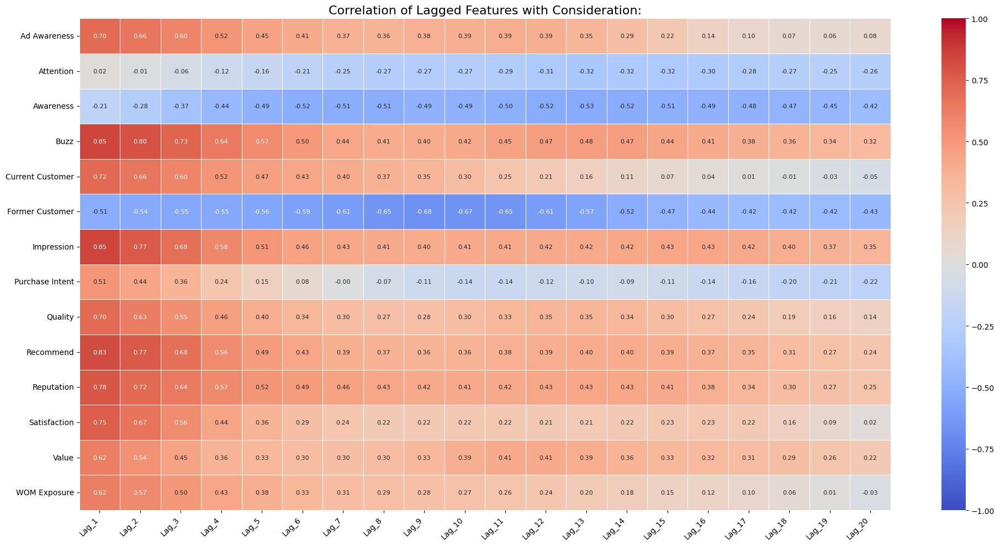

weekly_data_Red Bull.csv Filtered Weekly Lags
Lagged Correlations with |Correlation| > 0.4:
                     Lag_1     Lag_2     Lag_3     Lag_4     Lag_5     Lag_6  \
Ad Awareness      0.705247  0.659856  0.595138  0.510146  0.443899   0.40074   
Attention              NaN       NaN       NaN       NaN       NaN       NaN   
Awareness              NaN       NaN       NaN -0.424447 -0.475214 -0.504827   
Buzz              0.842282  0.789831  0.715236  0.623871  0.552498  0.487325   
Current Customer  0.716953  0.657465  0.582433  0.496566  0.443879  0.412201   
Former Customer  -0.508932 -0.533629 -0.547939 -0.542333 -0.552592 -0.584126   
Impression         0.82881  0.754427  0.662321  0.560462  0.496172  0.449068   
Purchase Intent   0.514123  0.444028       NaN       NaN       NaN       NaN   
Quality           0.681503  0.603011  0.527851  0.446269       NaN       NaN   
Recommend         0.816608  0.751949  0.662422  0.547042  0.481267  0.430198   
Reputation        0.769631  

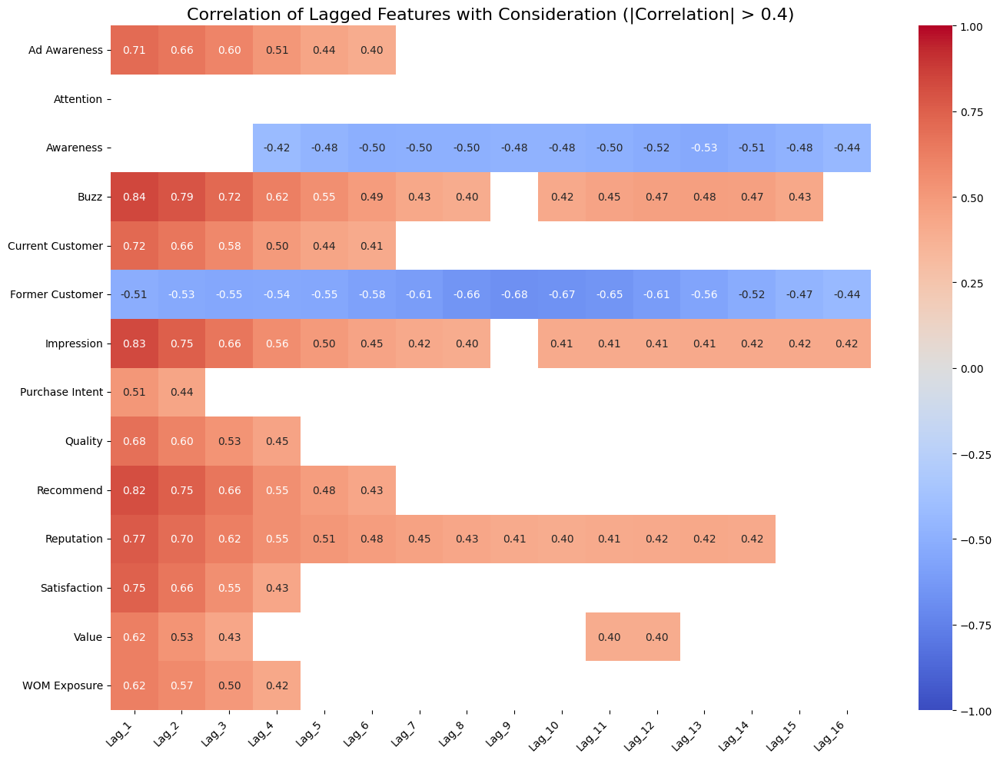

weekly_data_Power horse.csv
weekly_data_Power horse.csv Weekly Lags
Total Lagged Correlations:
                     Lag_1     Lag_2     Lag_3     Lag_4     Lag_5     Lag_6  \
Ad Awareness      0.622532   0.54838  0.502894  0.487382  0.517624  0.564569   
Attention         0.121336  0.061962  0.016695 -0.024005 -0.036774 -0.017136   
Awareness         0.512414  0.457623  0.421272  0.388152  0.388812  0.416353   
Buzz              0.768653  0.734189  0.693094  0.638652  0.603406  0.589885   
Current Customer  0.704977  0.612288  0.533415  0.467638  0.456835   0.49478   
Former Customer    0.02609  0.003935 -0.003024  0.008571  0.006435  0.013608   
Impression        0.726563  0.672664  0.619642  0.570923  0.566626  0.589921   
Purchase Intent   0.416341  0.316614   0.23635  0.175674  0.205307  0.277157   
Quality           0.782816  0.715382  0.646137  0.586469  0.569981  0.582075   
Recommend         0.702077  0.638016  0.582291  0.531897  0.520969  0.546646   
Reputation         0.7061

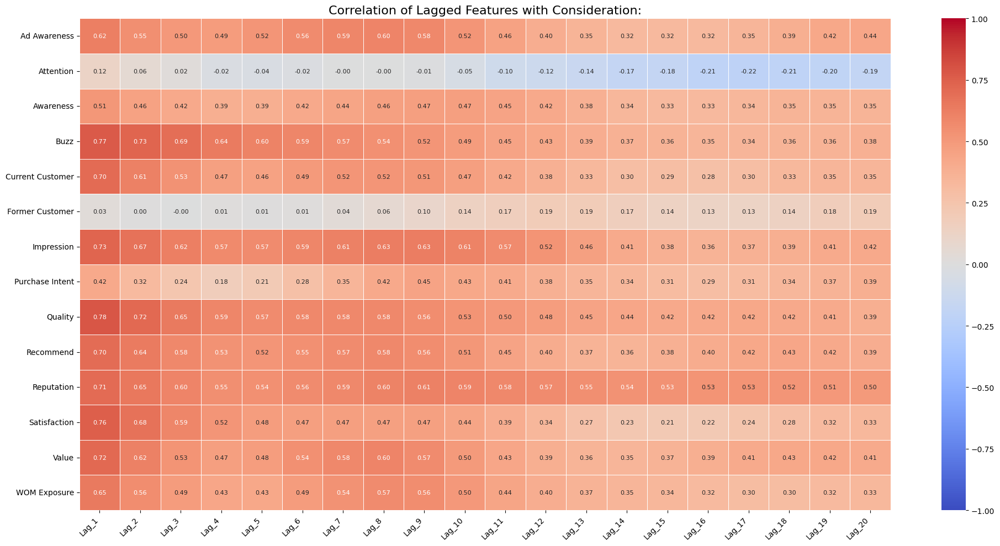

weekly_data_Power horse.csv Filtered Weekly Lags
Lagged Correlations with |Correlation| > 0.4:
                     Lag_1     Lag_2     Lag_3     Lag_4     Lag_5     Lag_6  \
Ad Awareness      0.627777  0.550654  0.502905  0.488974  0.521634  0.569575   
Attention              NaN       NaN       NaN       NaN       NaN       NaN   
Awareness         0.504642  0.448933  0.413784       NaN       NaN   0.41072   
Buzz              0.768725  0.733807  0.691643  0.637849     0.606  0.591512   
Current Customer  0.696047  0.601138  0.525368  0.462985  0.452111  0.487678   
Former Customer        NaN       NaN       NaN       NaN       NaN       NaN   
Impression        0.721739  0.668693  0.615723  0.570132  0.570065  0.592448   
Purchase Intent   0.409792       NaN       NaN       NaN       NaN       NaN   
Quality            0.76319  0.696062  0.631787  0.579563   0.56999  0.583838   
Recommend         0.699641  0.635527  0.581807  0.534455  0.525464  0.547915   
Reputation        0.70136

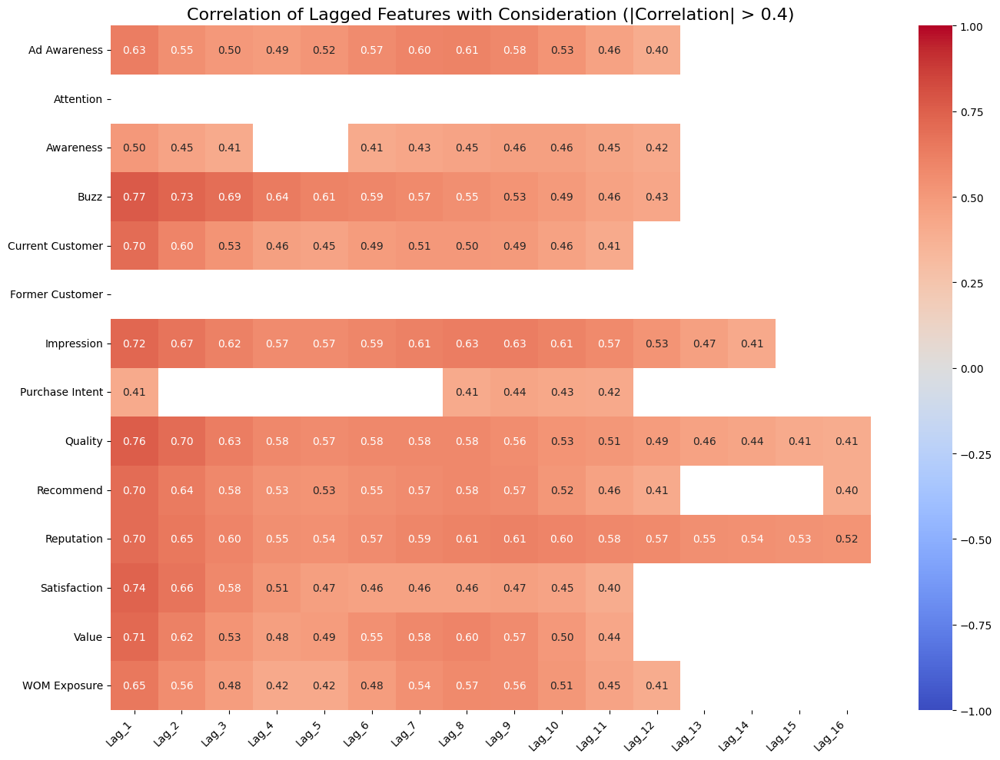

weekly_data_Sting.csv
weekly_data_Sting.csv Weekly Lags
Total Lagged Correlations:
                     Lag_1     Lag_2     Lag_3     Lag_4     Lag_5     Lag_6  \
Ad Awareness      0.559114  0.559751  0.566908   0.57779  0.591572  0.597976   
Attention         0.840929  0.840294  0.841971  0.847953  0.851654  0.856213   
Awareness         0.906942  0.908669  0.906653   0.90366  0.902658  0.902165   
Buzz              0.888224  0.881383  0.870439  0.856521  0.843117  0.834978   
Current Customer  0.849199  0.831478  0.818273  0.809204  0.809663  0.811063   
Former Customer   0.877113  0.875185  0.862322  0.844483  0.839136   0.84399   
Impression        0.913202  0.899435  0.887432  0.875977  0.873974  0.868058   
Purchase Intent   0.874736   0.85595  0.835966  0.813139  0.807676  0.801671   
Quality           0.910554  0.888824  0.877728  0.873856  0.875296  0.871068   
Recommend         0.906752  0.889263  0.870193  0.855742  0.857566  0.854081   
Reputation        0.869646  0.852311 

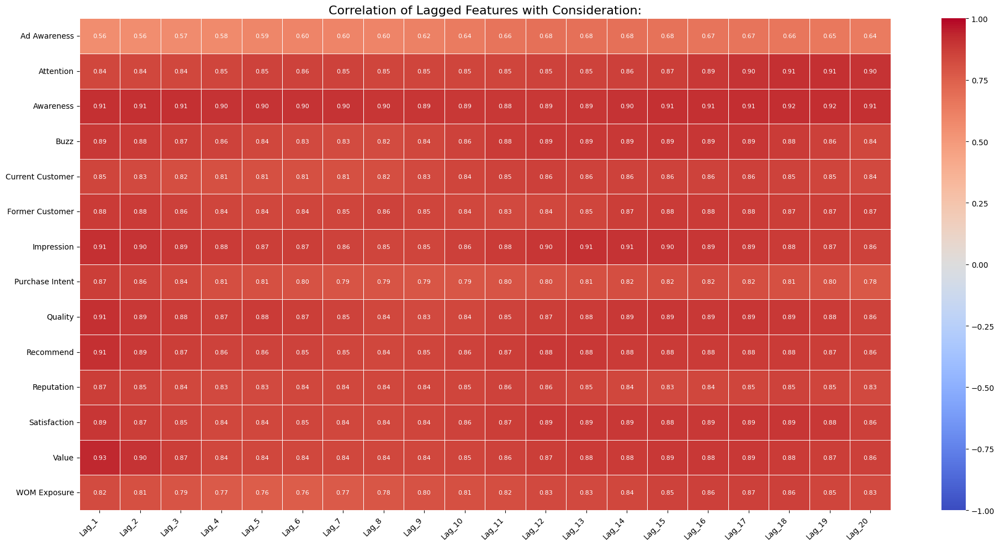

weekly_data_Sting.csv Filtered Weekly Lags
Lagged Correlations with |Correlation| > 0.4:
                     Lag_1     Lag_2     Lag_3     Lag_4     Lag_5     Lag_6  \
Ad Awareness      0.615405  0.613274  0.615799  0.622176  0.634952  0.642572   
Attention         0.860367  0.858945  0.859851  0.864553  0.868097  0.872459   
Awareness         0.916845  0.917173  0.914895   0.91219  0.912454  0.913055   
Buzz              0.901397  0.894683  0.884363  0.871589  0.860428  0.853696   
Current Customer  0.869824  0.854259  0.842024  0.833189  0.833068  0.833874   
Former Customer   0.871057  0.867307  0.856289  0.844094  0.845249   0.85417   
Impression        0.918342  0.905722  0.895192   0.88526  0.884453  0.879414   
Purchase Intent   0.883039  0.865991  0.847637  0.826169  0.819131  0.812457   
Quality           0.920383  0.900293  0.890026  0.886343  0.887775  0.884047   
Recommend         0.917437  0.900793  0.882961  0.869734  0.872083  0.869514   
Reputation        0.881479  0.8

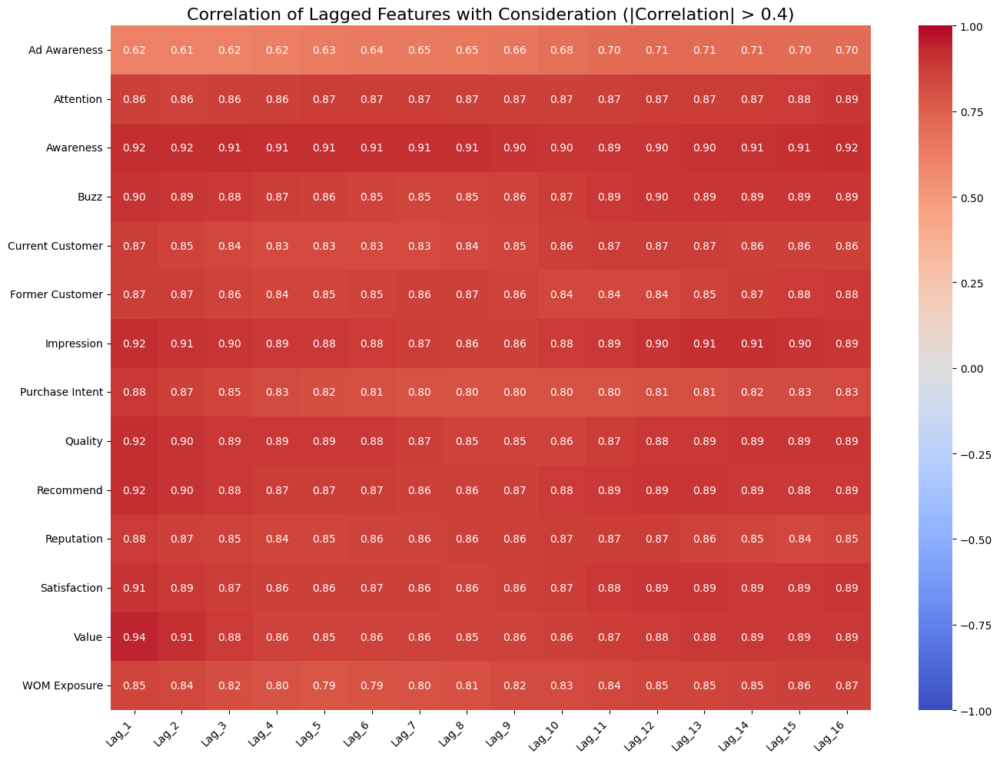


---

Monthly Cross Correlations

---

monthly_data_Red Bull.csv
monthly_data_Red Bull.csv Monthly Lags
Total Lagged Correlations:
                     Lag_1     Lag_2     Lag_3     Lag_4     Lag_5     Lag_6  \
Ad Awareness      0.633124  0.422583  0.474184  0.186504  0.082019  0.099625   
Attention         -0.09896 -0.238892 -0.150527 -0.187298 -0.274454 -0.346831   
Awareness        -0.380699 -0.592909 -0.520228 -0.612984 -0.635625 -0.466097   
Buzz              0.658782  0.419714  0.525328  0.423202  0.231167  0.149317   
Current Customer  0.619123  0.405818  0.240385  0.025697 -0.122104  -0.04006   
Former Customer  -0.620591 -0.705394 -0.554913 -0.435561 -0.502442 -0.471865   
Impression        0.609303  0.450955  0.499397  0.383012   0.23594  0.203619   
Purchase Intent   0.523392  0.036084  0.056146 -0.167512 -0.351175 -0.247373   
Quality           0.453501  0.364686  0.398845  0.122711  0.016447   0.13118   
Recommend         0.600228  0.369328  0.433024  0.334431  0.151249  0

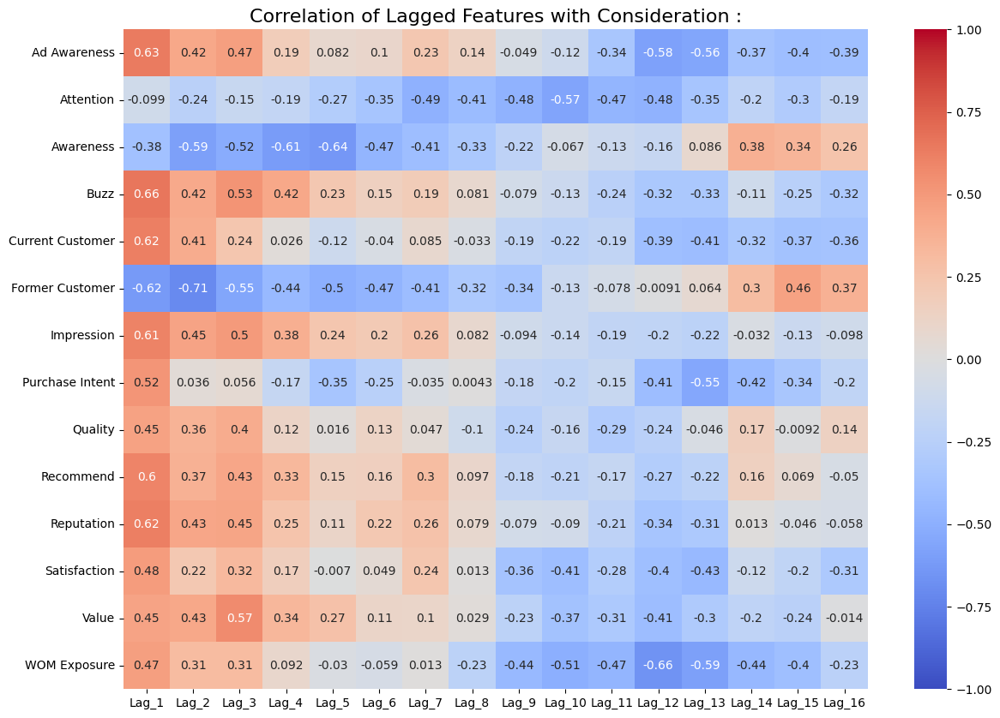

monthly_data_Red Bull.csv Filtered Monthly Lags
Lagged Correlations with |Correlation| > 0.4:
                     Lag_1     Lag_2     Lag_3     Lag_4     Lag_5     Lag_6  \
Ad Awareness      0.633124  0.422583  0.474184       NaN       NaN       NaN   
Attention              NaN       NaN       NaN       NaN       NaN       NaN   
Awareness              NaN -0.592909 -0.520228 -0.612984 -0.635625 -0.466097   
Buzz              0.658782  0.419714  0.525328  0.423202       NaN       NaN   
Current Customer  0.619123  0.405818       NaN       NaN       NaN       NaN   
Former Customer  -0.620591 -0.705394 -0.554913 -0.435561 -0.502442 -0.471865   
Impression        0.609303  0.450955  0.499397       NaN       NaN       NaN   
Purchase Intent   0.523392       NaN       NaN       NaN       NaN       NaN   
Quality           0.453501       NaN       NaN       NaN       NaN       NaN   
Recommend         0.600228       NaN  0.433024       NaN       NaN       NaN   
Reputation        0.620272

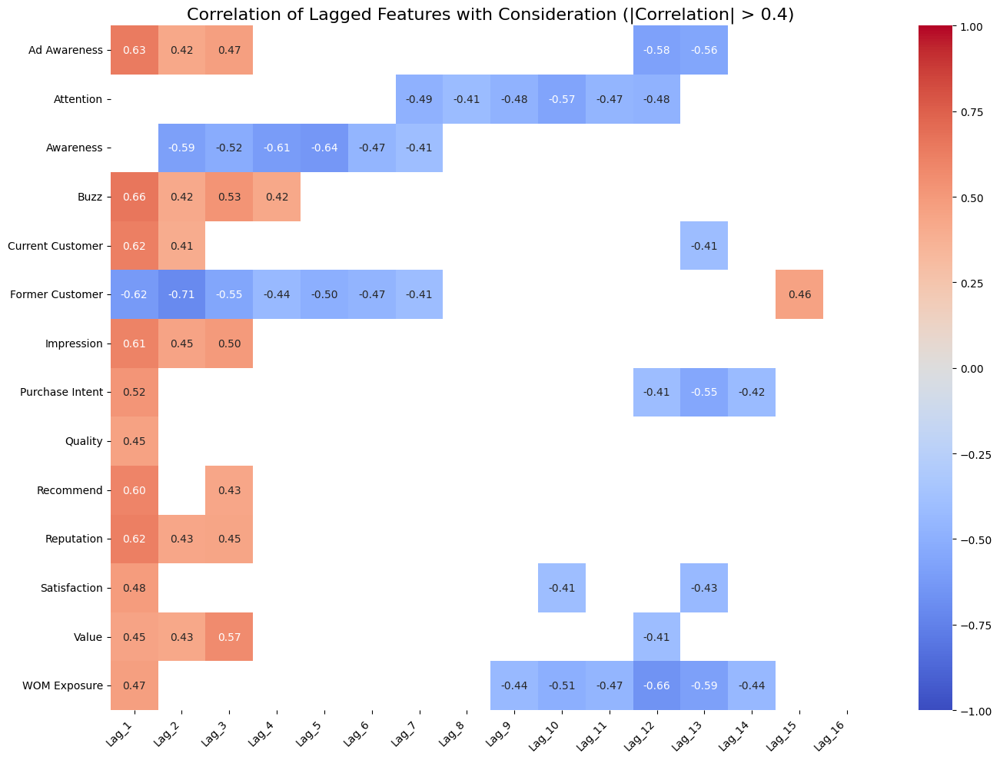

monthly_data_Power horse.csv
monthly_data_Power horse.csv Monthly Lags
Total Lagged Correlations:
                     Lag_1     Lag_2     Lag_3     Lag_4     Lag_5     Lag_6  \
Ad Awareness      0.659879  0.634657  0.438503  0.422254  0.484747  0.232095   
Attention         0.149568   0.01925  0.025443 -0.260223 -0.156166  -0.36208   
Awareness         0.556528  0.449389  0.364897  0.196944  0.401454  0.394235   
Buzz              0.775119  0.566934  0.517955  0.364708  0.319038   0.12028   
Current Customer  0.704648   0.73299  0.683811  0.491906  0.340228    0.0622   
Former Customer  -0.091279  -0.03385 -0.098877 -0.280396  0.052686  0.144634   
Impression        0.690603  0.669794  0.547127  0.430679  0.402769   0.13524   
Purchase Intent   0.102605  0.401246  0.584152  0.535484  0.679358  0.267923   
Quality           0.774558  0.608052  0.516527  0.357261  0.370401  0.281539   
Recommend         0.698674  0.563957   0.40597  0.308968  0.315477  0.294824   
Reputation         0.6

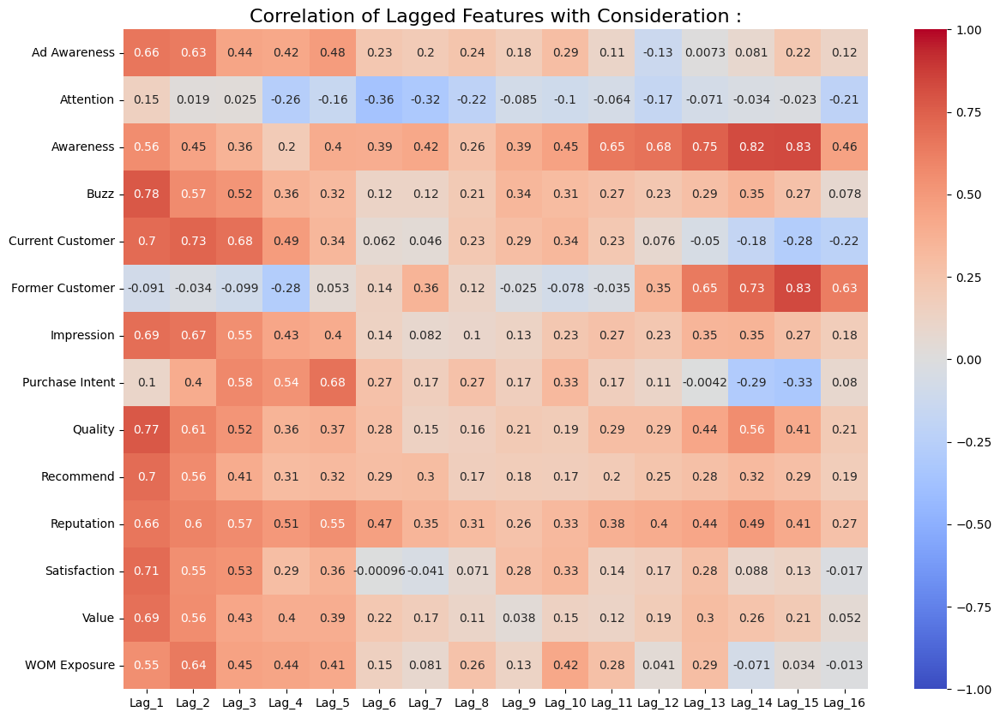

monthly_data_Power horse.csv Filtered Monthly Lags
Lagged Correlations with |Correlation| > 0.4:
                     Lag_1     Lag_2     Lag_3     Lag_4     Lag_5     Lag_6  \
Ad Awareness      0.659879  0.634657  0.438503  0.422254  0.484747       NaN   
Attention              NaN       NaN       NaN       NaN       NaN       NaN   
Awareness         0.556528  0.449389       NaN       NaN  0.401454       NaN   
Buzz              0.775119  0.566934  0.517955       NaN       NaN       NaN   
Current Customer  0.704648   0.73299  0.683811  0.491906       NaN       NaN   
Former Customer        NaN       NaN       NaN       NaN       NaN       NaN   
Impression        0.690603  0.669794  0.547127  0.430679  0.402769       NaN   
Purchase Intent        NaN  0.401246  0.584152  0.535484  0.679358       NaN   
Quality           0.774558  0.608052  0.516527       NaN       NaN       NaN   
Recommend         0.698674  0.563957   0.40597       NaN       NaN       NaN   
Reputation         0.65

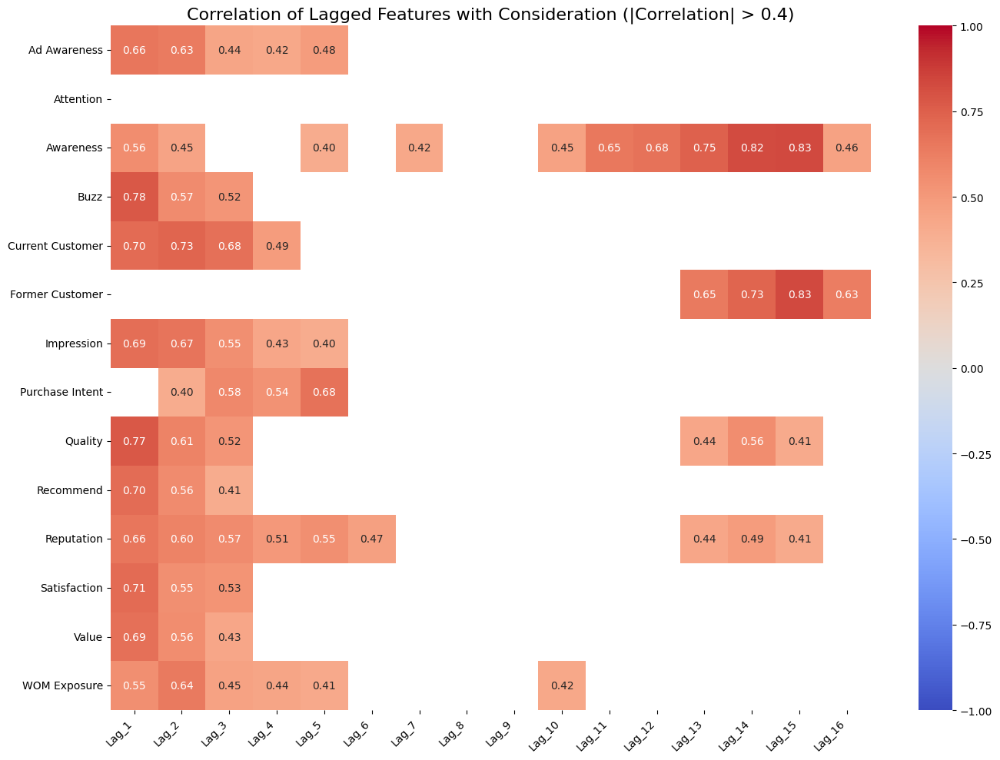

monthly_data_Sting.csv
monthly_data_Sting.csv Monthly Lags
Total Lagged Correlations:
                     Lag_1     Lag_2     Lag_3     Lag_4     Lag_5     Lag_6  \
Ad Awareness      0.221073  0.288873  0.406603  0.395464   0.25349  0.395349   
Attention         0.616524  0.601001  0.619327  0.790249  0.759899  0.798576   
Awareness         0.785826   0.74908  0.753957  0.830797  0.820204  0.822155   
Buzz              0.686266  0.633711  0.820305  0.799397  0.659204  0.778044   
Current Customer  0.546736  0.580361  0.673032  0.674749  0.590694  0.740871   
Former Customer   0.717963  0.695882    0.7565  0.816367  0.803112  0.801835   
Impression        0.791822  0.707992  0.842575  0.814803  0.632937  0.706619   
Purchase Intent   0.691211  0.621436  0.717926  0.708611   0.57344  0.690873   
Quality           0.747831  0.660817  0.769454  0.827432   0.63256  0.769376   
Recommend         0.708354  0.633898  0.782127   0.76105  0.626394  0.785536   
Reputation         0.71492   0.634

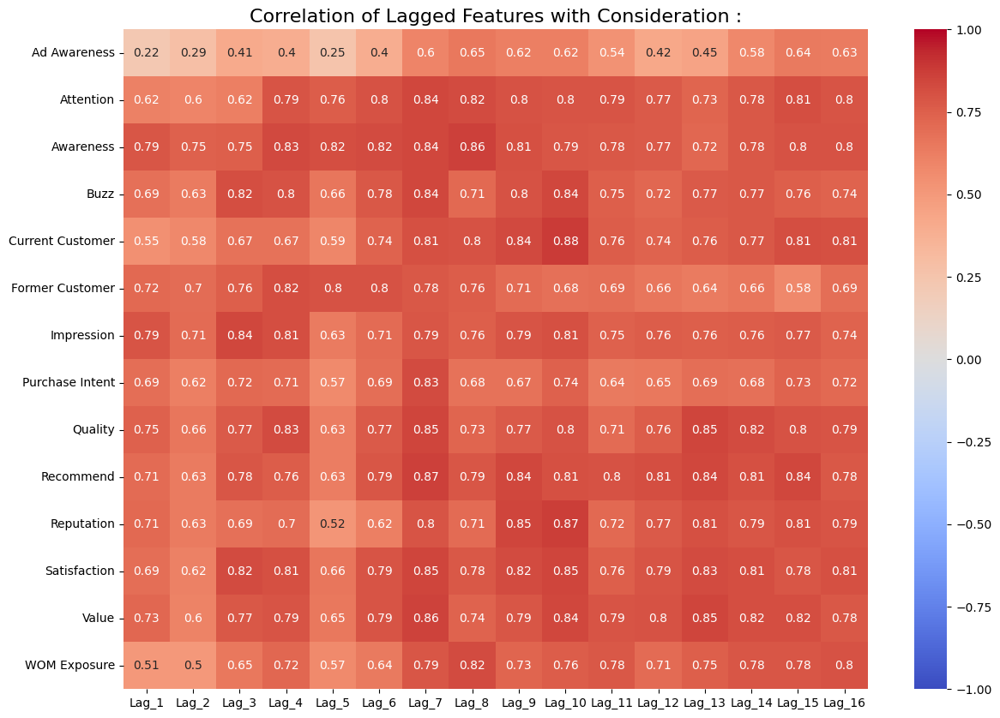

monthly_data_Sting.csv Filtered Monthly Lags
Lagged Correlations with |Correlation| > 0.4:
                     Lag_1     Lag_2     Lag_3     Lag_4     Lag_5     Lag_6  \
Ad Awareness           NaN       NaN  0.406603       NaN       NaN       NaN   
Attention         0.616524  0.601001  0.619327  0.790249  0.759899  0.798576   
Awareness         0.785826   0.74908  0.753957  0.830797  0.820204  0.822155   
Buzz              0.686266  0.633711  0.820305  0.799397  0.659204  0.778044   
Current Customer  0.546736  0.580361  0.673032  0.674749  0.590694  0.740871   
Former Customer   0.717963  0.695882    0.7565  0.816367  0.803112  0.801835   
Impression        0.791822  0.707992  0.842575  0.814803  0.632937  0.706619   
Purchase Intent   0.691211  0.621436  0.717926  0.708611   0.57344  0.690873   
Quality           0.747831  0.660817  0.769454  0.827432   0.63256  0.769376   
Recommend         0.708354  0.633898  0.782127   0.76105  0.626394  0.785536   
Reputation         0.71492   

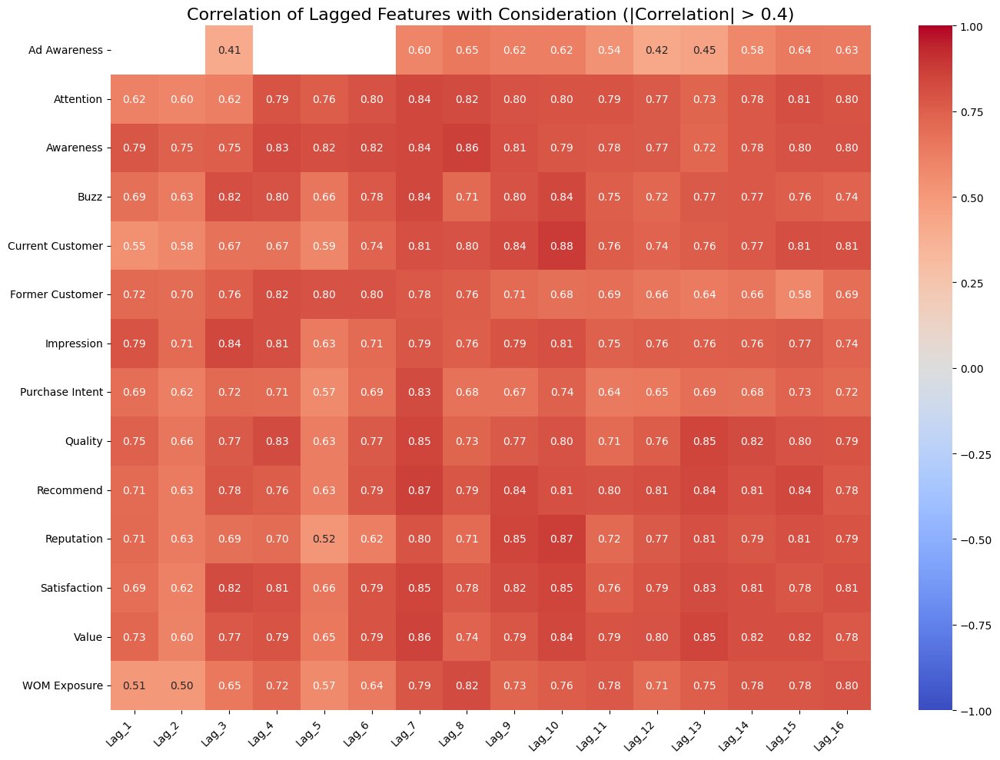

In [ ]:

!shell
!pip install streamlit
import streamlit as st
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from google.colab import files

# ... (Your existing code for brandindex_to_flat, brandindex_weekly, brandindex_monthly) ...

#st.title("Brand Index Analysis")

# Use session_state to store uploaded files
#if "uploaded_files" not in st.session_state:
#    st.session_state["uploaded_files"] = []

#uploaded_files = st.file_uploader("Upload multiple Excel files", accept_multiple_files=True, key="file_uploader")

#if uploaded_files:
#    st.session_state["uploaded_files"] = uploaded_files  # Store in session_state

#if st.session_state["uploaded_files"]:  # Access from session_state

# Initialize week_results and month_results before the if statement
week_results = []
month_results = []

if uploaded_files:
    daily_dfs = []
    weekly_dfs = []
    monthly_dfs = []
    file_paths_uploaded = []
    week_results = []
    month_results = []
    # Create a temporary directory to store uploaded files
    os.makedirs("tempDir", exist_ok=True)


    for filename, uploaded_file in uploaded_files:
      # Save the uploaded file to a temporary location
      with open(os.path.join("tempDir", filename),"wb") as f:
          # uploaded_file is already a bytes-like object, write it directly
          f.write(uploaded_file[filename])


      file_path = os.path.join("/content/tempDir", filename)
      print(file_path)

      # Call the functions
      #try:
      daily_df, daily_file_name = brandindex_to_flat(file_path)
      print(daily_df)
      weekly_sums, weekly_file_name = brandindex_weekly(daily_df, file_path)
      if Additional_columns == 'y':
        monthly_sums, monthly_file_name = brandindex_monthly_with_additional_data(daily_df, file_path)
      else:
        monthly_sums, monthly_file_name = brandindex_monthly(daily_df, file_path)

      daily_dfs.append(daily_df)
      weekly_dfs.append(weekly_sums)
      monthly_dfs.append(monthly_sums)
      file_paths_uploaded.append(file_path)
      week_results.append((weekly_sums, weekly_file_name))
      month_results.append((monthly_sums, monthly_file_name))

      #except Exception as e:
      #    st.error(f"Error processing file {filename}: {e}")

# Define dependent and independent variables
#dependent_var = 'Consideration'
# Exclude extra fields from independent variables
#independent_vars = df.columns.difference([dependent_var, 'Date', second_dependent_var,'Volume'])
#independent_vars = daily_df.columns.difference([dependent_var, 'Date','Volume'])

print_subheading("Weekly Cross Correlations")
#second_dependent_var = 'Purchase Intent'

for weekly_sums, weekly_file_name in week_results:
    print('\033[1m' + weekly_file_name + '\033[0m')  # Using ANSI escape codes for bold formatting
    df = weekly_sums.copy()
    dependent_var = Weekly_Dep_Var
    independent_vars = df.columns.difference([dependent_var, 'Date', 'Volume'])  # Redefine independent_vars based on df
    #print_subheading("Weekly Lags")
    print('\033[1m' + weekly_file_name + " Weekly Lags" + '\033[0m')
    weekly_cross_correlation(file_path,df,independent_vars,dependent_var)
    #print_subheading("Weekly Filtered Lags (Above 0.4)")
    print('\033[1m' + weekly_file_name + " Filtered Weekly Lags" + '\033[0m')
    monthly_filtered_cross_correlation(file_path,df,independent_vars,dependent_var)

print_subheading("Monthly Cross Correlations")

for monthly_sums, monthly_file_name in month_results:
    print('\033[1m' + monthly_file_name + '\033[0m')  # Using ANSI escape codes for bold formatting
    df = monthly_sums.copy()
    # Define dependent and independent variables
    dependent_var = Monthly_Dep_Var
    #second_dependent_var = 'Purchase Intent'
    # Exclude extra fields from independent variables
    #independent_vars = df.columns.difference([dependent_var, 'Date', second_dependent_var,'Volume'])
    independent_vars = df.columns.difference([dependent_var, 'Date','Volume'])
    print('\033[1m' + monthly_file_name + " Monthly Lags" + '\033[0m')
    #print_subheading("Monthly Lags")
    monthly_cross_correlation(file_path,df,independent_vars,dependent_var)
    print('\033[1m' + monthly_file_name + " Filtered Monthly Lags" + '\033[0m')
    #print_subheading("Monthly Filtered Lags (Above 0.4)")
    monthly_filtered_cross_correlation(file_path,df,independent_vars,dependent_var)




weekly_data_Red Bull.csv
weekly_data_Power horse.csv
weekly_data_Sting.csv
monthly_data_Red Bull.csv
monthly_data_Power horse.csv
monthly_data_Sting.csv


<ipython-input-14-52db4ccec744>:41: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annotations = heatmap_data['Correlation'].applymap(lambda x: f'{x:.2f}' if not pd.isna(x) else '')
<ipython-input-14-52db4ccec744>:44: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  best_lag_data = heatmap_data['Best Lag'].applymap(lambda x: f'(Lag {int(x)})' if not pd.isna(x) else '')
<ipython-input-14-52db4ccec744>:47: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annotations = annotations.applymap(lambda x: textwrap.fill(x, width=10))  # Adjust width as needed
<ipython-input-14-52db4ccec744>:50: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annotations = annotations + ' ' + best_lag_data.applymap(lambda x: textwrap.fill(x, width=10))


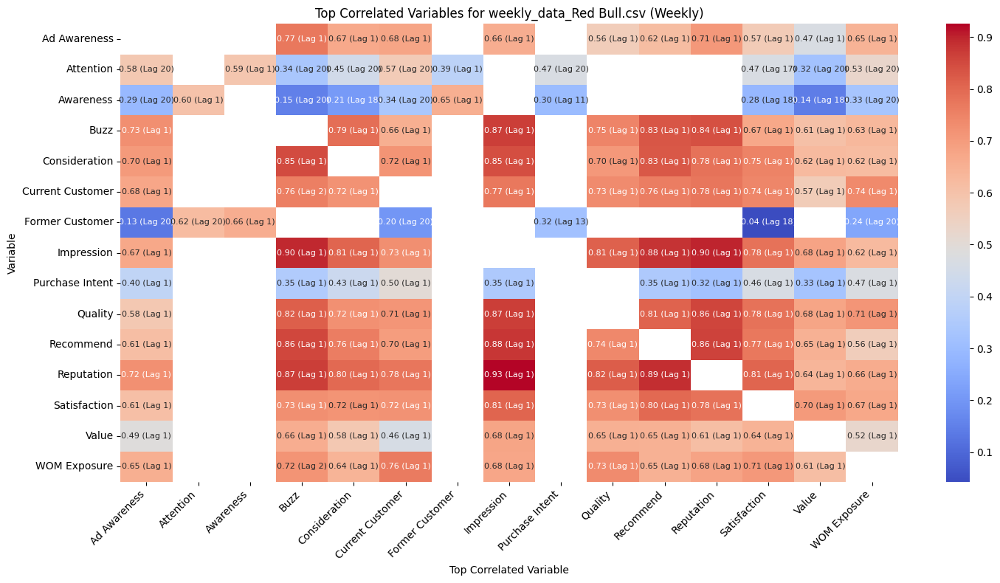

<ipython-input-14-52db4ccec744>:41: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annotations = heatmap_data['Correlation'].applymap(lambda x: f'{x:.2f}' if not pd.isna(x) else '')
<ipython-input-14-52db4ccec744>:44: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  best_lag_data = heatmap_data['Best Lag'].applymap(lambda x: f'(Lag {int(x)})' if not pd.isna(x) else '')
<ipython-input-14-52db4ccec744>:47: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annotations = annotations.applymap(lambda x: textwrap.fill(x, width=10))  # Adjust width as needed
<ipython-input-14-52db4ccec744>:50: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annotations = annotations + ' ' + best_lag_data.applymap(lambda x: textwrap.fill(x, width=10))


<Figure size 640x480 with 0 Axes>

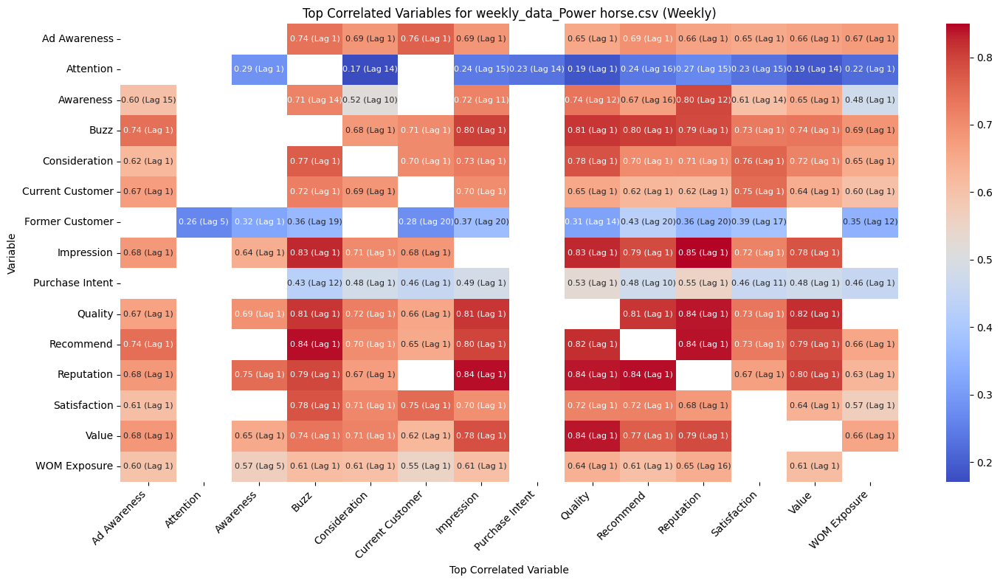

<ipython-input-14-52db4ccec744>:41: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annotations = heatmap_data['Correlation'].applymap(lambda x: f'{x:.2f}' if not pd.isna(x) else '')
<ipython-input-14-52db4ccec744>:44: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  best_lag_data = heatmap_data['Best Lag'].applymap(lambda x: f'(Lag {int(x)})' if not pd.isna(x) else '')
<ipython-input-14-52db4ccec744>:47: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annotations = annotations.applymap(lambda x: textwrap.fill(x, width=10))  # Adjust width as needed
<ipython-input-14-52db4ccec744>:50: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annotations = annotations + ' ' + best_lag_data.applymap(lambda x: textwrap.fill(x, width=10))


<Figure size 640x480 with 0 Axes>

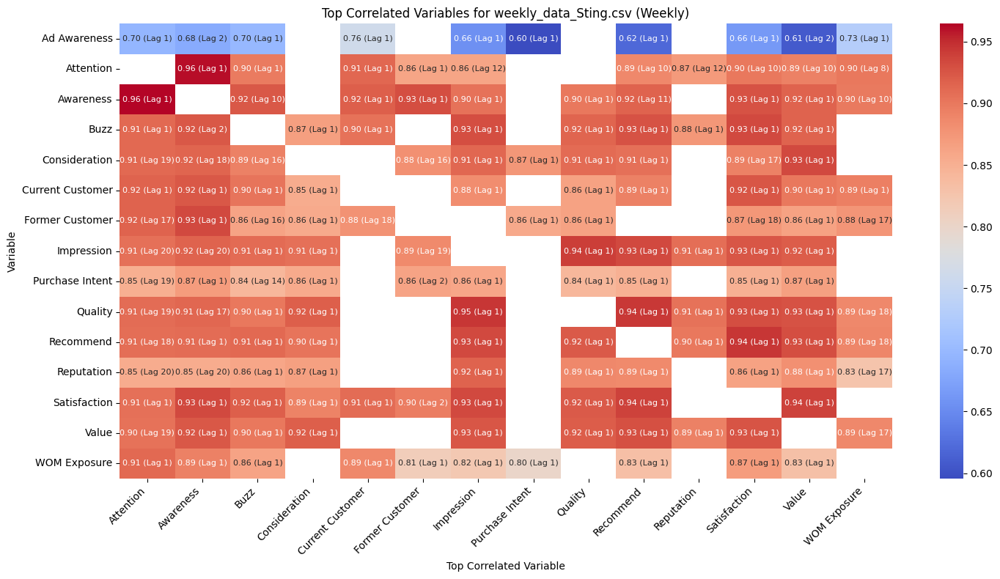

<ipython-input-14-52db4ccec744>:76: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annotations = heatmap_data['Correlation'].applymap(lambda x: f'{x:.2f}' if not pd.isna(x) else '')
<ipython-input-14-52db4ccec744>:79: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  best_lag_data = heatmap_data['Best Lag'].applymap(lambda x: f'(Lag {int(x)})' if not pd.isna(x) else '')
<ipython-input-14-52db4ccec744>:82: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annotations = annotations.applymap(lambda x: textwrap.fill(x, width=10))  # Adjust width as needed
<ipython-input-14-52db4ccec744>:85: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annotations = annotations + ' ' + best_lag_data.applymap(lambda x: textwrap.fill(x, width=10))


<Figure size 640x480 with 0 Axes>

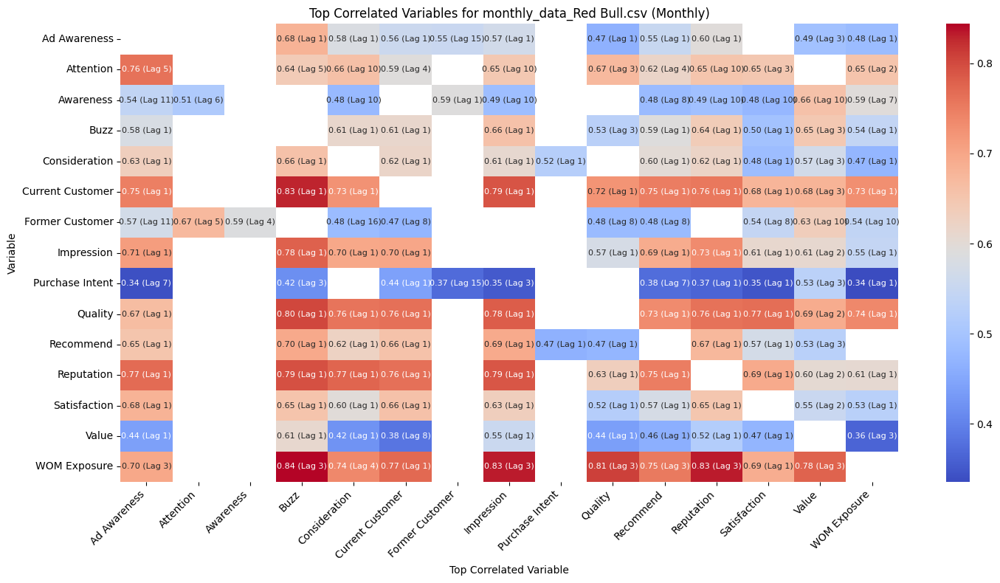

<ipython-input-14-52db4ccec744>:76: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annotations = heatmap_data['Correlation'].applymap(lambda x: f'{x:.2f}' if not pd.isna(x) else '')
<ipython-input-14-52db4ccec744>:79: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  best_lag_data = heatmap_data['Best Lag'].applymap(lambda x: f'(Lag {int(x)})' if not pd.isna(x) else '')
<ipython-input-14-52db4ccec744>:82: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annotations = annotations.applymap(lambda x: textwrap.fill(x, width=10))  # Adjust width as needed
<ipython-input-14-52db4ccec744>:85: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annotations = annotations + ' ' + best_lag_data.applymap(lambda x: textwrap.fill(x, width=10))


<Figure size 640x480 with 0 Axes>

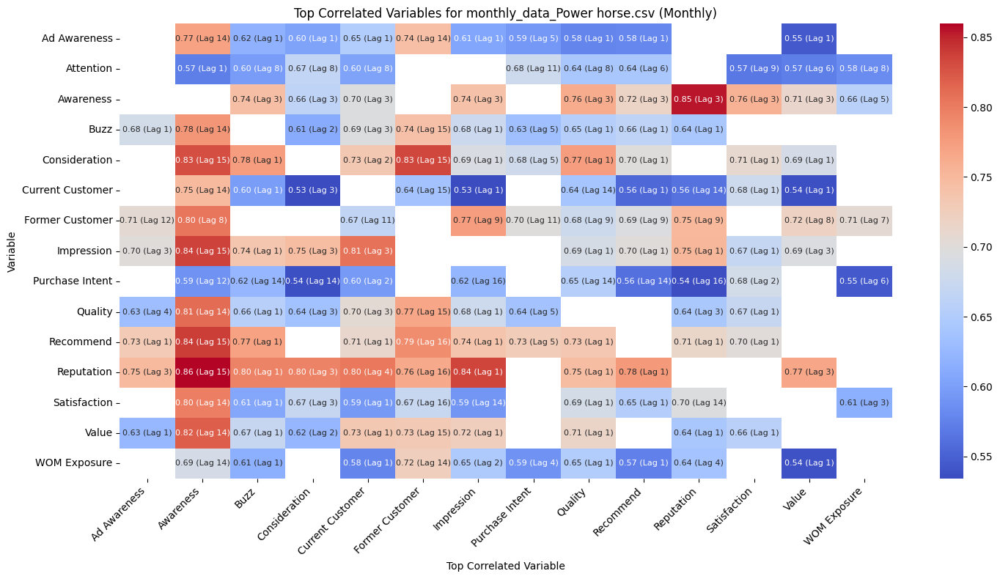

<ipython-input-14-52db4ccec744>:76: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annotations = heatmap_data['Correlation'].applymap(lambda x: f'{x:.2f}' if not pd.isna(x) else '')
<ipython-input-14-52db4ccec744>:79: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  best_lag_data = heatmap_data['Best Lag'].applymap(lambda x: f'(Lag {int(x)})' if not pd.isna(x) else '')
<ipython-input-14-52db4ccec744>:82: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annotations = annotations.applymap(lambda x: textwrap.fill(x, width=10))  # Adjust width as needed
<ipython-input-14-52db4ccec744>:85: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annotations = annotations + ' ' + best_lag_data.applymap(lambda x: textwrap.fill(x, width=10))


<Figure size 640x480 with 0 Axes>

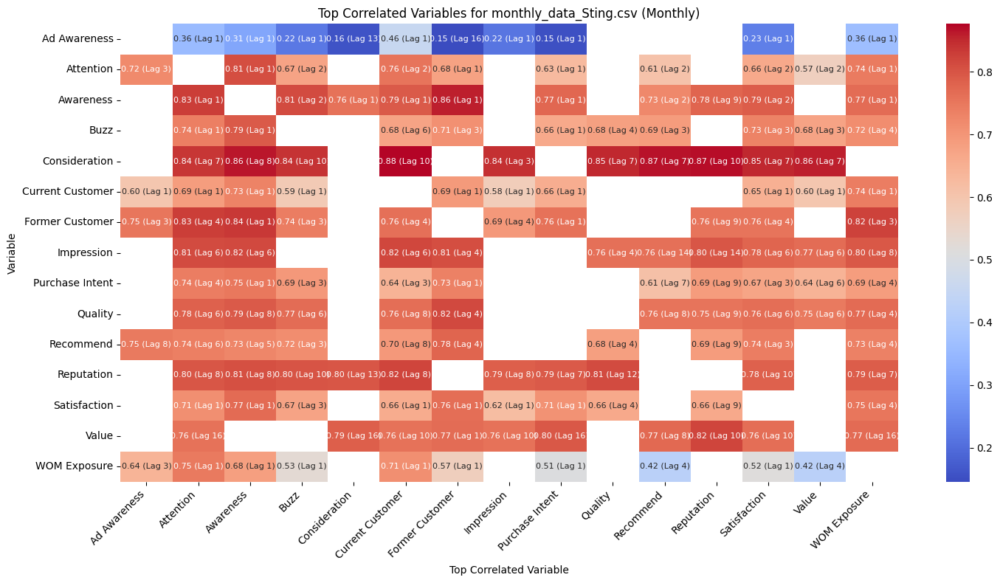

<Figure size 640x480 with 0 Axes>

In [ ]:

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import textwrap

# Store correlation results in separate DataFrames
weekly_correlation_results_dfs = []
monthly_correlation_results_dfs = []

for weekly_sums, weekly_file_name in week_results:
    print('\033[1m' + weekly_file_name + '\033[0m')
    df = weekly_sums.copy()
    dependent_var = Weekly_Dep_Var
    #independent_vars = df.columns.difference([dependent_var, 'Date', 'Volume'])
    independent_vars = df.columns.difference(['Date', 'Volume'])

    correlation_results = find_top_correlated_variables(df, list(independent_vars), dependent_var, Weekly_Max_Lag)
    weekly_correlation_results_dfs.append((correlation_results, weekly_file_name))


for monthly_sums, monthly_file_name in month_results:
    print('\033[1m' + monthly_file_name + '\033[0m')
    df = monthly_sums.copy()
    dependent_var = Monthly_Dep_Var
    #independent_vars = df.columns.difference([dependent_var, 'Date', 'Volume'])
    independent_vars = df.columns.difference(['Date', 'Volume'])

    correlation_results = find_top_correlated_variables(df, list(independent_vars), dependent_var, Monthly_Max_Lag)
    monthly_correlation_results_dfs.append((correlation_results, monthly_file_name))


# Visualize and save correlation results
for correlation_results, file_name in weekly_correlation_results_dfs:

    # Create a pivot table with both Correlation and Best Lag
    heatmap_data = correlation_results.pivot_table(index='Variable',
                                                columns='Top Correlated Variable',
                                                values=['Correlation', 'Best Lag'])

    # Create annotations only for the 'Correlation' part
    annotations = heatmap_data['Correlation'].applymap(lambda x: f'{x:.2f}' if not pd.isna(x) else '')

    # Access the 'Best Lag' part separately
    best_lag_data = heatmap_data['Best Lag'].applymap(lambda x: f'(Lag {int(x)})' if not pd.isna(x) else '')

    # Wrap long text in annotations
    annotations = annotations.applymap(lambda x: textwrap.fill(x, width=10))  # Adjust width as needed

    # Combine annotations with lag information (also wrap if needed)
    annotations = annotations + ' ' + best_lag_data.applymap(lambda x: textwrap.fill(x, width=10))

    # Plot the heatmap with annotations for 'Correlation'
    plt.figure(figsize=(15, 8))
    sns.heatmap(heatmap_data['Correlation'], annot=annotations, cmap='coolwarm', fmt='', annot_kws={"size": 8})  # Adjust size as needed
    plt.title(f"Top Correlated Variables for {file_name} (Weekly)")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # Save the chart to a file
    plt.savefig(f"{file_name}_weekly_correlation_chart.png")

    # Save the DataFrame to a CSV file
    correlation_results.to_csv(f"{file_name}_weekly_correlation_results.csv", index=False)




for correlation_results, file_name in monthly_correlation_results_dfs:
    # Create a pivot table with both Correlation and Best Lag
    heatmap_data = correlation_results.pivot_table(index='Variable',
                                                columns='Top Correlated Variable',
                                                values=['Correlation', 'Best Lag'])

    # Create annotations only for the 'Correlation' part
    annotations = heatmap_data['Correlation'].applymap(lambda x: f'{x:.2f}' if not pd.isna(x) else '')

    # Access the 'Best Lag' part separately
    best_lag_data = heatmap_data['Best Lag'].applymap(lambda x: f'(Lag {int(x)})' if not pd.isna(x) else '')

    # Wrap long text in annotations
    annotations = annotations.applymap(lambda x: textwrap.fill(x, width=10))  # Adjust width as needed

    # Combine annotations with lag information (also wrap if needed)
    annotations = annotations + ' ' + best_lag_data.applymap(lambda x: textwrap.fill(x, width=10))

    # Plot the heatmap with annotations for 'Correlation'
    plt.figure(figsize=(15, 8))
    sns.heatmap(heatmap_data['Correlation'], annot=annotations, cmap='coolwarm', fmt='', annot_kws={"size": 8})  # Adjust size as needed
    plt.title(f"Top Correlated Variables for {file_name} (Monthly)")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # Save the chart to a file
    plt.savefig(f"{file_name}_weekly_correlation_chart.png")

    # Save the DataFrame to a CSV file
    correlation_results.to_csv(f"{file_name}_weekly_correlation_results.csv", index=False)


In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import rgb_to_hsv, hex2color

def build_network_diagram(correlation_dfs, dependent_var, correlation_threshold, max_indirect_features, w_corr, w_cent, top_x_features, max_lag_limit, file_name):
    # Initialize directed graph and relationship storage
    G = nx.DiGraph()
    relationships = []
    all_lags = []
    node_positions = {}
    edge_colors = {}

    # Add dependent variable node with cumulative lag as 0
    G.add_node(f"{dependent_var} (Lag 0)", color=get_color(dependent_var))
    node_positions[f"{dependent_var} (Lag 0)"] = 0

    # Step 1: Gather all relationships
    for correlation_df, time_frame in correlation_dfs:
        filtered_df = correlation_df[correlation_df['Correlation'] >= correlation_threshold]
        top_features = filtered_df[filtered_df['Variable'] == dependent_var].nlargest(top_x_features, 'Correlation')

        if top_features.empty:
            print(f"No top features found for {file_name} with the current correlation threshold.")
            return
        elif len(top_features) < top_x_features:
            print(f"Only {len(top_features)} top features found for {dependent_var} instead of the specified {top_x_features}.")

        # First-level relationships (dependent -> top features)
        for _, row in top_features.iterrows():
            feature, lag, corr = row['Top Correlated Variable'], row['Best Lag'], row['Correlation']
            relationships.append((feature, dependent_var, lag, lag, corr, 'first'))
            all_lags.append(lag)

        # Second-level relationships
        first_level_features = {r[0] for r in relationships if r[5] == 'first'}
        for _, top_row in top_features.iterrows():
            top_feature = top_row['Top Correlated Variable']
            top_lag = top_row['Best Lag']
            indirect_features = filtered_df[
                (filtered_df['Variable'] == top_feature) &
                (~filtered_df['Top Correlated Variable'].isin(first_level_features)) &
                (filtered_df['Top Correlated Variable'] != dependent_var)
            ].nlargest(max_indirect_features, 'Correlation')

            for _, indirect_row in indirect_features.iterrows():
                indirect_feature = indirect_row['Top Correlated Variable']
                indirect_lag = indirect_row['Best Lag']
                indirect_corr = indirect_row['Correlation']
                cumulative_lag = top_lag + indirect_lag
                relationships.append((indirect_feature, top_feature, indirect_lag, cumulative_lag, indirect_corr, 'second'))
                all_lags.append(cumulative_lag)

        # Third-level relationships
        second_level_features = {r[0] for r in relationships if r[5] == 'second'}
        for sec_feature in second_level_features:
            sec_cumulative_lag = min(r[3] for r in relationships if r[0] == sec_feature and r[5] == 'second')
            third_level_features = filtered_df[
                (filtered_df['Variable'] == sec_feature) &
                (~filtered_df['Top Correlated Variable'].isin(first_level_features | second_level_features)) &
                (filtered_df['Top Correlated Variable'] != dependent_var)
            ].nlargest(max_indirect_features, 'Correlation')

            for _, third_row in third_level_features.iterrows():
                third_feature = third_row['Top Correlated Variable']
                third_lag = third_row['Best Lag']
                third_corr = third_row['Correlation']
                cumulative_lag = sec_cumulative_lag + third_lag
                relationships.append((third_feature, sec_feature, third_lag, cumulative_lag, third_corr, 'third'))
                all_lags.append(cumulative_lag)

    # Debug: Print the relationships table for verification
    relationships_df = pd.DataFrame(relationships, columns=['Feature', 'Target', 'Lag with Target', 'Cumulative Lag', 'Correlation', 'Level'])
    print(f"\nRelationships table for {file_name}:\n", relationships_df)
    relationships_df.to_csv(f"{file_name}_relationships.csv", index=False)

    # Step 2: Calculate density-based, non-overlapping lag ranges
    lag_ranges = generate_density_based_non_overlapping_segments(all_lags, num_segments=5)
    print("Density-Based Non-Overlapping Lag Ranges:", lag_ranges)  # Debugging output to verify ranges

    # Step 3: Place nodes and edges by level
    for level in ['first', 'second', 'third']:
        level_relationships = [r for r in relationships if r[5] == level]

        for feature, target, lag, cumulative_lag, corr, _ in level_relationships:
            segment = get_lag_segment(cumulative_lag, lag_ranges)
            src_node_name = f"{feature} (Lag {segment})"

            if target == dependent_var:
                target_node_name = f"{target} (Lag 0)"
            else:
                target_cumulative_lag = min(r[3] for r in relationships if r[0] == target)
                target_segment = get_lag_segment(target_cumulative_lag, lag_ranges)
                target_node_name = f"{target} (Lag {target_segment})"

            # Add nodes if not already added
            if src_node_name not in node_positions:
                G.add_node(src_node_name, color=get_color(feature))
                node_positions[src_node_name] = cumulative_lag

            if target_node_name not in node_positions:
                node_positions[target_node_name] = target_cumulative_lag

            # Add edge and set color
            edge_colors[(src_node_name, target_node_name)] = 'red' if level == 'first' else 'black'
            G.add_edge(src_node_name, target_node_name, weight=corr, label=f"Lag {lag}: {corr:.2f}")

    # Step 4: Visualize with calculated positions
    fig, ax = plt.subplots(figsize=(15, 10))
    pos = create_adaptive_lag_layout(G, node_positions, dependent_var, lag_ranges)

    # Draw nodes
    nx.draw_networkx_nodes(G, pos, node_color=[G.nodes[node].get('color', 'gray') for node in G], node_shape="s", node_size=2000, ax=ax)
    nx.draw_networkx_labels(G, pos, labels={node: node.split(" (")[0] for node in G.nodes}, font_size=9, ax=ax)

    # Draw edges and edge labels
    nx.draw_networkx_edges(G, pos, edge_color=[edge_colors[edge] for edge in G.edges], arrows=True, ax=ax)
    edge_labels = nx.get_edge_attributes(G, 'label')
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=8, ax=ax)

    # Add dynamic segment headers
    num_lags = len(lag_ranges)
    stage_width = 1 / (num_lags + 1)  # Calculate stage width here

    for i, (start, end) in enumerate(lag_ranges):
        x = 1 - (i + 1) * stage_width + (stage_width * 0.15)  # Adjust header slightly to the left
        ax.text(x, 1.05, f"Lag {start}-{end}", ha='center', va='center', fontsize=12, fontweight='bold', transform=ax.transAxes)

    plt.title(f"Brand Pattern for {file_name}")
    plt.axis('off')
    plt.show()
    return relationships_df, file_name

# Supporting Functions

def get_color(feature_name):
    visibility_features = ['Ad Awareness', 'Attention', 'Awareness']
    vibrancy_features = ['Buzz', 'WOM Exposure']
    variability_features = ['Impression', 'Quality', 'Reputation', 'Value']
    if feature_name in visibility_features:
        return '#FFC0CB'
    elif feature_name in vibrancy_features:
        return '#FFA500'
    elif feature_name in variability_features:
        return '#008000'
    else:
        return '#ADD8E6'

def generate_density_based_non_overlapping_segments(all_lags, num_segments=5):
    """Generate exactly 5 non-overlapping lag segments based on the density (quantiles) of cumulative lags."""
    sorted_lags = np.sort(all_lags)
    unique_lags = np.unique(sorted_lags)  # Get unique values to avoid duplicate quantiles
    quantiles = np.linspace(0, 1, num_segments + 1)
    segment_edges = np.quantile(unique_lags, quantiles)

    lag_ranges = []
    previous_end = None

    for i in range(num_segments):
        start = int(segment_edges[i])
        # Ensure the last segment includes the highest lag value
        end = int(segment_edges[i + 1]) if i < num_segments - 1 else int(segment_edges[i + 1])

        # Avoid overlaps by setting each segment's `start` to follow directly after the previous segment's `end`
        if previous_end is not None and start <= previous_end:
            start = previous_end + 1

        # If we have a gap, adjust the start to close it
        if previous_end is not None and start > previous_end + 1:
            start = previous_end + 1

        # Add the segment to lag_ranges
        lag_ranges.append((start, end))
        previous_end = end  # Update previous_end for the next iteration

    # Final adjustment: ensure exactly 5 segments with non-overlapping ranges covering all lags
    if len(lag_ranges) < num_segments:
        min_lag, max_lag = min(all_lags), max(all_lags)
        interval = max((max_lag - min_lag) // num_segments, 1)

        lag_ranges = [(min_lag + i * interval, min(min_lag + (i + 1) * interval - 1, max_lag)) for i in range(num_segments)]

    return lag_ranges


def create_adaptive_lag_layout(G, node_positions, dependent_var, lag_ranges):
    """Adaptive layout to organize nodes by non-overlapping lag stages from right to left."""
    pos = {}
    num_lags = len(lag_ranges)
    stage_width = 1 / (num_lags + 1)  # Space each stage evenly

    # Place the dependent variable node on the far right
    dependent_node_name = f"{dependent_var} (Lag 0)"
    pos[dependent_node_name] = (1, 0.5)

    # Group nodes by their cumulative lag and assign positions within each lag segment
    nodes_by_lag = sorted(node_positions.items(), key=lambda x: x[1])

    for node, cumulative_lag in nodes_by_lag:
        if node == dependent_node_name:
            continue

        try:
            column = next(i for i, (start, end) in enumerate(lag_ranges) if start <= cumulative_lag <= end)
            x = 1 - (column + 1) * stage_width
            start, end = lag_ranges[column]
            segment_nodes = [n for n, l in nodes_by_lag if start <= l <= end]
            y_spacing = 1 / (len(segment_nodes) + 1)
            y_index = segment_nodes.index(node) + 1
            y = y_index * y_spacing + np.random.uniform(-0.05, 0.05)

            pos[node] = (x, y)
        except StopIteration:
            print(f"Warning: Node '{node}' with cumulative lag {cumulative_lag} has no matching lag range.")

    return pos

def get_lag_segment(lag, lag_ranges):
    for start, end in lag_ranges:
        if start <= lag <= end:
            return f"{start}-{end}"
    return f"{lag_ranges[-1][0]}-{lag_ranges[-1][1]}"


Generating network diagram for monthly_data_Red Bull.csv...

Relationships table for monthly_data_Red Bull.csv:
              Feature            Target  Lag with Target  Cumulative Lag  \
0               Buzz     Consideration                1               1   
1       Ad Awareness     Consideration                1               1   
2         Reputation     Consideration                1               1   
3   Current Customer     Consideration                1               1   
4         Impression     Consideration                1               1   
5              Value              Buzz                3               4   
6          Recommend              Buzz                1               2   
7       WOM Exposure              Buzz                1               2   
8            Quality              Buzz                3               4   
9       Satisfaction              Buzz                1               2   
10   Former Customer      Ad Awareness               15       

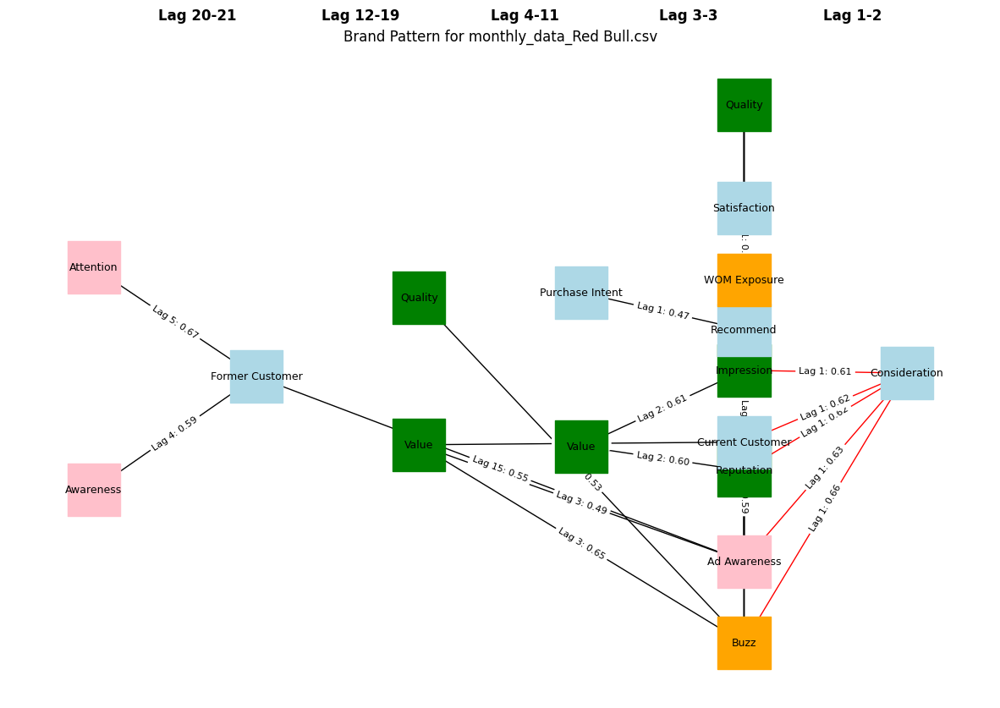

Generating network diagram for monthly_data_Power horse.csv...

Relationships table for monthly_data_Power horse.csv:
              Feature            Target  Lag with Target  Cumulative Lag  \
0    Former Customer     Consideration               15              15   
1          Awareness     Consideration               15              15   
2               Buzz     Consideration                1               1   
3            Quality     Consideration                1               1   
4   Current Customer     Consideration                2               2   
5         Impression   Former Customer                9              24   
6         Reputation   Former Customer                9              24   
7              Value   Former Customer                8              23   
8       WOM Exposure   Former Customer                7              22   
9       Ad Awareness   Former Customer               12              27   
10   Purchase Intent   Former Customer               11 

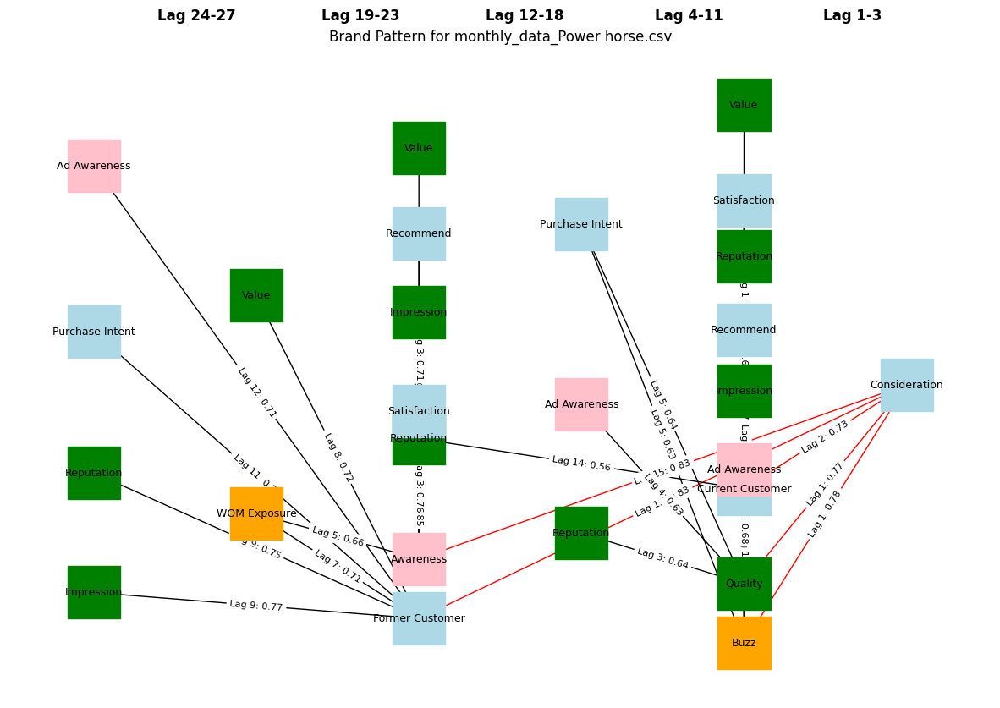

Generating network diagram for monthly_data_Sting.csv...

Relationships table for monthly_data_Sting.csv:
              Feature            Target  Lag with Target  Cumulative Lag  \
0   Current Customer     Consideration               10              10   
1         Reputation     Consideration               10              10   
2          Recommend     Consideration                7               7   
3          Awareness     Consideration                8               8   
4              Value     Consideration                7               7   
5       WOM Exposure  Current Customer                1              11   
6    Former Customer  Current Customer                1              11   
7          Attention  Current Customer                1              11   
8    Purchase Intent  Current Customer                1              11   
9       Satisfaction  Current Customer                1              11   
10      Ad Awareness  Current Customer                1             

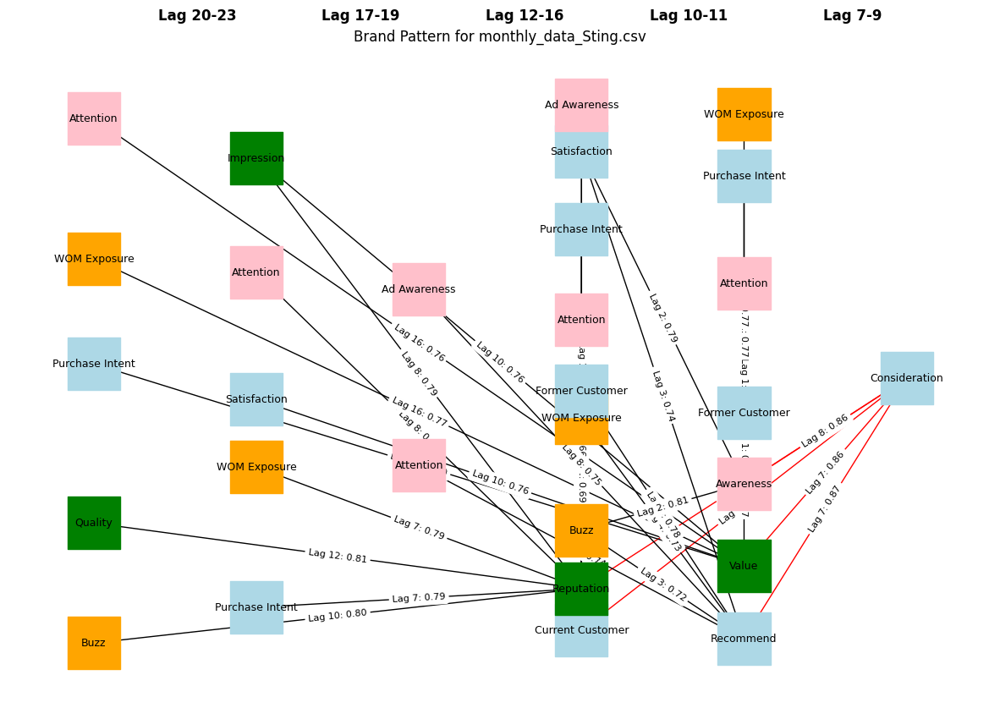

Generating network diagram for weekly_data_Red Bull.csv...

Relationships table for weekly_data_Red Bull.csv:
              Feature         Target  Lag with Target  Cumulative Lag  \
0               Buzz  Consideration                1               1   
1         Impression  Consideration                1               1   
2          Recommend  Consideration                1               1   
3         Reputation  Consideration                1               1   
4       Satisfaction  Consideration                1               1   
5            Quality           Buzz                1               2   
6       Ad Awareness           Buzz                1               2   
7   Current Customer           Buzz                1               2   
8       WOM Exposure           Buzz                1               2   
9              Value           Buzz                1               2   
10           Quality     Impression                1               2   
11  Current Customer     

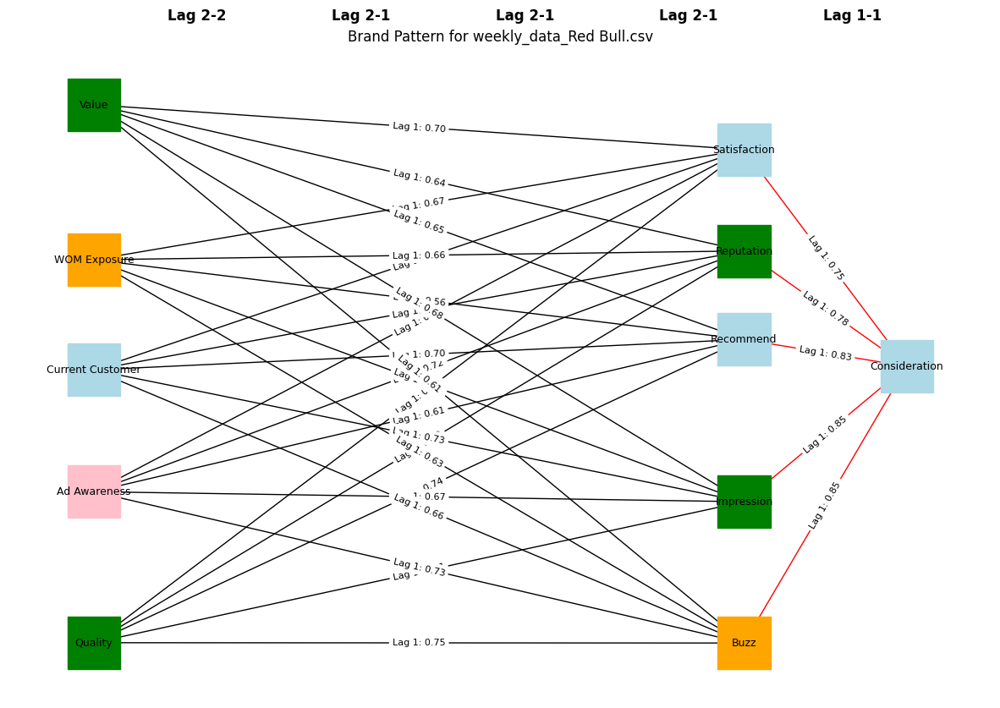

Generating network diagram for weekly_data_Power horse.csv...

Relationships table for weekly_data_Power horse.csv:
              Feature         Target  Lag with Target  Cumulative Lag  \
0            Quality  Consideration                1               1   
1               Buzz  Consideration                1               1   
2       Satisfaction  Consideration                1               1   
3         Impression  Consideration                1               1   
4              Value  Consideration                1               1   
5         Reputation        Quality                1               2   
6          Recommend        Quality                1               2   
7          Awareness        Quality                1               2   
8       Ad Awareness        Quality                1               2   
9   Current Customer        Quality                1               2   
10         Recommend           Buzz                1               2   
11        Reputatio

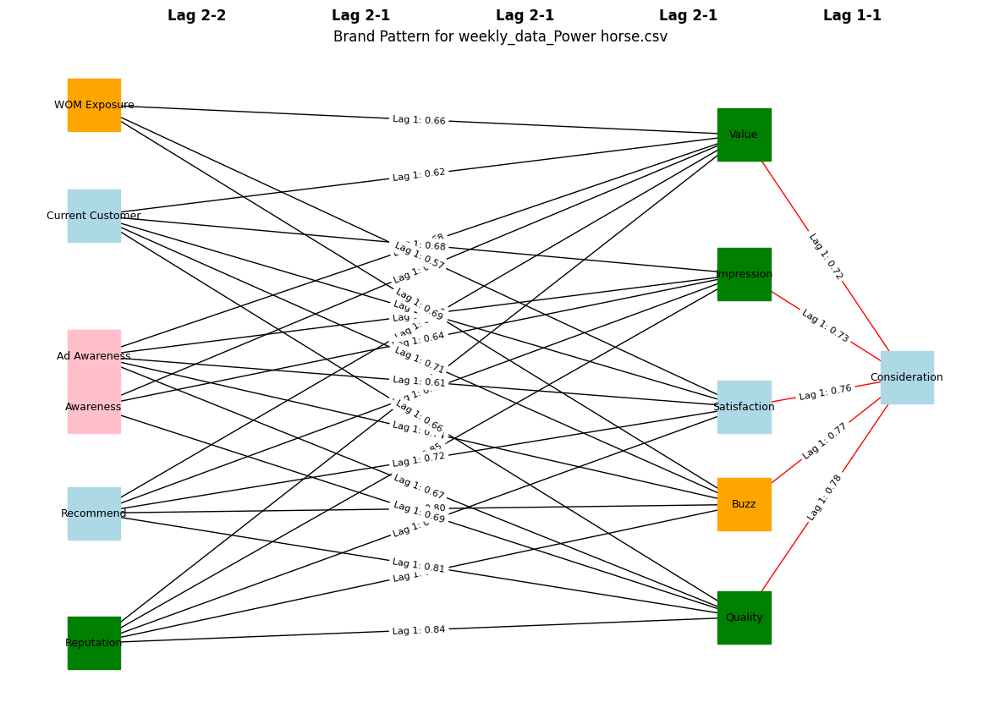

Generating network diagram for weekly_data_Sting.csv...

Relationships table for weekly_data_Sting.csv:
              Feature           Target  Lag with Target  Cumulative Lag  \
0              Value    Consideration                1               1   
1          Awareness    Consideration               18              18   
2         Impression    Consideration                1               1   
3          Attention    Consideration               19              19   
4            Quality    Consideration                1               1   
5          Recommend            Value                1               2   
6       Satisfaction            Value                1               2   
7               Buzz            Value                1               2   
8         Reputation            Value                1               2   
9       WOM Exposure            Value               17              18   
10   Former Customer        Awareness                1              19   
11     

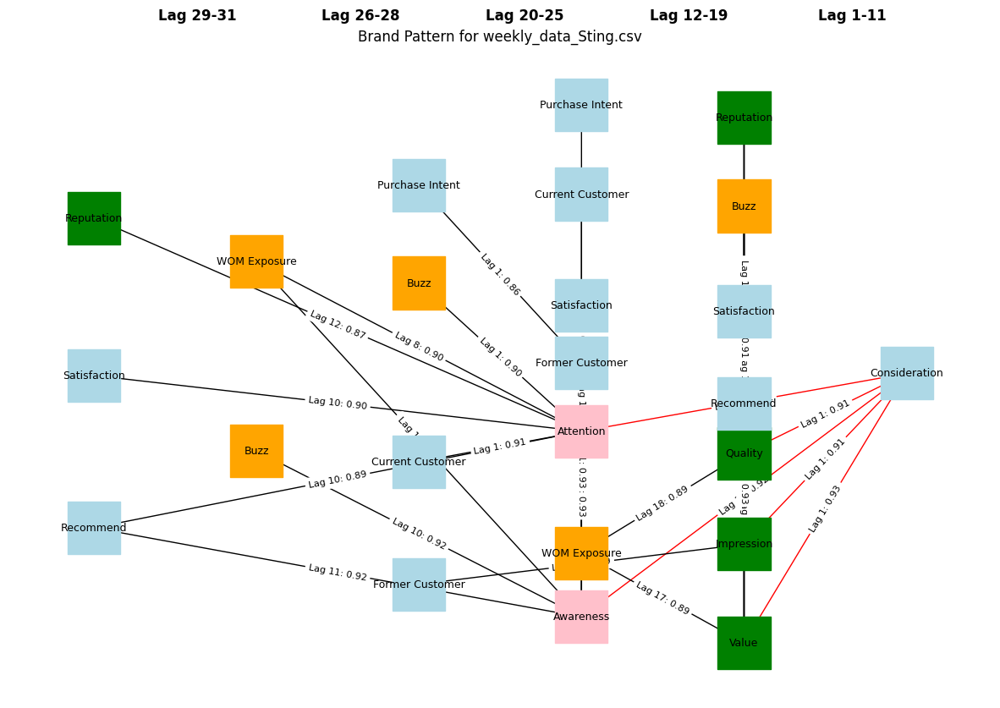

In [ ]:
# Parameters to adjust globally
correlation_threshold = Weekly_Cor_Threshold
max_indirect_features = 6
w_corr = 0.6
w_cent = 0.5
dep_var = Weekly_Dep_Var # Set your dependent variable here
max_lag_limit = Weekly_Max_Lag                 # Limit the maximum lag segment to 20

relationships_dfs = []
# Loop through each entry in monthly_correlation_results_dfs
for correlation_results_df, file_name in monthly_correlation_results_dfs:
    # Call the build_network_diagram function for each file
    print(f"Generating network diagram for {file_name}...")
    # Assign the return value to a single variable
    result = build_network_diagram(
        correlation_dfs=[(correlation_results_df, 'Monthly')],
        dependent_var= Monthly_Dep_Var,
        correlation_threshold=Monthly_Cor_Threshold,
        max_indirect_features=max_indirect_features,
        w_corr=w_corr,
        w_cent=w_cent,
        top_x_features = 5,
        max_lag_limit=Monthly_Max_Lag,
        file_name=file_name
    )

    # Check if the function returned a valid result before unpacking
    if result is not None:
        relationships, filename = result
        relationships_dfs.append((relationships, filename))
    else:
        print(f"Skipping network diagram generation for {file_name} due to insufficient correlations.")


# Loop through each entry in weekly_correlation_results_dfs
for correlation_results_df, file_name in weekly_correlation_results_dfs:
    # Call the build_network_diagram function for each file
    print(f"Generating network diagram for {file_name}...")
    # Assign the return value to a single variable
    result = build_network_diagram(
        correlation_dfs=[(correlation_results_df, 'Weekly')],
        dependent_var= dep_var,
        correlation_threshold=correlation_threshold,
        max_indirect_features=max_indirect_features,
        w_corr=w_corr,
        w_cent=w_cent,
        top_x_features = 5,
        max_lag_limit=max_lag_limit,
        file_name=file_name
    )
    # No need to unpack in this loop as you are not using the returned values

# Venn Diagram Module 1
This is used for testing the creation of a Venn Diagram using a true Venn construct. Not to be used.

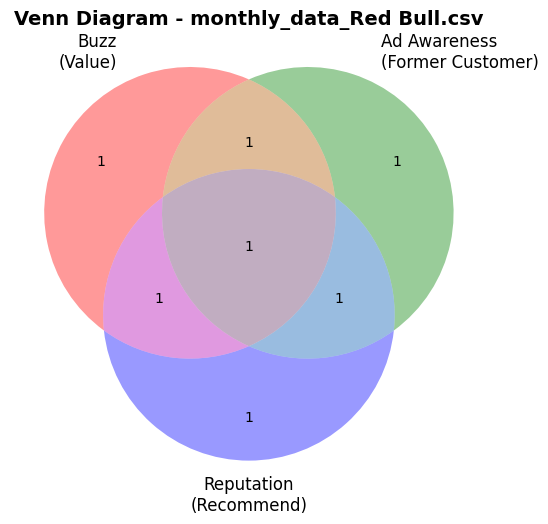

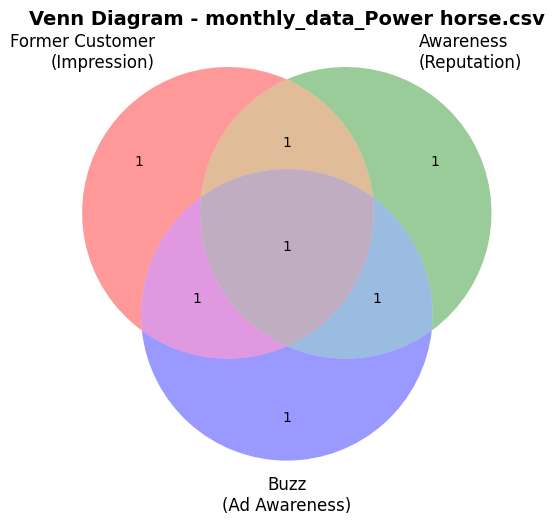

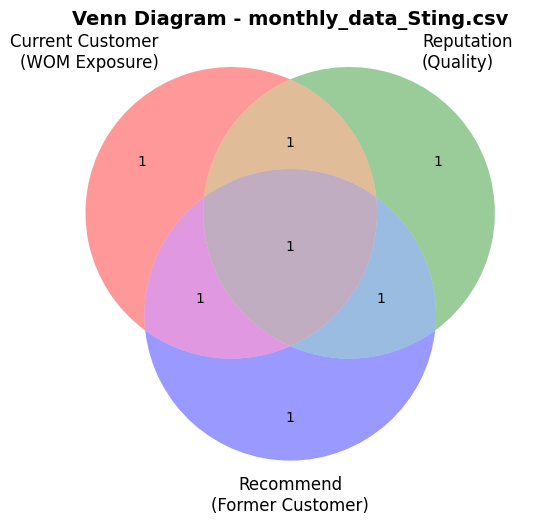

In [ ]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn3

def plot_venn_diagrams(relationships_dfs):
    """
    Generates Venn diagrams for each 'relationships' dataframe in 'relationships_dfs'.
    Each Venn diagram displays three top features from 'Level' == 'first' and their corresponding
    highest correlation feature from 'Level' == 'second'.
    """

    for relationships, filename in relationships_dfs:
        # Step 1: Get the top 3 features based on highest correlation (Level = first)
        top_features_first = relationships[relationships['Level'] == 'first'].nlargest(3, 'Correlation')[['Feature', 'Correlation']]

        # Step 2: Find the corresponding second-level features
        top_features_second = []
        for feature in top_features_first['Feature']:
            second_feature = relationships[
                (relationships['Level'] == 'second') & (relationships['Target'] == feature)
            ].nlargest(1, 'Correlation')

            if not second_feature.empty:
                second_feature_name = second_feature.iloc[0]['Feature']
            else:
                second_feature_name = "N/A"  # If no second-level feature is found

            top_features_second.append(second_feature_name)

        # Step 3: Prepare labels for the Venn diagram
        labels = [
            f"{top_features_first.iloc[0]['Feature']}\n({top_features_second[0]})",
            f"{top_features_first.iloc[1]['Feature']}\n({top_features_second[1]})",
            f"{top_features_first.iloc[2]['Feature']}\n({top_features_second[2]})"
        ]

        # Step 4: Plot the Venn diagram
        plt.figure(figsize=(8, 6))
        venn3(subsets=(1, 1, 1, 1, 1, 1, 1), set_labels=labels)

        # Step 5: Title the plot with the filename
        plt.title(f"Venn Diagram - {filename}", fontsize=14, fontweight='bold')

        # Display the plot
        plt.show()


plot_venn_diagrams(relationships_dfs)


# Venn Diagram Module 2
This is used to be a true representation of Dan Chapman's PowerPoint deliverable, showing the relationship between the 3 highest correlating variables and thweir next closest correlating variable.

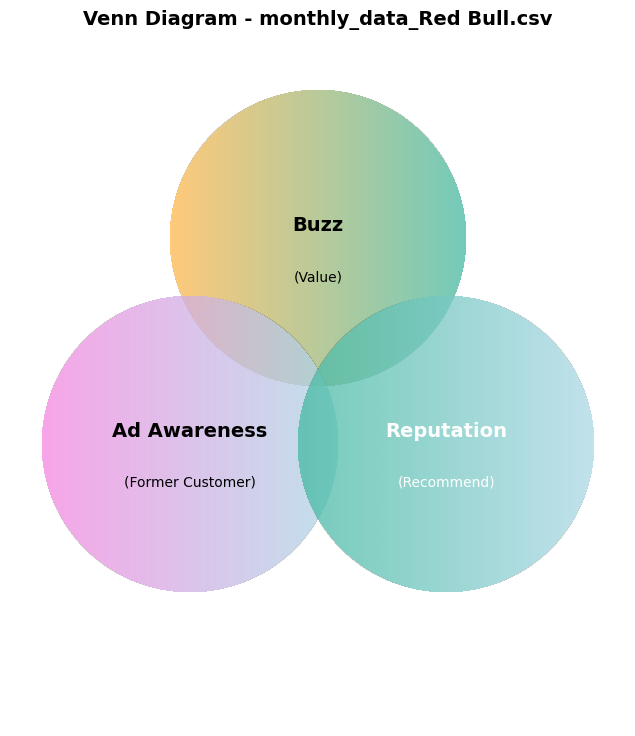

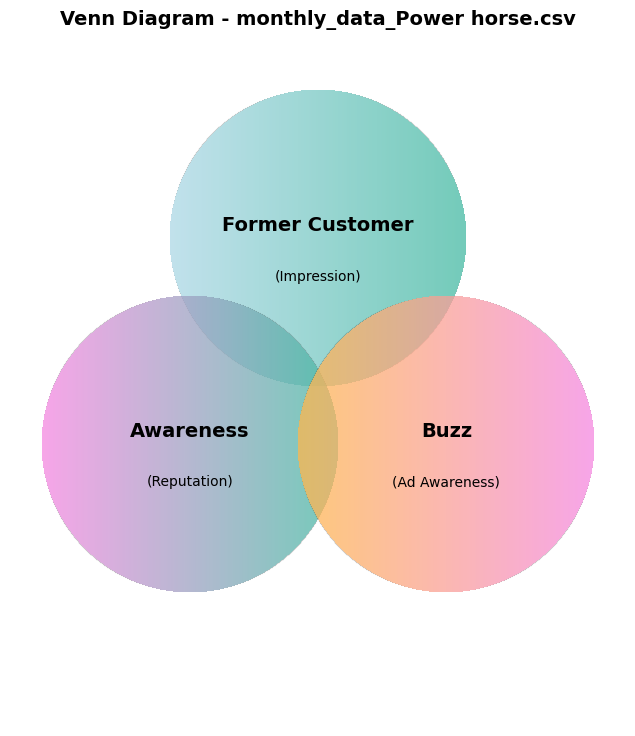

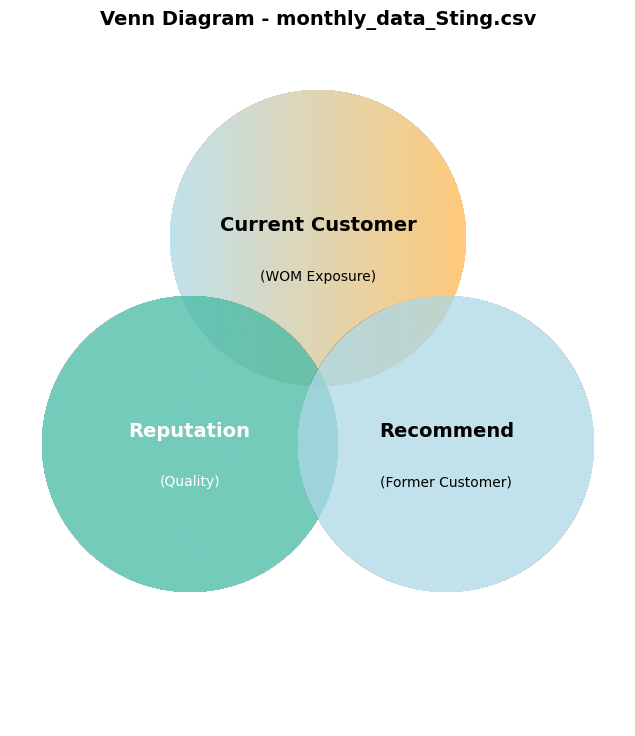

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Circle
from matplotlib.colors import LinearSegmentedColormap, to_rgba
import matplotlib

# Function to get feature color
def get_feature_color(feature_name):
    visibility_features = ['Ad Awareness', 'Attention', 'Awareness']
    vibrancy_features = ['Buzz', 'WOM Exposure']
    variability_features = ['Impression', 'Quality', 'Reputation', 'Value']

    if feature_name in visibility_features:
        return '#F588E1'  # Pink
    elif feature_name in vibrancy_features:
        return '#FFB84E'  # Orange
    elif feature_name in variability_features:
        return '#45BAA3'  # Teal
    else:
        return '#ADD8E6'  # Light Blue (Default)

# Function to determine contrasting text color
def get_contrasting_text_color(bg_color):
    """Returns white or black depending on background color brightness."""
    r, g, b, _ = to_rgba(bg_color)  # Convert hex to RGB
    brightness = (r * 0.299 + g * 0.587 + b * 0.114)  # Standard luminance formula
    return 'black' if brightness > 0.6 else 'white'

# Function to create a gradient effect inside a circle
def create_circle_gradient(ax, center, radius, color1, color2=None, alpha=0.75):
    """Creates a diagonal gradient inside a circle with transparency."""
    resolution = 300
    x, y = np.meshgrid(
        np.linspace(center[0] - radius, center[0] + radius, resolution),
        np.linspace(center[1] - radius, center[1] + radius, resolution)
    )
    distance_from_center = np.sqrt((x - center[0])**2 + (y - center[1])**2)

    # Define gradient transition
    gradient = (x - x.min()) / (x.max() - x.min())  # Linear transition

    # Mask outside the circle
    gradient[distance_from_center > radius] = np.nan

    # Choose color mapping
    if color2 is None:  # If second color is missing, use only the first color
        color2 = color1
    cmap = LinearSegmentedColormap.from_list("diagonal_gradient", [color1, color2])

    # Apply gradient inside the circle
    ax.imshow(
        gradient,
        extent=[center[0] - radius, center[0] + radius, center[1] - radius, center[1] + radius],
        cmap=cmap, alpha=alpha, origin='lower', zorder=1
    )

# Function to plot the custom Venn-style diagram
def plot_custom_venn(relationships_dfs):
    """
    Generates a custom Venn-style diagram for each dataset, displaying the top three features from
    'Level' == 'first' and their corresponding most correlated feature from 'Level' == 'second'.
    """
    for relationships, filename in relationships_dfs:
        # Step 1: Get the top 3 features based on highest correlation (Level = first)
        top_features_first = relationships[relationships['Level'] == 'first'].nlargest(3, 'Correlation')[['Feature', 'Correlation']]

        # Step 2: Find the corresponding second-level features
        top_features_second = []
        for feature in top_features_first['Feature']:
            second_feature = relationships[
                (relationships['Level'] == 'second') & (relationships['Target'] == feature)
            ].nlargest(1, 'Correlation')

            if not second_feature.empty:
                second_feature_name = second_feature.iloc[0]['Feature']
            else:
                second_feature_name = None  # No second-level feature found

            top_features_second.append(second_feature_name)

        # Step 3: Get colors for each feature
        colors_first = [get_feature_color(f) for f in top_features_first['Feature']]
        colors_second = [get_feature_color(f) if f else colors_first[i] for i, f in enumerate(top_features_second)]

        # Step 4: Set up figure & adjust layout
        fig, ax = plt.subplots(figsize=(9, 9))  # **Increased figure size**
        ax.set_xlim(-1.2, 1.2)  # Expand frame to prevent cropping
        ax.set_ylim(-1.6, 1.1)  # Increased Y limit for **better fit**
        ax.set_aspect('equal')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)

        # Step 5: Define positions of the three circles (closer overlap)
        positions = [(0, 0.3), (-0.5, -0.5), (0.5, -0.5)]  # **Lowered top circle**
        radius = 0.58  # **Slightly reduced radius for better fit**
        alpha = 0.75  # Transparency for overlap visibility

        # Step 6: Draw Circles with Gradient Fill
        for i in range(3):
            create_circle_gradient(ax, positions[i], radius, colors_first[i], colors_second[i] if top_features_second[i] else None, alpha=alpha)

        # Step 7: Add Labels (Feature Names)
        for i in range(3):
            text_color = get_contrasting_text_color(colors_first[i])  # Ensure contrast

            # Level 1 Feature (Bold, inside the circle)
            ax.text(
                positions[i][0], positions[i][1] + 0.05,
                top_features_first.iloc[i]['Feature'],
                fontsize=14, fontweight='bold', ha='center', va='center', color=text_color, zorder=2
            )

            # Level 2 Feature (Smaller, below Level 1, or hidden if N/A)
            if top_features_second[i]:
                ax.text(
                    positions[i][0], positions[i][1] - 0.15,
                    f"({top_features_second[i]})",
                    fontsize=10, ha='center', va='center', color=text_color, zorder=2
                )

        # Step 8: Title the plot with the filename
        plt.title(f"Venn Diagram - {filename}", fontsize=14, fontweight='bold')

        # Display the plot
        plt.show()

plot_custom_venn(relationships_dfs)


# Venn Diagram Module 3

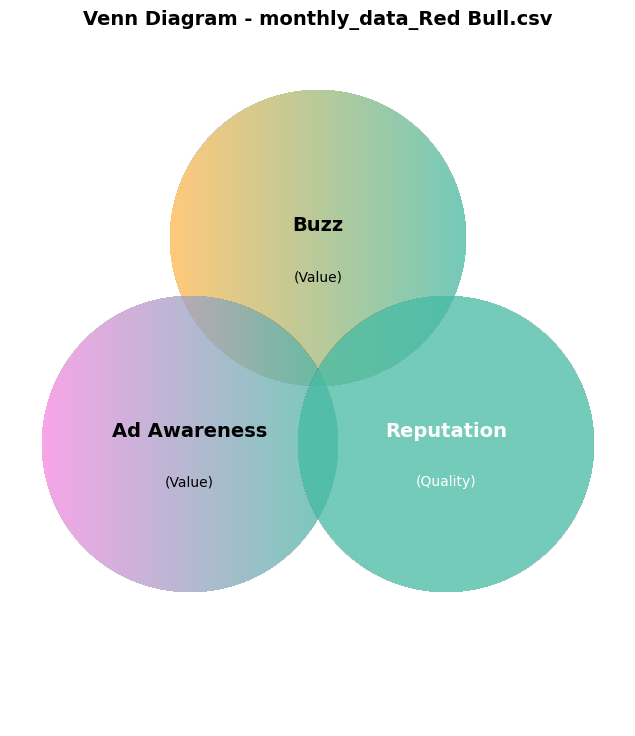

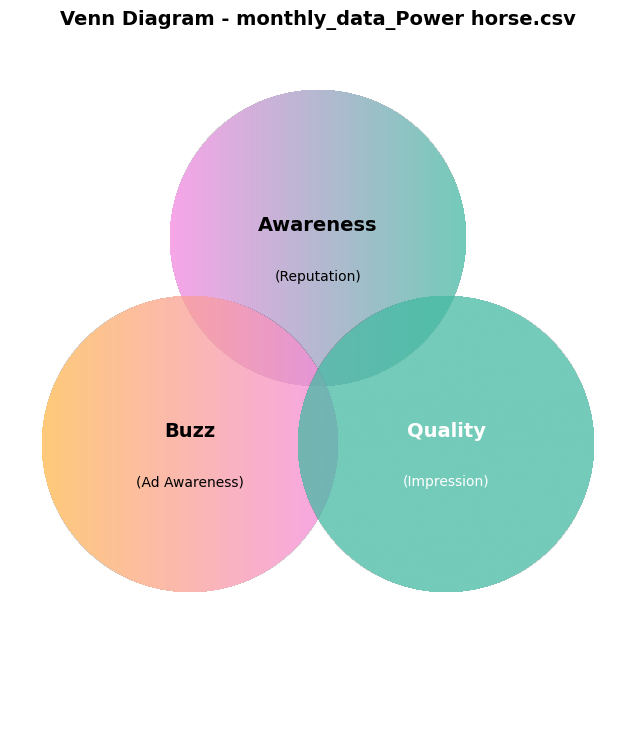

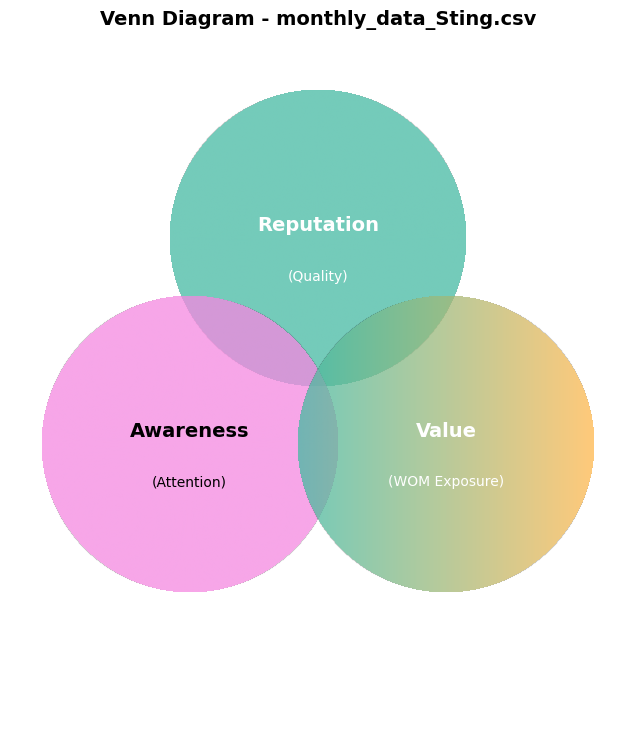

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Circle
from matplotlib.colors import LinearSegmentedColormap, to_rgba
import matplotlib

# Feature Category Mapping
visibility_features = ['Ad Awareness', 'Attention', 'Awareness']
vibrancy_features = ['Buzz', 'WOM Exposure']
variability_features = ['Impression', 'Quality', 'Reputation', 'Value']

# Function to get feature color
def get_feature_color(feature_name):
    if feature_name in visibility_features:
        return '#F588E1'  # Pink
    elif feature_name in vibrancy_features:
        return '#FFB84E'  # Orange
    elif feature_name in variability_features:
        return '#45BAA3'  # Teal
    else:
        return None  # Exclude non-matching features

# Function to determine contrasting text color
def get_contrasting_text_color(bg_color):
    r, g, b, _ = to_rgba(bg_color)
    brightness = (r * 0.299 + g * 0.587 + b * 0.114)
    return 'black' if brightness > 0.6 else 'white'

# Function to create a gradient effect inside a circle
def create_circle_gradient(ax, center, radius, color1, color2=None, alpha=0.75):
    resolution = 300
    x, y = np.meshgrid(
        np.linspace(center[0] - radius, center[0] + radius, resolution),
        np.linspace(center[1] - radius, center[1] + radius, resolution)
    )
    distance_from_center = np.sqrt((x - center[0])**2 + (y - center[1])**2)
    gradient = (x - x.min()) / (x.max() - x.min())

    gradient[distance_from_center > radius] = np.nan
    if color2 is None:
        color2 = color1
    cmap = LinearSegmentedColormap.from_list("diagonal_gradient", [color1, color2])

    ax.imshow(
        gradient,
        extent=[center[0] - radius, center[0] + radius, center[1] - radius, center[1] + radius],
        cmap=cmap, alpha=alpha, origin='lower', zorder=1
    )

# Function to plot the custom Venn-style diagram
def plot_custom_venn_filtered(relationships_dfs):
    for relationships, filename in relationships_dfs:
        # Step 1: Get top 3 'first' level features **ONLY FROM Visibility, Vibrancy, or Variability**
        top_features_first = relationships[
            (relationships['Level'] == 'first') &
            (relationships['Feature'].isin(visibility_features + vibrancy_features + variability_features))
        ].nlargest(3, 'Correlation')[['Feature', 'Correlation']]

        if len(top_features_first) == 0:
            print(f"Skipping {filename} - No matching features found.")
            continue  # Skip this dataset

        # Step 2: Find the corresponding second-level features
        top_features_second = []
        for feature in top_features_first['Feature']:
            second_feature = relationships[
                (relationships['Level'] == 'second') & (relationships['Target'] == feature) &
                (relationships['Feature'].isin(visibility_features + vibrancy_features + variability_features))
            ].nlargest(1, 'Correlation')

            if not second_feature.empty:
                second_feature_name = second_feature.iloc[0]['Feature']
            else:
                second_feature_name = None

            top_features_second.append(second_feature_name)

        # Step 3: Get colors for each feature
        colors_first = [get_feature_color(f) for f in top_features_first['Feature']]
        colors_second = [get_feature_color(f) if f else colors_first[i] for i, f in enumerate(top_features_second)]

        # Step 4: Set up figure & adjust layout
        fig, ax = plt.subplots(figsize=(9, 9))
        ax.set_xlim(-1.2, 1.2)
        ax.set_ylim(-1.6, 1.1)
        ax.set_aspect('equal')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)

        # **Handle cases with 3, 2, or 1 circle**
        if len(top_features_first) == 3:
            positions = [(0, 0.3), (-0.5, -0.5), (0.5, -0.5)]
        elif len(top_features_first) == 2:
            positions = [(-0.4, 0), (0.4, 0)]
        else:  # Only 1 feature
            positions = [(0, 0)]

        radius = 0.58
        alpha = 0.75

        # Step 5: Draw Circles with Gradient Fill
        for i in range(len(top_features_first)):
            create_circle_gradient(ax, positions[i], radius, colors_first[i], colors_second[i] if top_features_second[i] else None, alpha=alpha)

        # Step 6: Add Labels
        for i in range(len(top_features_first)):
            text_color = get_contrasting_text_color(colors_first[i])

            ax.text(
                positions[i][0], positions[i][1] + 0.05,
                top_features_first.iloc[i]['Feature'],
                fontsize=14, fontweight='bold', ha='center', va='center', color=text_color, zorder=2
            )

            if top_features_second[i]:
                ax.text(
                    positions[i][0], positions[i][1] - 0.15,
                    f"({top_features_second[i]})",
                    fontsize=10, ha='center', va='center', color=text_color, zorder=2
                )

        # Step 7: Title the plot with the filename
        plt.title(f"Venn Diagram - {filename}", fontsize=14, fontweight='bold')

        # Display the plot
        plt.show()

plot_custom_venn_filtered(relationships_dfs)


# Venn Diagram Module 4
This is an evolution of the original Dan Chapman visualisation that incorporates the correlation value, and separates the second correlating variable into a new circle.

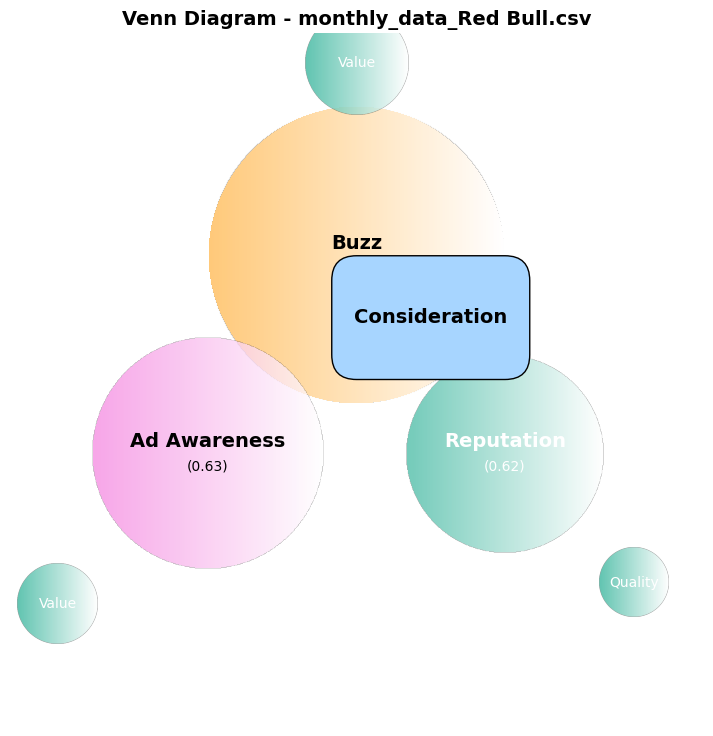

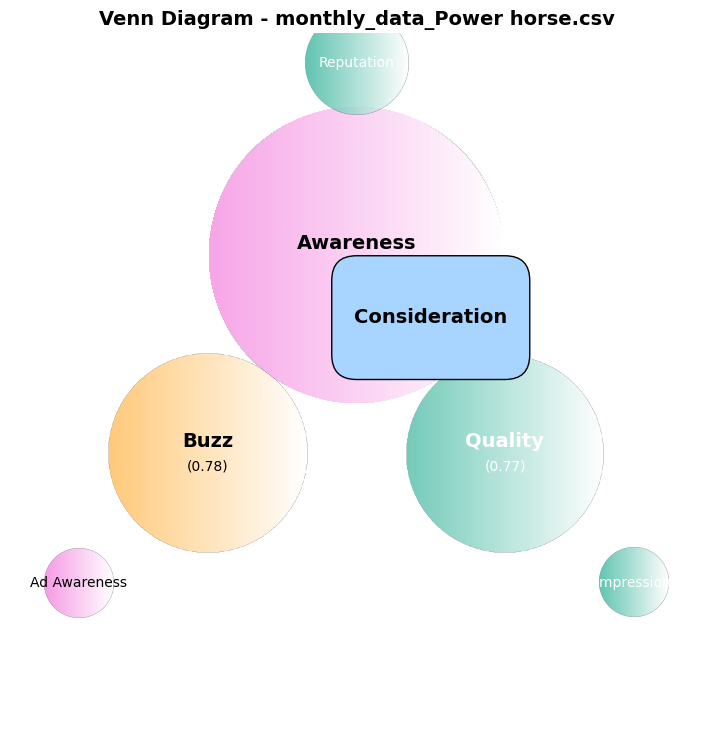

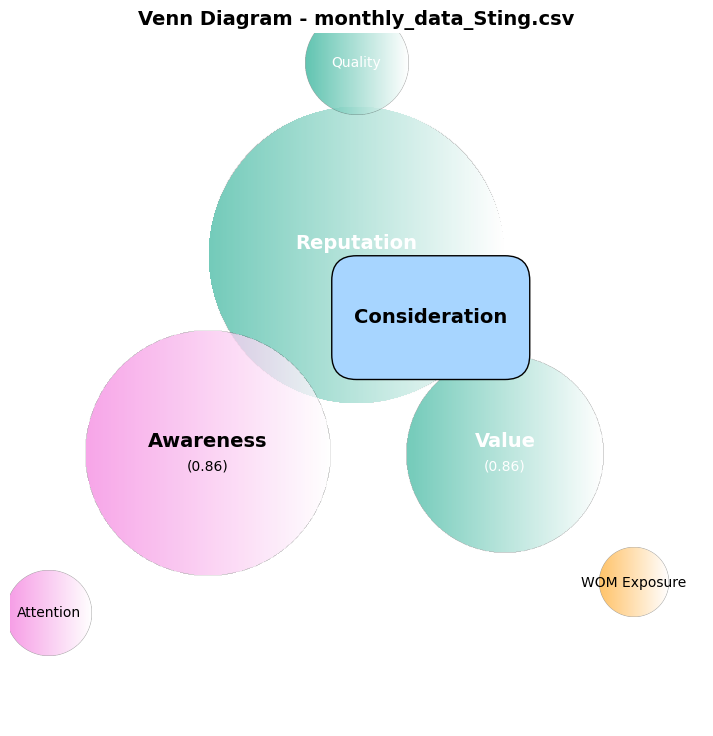

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.patches import Circle, FancyBboxPatch
from matplotlib.colors import LinearSegmentedColormap, to_rgba

# Feature Category Mapping
visibility_features = ['Ad Awareness', 'Attention', 'Awareness']
vibrancy_features = ['Buzz', 'WOM Exposure']
variability_features = ['Impression', 'Quality', 'Reputation', 'Value']

# Function to get feature color
def get_feature_color(feature_name):
    if feature_name in visibility_features:
        return '#F588E1'  # Pink
    elif feature_name in vibrancy_features:
        return '#FFB84E'  # Orange
    elif feature_name in variability_features:
        return '#45BAA3'  # Teal
    else:
        return None  # Exclude non-matching features

# Function to determine contrasting text color
def get_contrasting_text_color(bg_color):
    r, g, b, _ = to_rgba(bg_color)
    brightness = (r * 0.299 + g * 0.587 + b * 0.114)
    return 'black' if brightness > 0.6 else 'white'

# Function to create a gradient effect inside a circle
def create_circle_gradient(ax, center, radius, color, alpha=0.75):
    resolution = 300
    x, y = np.meshgrid(
        np.linspace(center[0] - radius, center[0] + radius, resolution),
        np.linspace(center[1] - radius, center[1] + radius, resolution)
    )
    distance_from_center = np.sqrt((x - center[0])**2 + (y - center[1])**2)
    gradient = (x - x.min()) / (x.max() - x.min())

    gradient[distance_from_center > radius] = np.nan
    cmap = LinearSegmentedColormap.from_list("gradient", [color, 'white'])

    ax.imshow(
        gradient,
        extent=[center[0] - radius, center[0] + radius, center[1] - radius, center[1] + radius],
        cmap=cmap, alpha=alpha, origin='lower', zorder=1
    )

# Function to plot the updated diagram
def plot_custom_nested_venn_v6(relationships_dfs):
    for relationships, filename in relationships_dfs:
        # Step 1: Get top 3 'first' level features **ONLY FROM Visibility, Vibrancy, or Variability**
        top_features_first = relationships[
            (relationships['Level'] == 'first') &
            (relationships['Feature'].isin(visibility_features + vibrancy_features + variability_features))
        ].nlargest(3, 'Correlation')[['Feature', 'Correlation', 'Target']]

        if len(top_features_first) == 0:
            print(f"Skipping {filename} - No matching features found.")
            continue  # Skip this dataset

        dependent_variable = top_features_first.iloc[0]['Target']  # The common target for level-1 features

        # Step 2: Find the corresponding second-level features
        top_features_second = []
        second_corr_values = []
        for feature in top_features_first['Feature']:
            second_feature = relationships[
                (relationships['Level'] == 'second') & (relationships['Target'] == feature) &
                (relationships['Feature'].isin(visibility_features + vibrancy_features + variability_features))
            ].nlargest(1, 'Correlation')

            if not second_feature.empty:
                second_feature_name = second_feature.iloc[0]['Feature']
                second_corr = second_feature.iloc[0]['Correlation']
            else:
                second_feature_name = None
                second_corr = None

            top_features_second.append(second_feature_name)
            second_corr_values.append(second_corr)

        # Step 3: Get colors for each feature
        colors_first = [get_feature_color(f) for f in top_features_first['Feature']]
        colors_second = [get_feature_color(f) if f else colors_first[i] for i, f in enumerate(top_features_second)]

        # Step 4: Set up figure & adjust layout
        fig, ax = plt.subplots(figsize=(9, 9))
        ax.set_xlim(-1.4, 1.4)
        ax.set_ylim(-1.6, 1.2)
        ax.set_aspect('equal')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)

        # Define positions (triangle layout)
        positions = [(0, 0.3), (-0.6, -0.5), (0.6, -0.5)]
        center_position = (0, -0.1)  # Center for the dependent variable

        # Step 5: Normalize circle sizes based on correlation (Max radius = 0.6, Min radius = 0.4)
        max_corr = top_features_first['Correlation'].max()
        min_corr = top_features_first['Correlation'].min()
        radius_first = [0.4 + 0.2 * ((c - min_corr) / (max_corr - min_corr)) if max_corr != min_corr else 0.5
                        for c in top_features_first['Correlation']]

        # Step 6: Draw Level-1 Circles
        for i in range(len(top_features_first)):
            create_circle_gradient(ax, positions[i], radius_first[i], colors_first[i], alpha=0.75)

            # Add Level-1 Feature Label & Correlation Value
            text_color = get_contrasting_text_color(colors_first[i])
            ax.text(positions[i][0], positions[i][1] + 0.05, top_features_first.iloc[i]['Feature'],
                    fontsize=14, fontweight='bold', ha='center', va='center', color=text_color, zorder=2)
            ax.text(positions[i][0], positions[i][1] - 0.05, f"({top_features_first.iloc[i]['Correlation']:.2f})",
                    fontsize=10, ha='center', va='center', color=text_color, zorder=2)

        # Step 7: Draw Level-2 Circles at the **True Outer Edge**
        offsets = [(0, radius_first[0] * 1.3),  # Top → Above
                   (-radius_first[1] * 1.3, -radius_first[1] * 1.3),  # Left → Bottom-Left
                   (radius_first[2] * 1.3, -radius_first[2] * 1.3)]  # Right → Bottom-Right

        for i in range(len(top_features_second)):
            if top_features_second[i]:
                center_second = (positions[i][0] + offsets[i][0], positions[i][1] + offsets[i][1])
                radius_second = radius_first[i] * 0.35

                create_circle_gradient(ax, center_second, radius_second, colors_second[i], alpha=0.85)

                text_color_second = get_contrasting_text_color(colors_second[i])
                ax.text(center_second[0], center_second[1], f"{top_features_second[i]}",
                        fontsize=10, ha='center', va='center', color=text_color_second, zorder=3)

        # Step 8: **Fix Dependent Variable Box Color**
        dep_box = FancyBboxPatch(center_position, 0.6, 0.3,
            boxstyle="round,pad=0.1", edgecolor="black", facecolor="#A7D5FF", alpha=1, zorder=3)
        ax.add_patch(dep_box)
        ax.text(center_position[0] + 0.3, center_position[1] + 0.15, dependent_variable,
                fontsize=14, fontweight='bold', ha='center', va='center', color='black', zorder=4)

        plt.title(f"Venn Diagram - {filename}", fontsize=14, fontweight='bold')
        plt.show()



plot_custom_nested_venn_v6(relationships_dfs)


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def find_top_correlated_variables_no_lag(df, dependent_variable, top_n=5):
    """
    Calculates the cross-correlation of all features (no lags) and identifies the top correlated features for each variable.
    """

    # Columns to drop before calculating correlation
    columns_to_drop = ['Date', 'Volume', 'index']

    # Drop specified columns if present
    df_for_corr = df.drop(columns=[col for col in columns_to_drop if col in df.columns])

    # Calculate the correlation matrix
    correlation_matrix = df_for_corr.corr()

    # Create a DataFrame to store results
    results = []

    for variable in df.columns:
        if variable in columns_to_drop:  # Skip processing for specified columns
            continue

        # Get correlations with the dependent variable
        if variable in correlation_matrix.columns:  # Check if variable is present after dropping columns
            correlations = correlation_matrix[variable].drop(variable)  # Exclude self-correlation

            # Filter for positive correlations only
            positive_correlations = correlations[correlations > 0]

            # Sort by correlation value and get top N
            top_correlations = positive_correlations.nlargest(top_n)

            for feature, correlation in top_correlations.items():
                results.append({
                    'Variable': variable,
                    'Top Correlated Variable': feature,
                    'Correlation': correlation_matrix.loc[variable, feature],  # Use original correlation value
                    'Best Lag': 0  # Lag is always 0 in this function
                })

    results_df = pd.DataFrame(results)

    # Print the correlation matrix heatmap
    plt.figure(figsize=(12, 10))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title('Correlation Matrix Heatmap')
    plt.show()

    return results_df

In [ ]:
def build_network_diagram_no_lag(correlation_df, dependent_var, correlation_threshold, max_indirect_features, top_x_features, file_name):
    import networkx as nx
    import matplotlib.pyplot as plt
    import numpy as np

    # Initialize directed graph and relationship storage
    G = nx.DiGraph()
    relationships = []
    edge_colors = {}

    # Add dependent variable node
    G.add_node(dependent_var, color=get_color(dependent_var))

    # Filter correlations above the threshold
    filtered_df = correlation_df[correlation_df['Correlation'].abs() >= correlation_threshold]

    # First-level relationships (dependent -> top features)
    top_features = filtered_df[filtered_df['Variable'] == dependent_var].nlargest(top_x_features, 'Correlation')
    for _, row in top_features.iterrows():
        feature, corr = row['Top Correlated Variable'], row['Correlation']
        relationships.append((feature, dependent_var, corr, 'first'))

    # Second-level relationships
    first_level_features = {r[0] for r in relationships if r[3] == 'first'}
    for _, top_row in top_features.iterrows():
        top_feature = top_row['Top Correlated Variable']
        indirect_features = filtered_df[
            (filtered_df['Variable'] == top_feature) &
            (~filtered_df['Top Correlated Variable'].isin(first_level_features)) &
            (filtered_df['Top Correlated Variable'] != dependent_var)
        ].nlargest(max_indirect_features, 'Correlation')

        for _, indirect_row in indirect_features.iterrows():
            indirect_feature, indirect_corr = indirect_row['Top Correlated Variable'], indirect_row['Correlation']
            relationships.append((indirect_feature, top_feature, indirect_corr, 'second'))

    # Third-level relationships (similar to second level)
    second_level_features = {r[0] for r in relationships if r[3] == 'second'}
    for sec_feature in second_level_features:
        third_level_features = filtered_df[
            (filtered_df['Variable'] == sec_feature) &
            (~filtered_df['Top Correlated Variable'].isin(first_level_features | second_level_features)) &
            (filtered_df['Top Correlated Variable'] != dependent_var)
        ].nlargest(max_indirect_features, 'Correlation')

        for _, third_row in third_level_features.iterrows():
            third_feature, third_corr = third_row['Top Correlated Variable'], third_row['Correlation']
            relationships.append((third_feature, sec_feature, third_corr, 'third'))

    # Add nodes and edges to the graph
    for feature, target, corr, level in relationships:
        if feature not in G.nodes:
            G.add_node(feature, color=get_color(feature))
        edge_colors[(feature, target)] = 'red' if level == 'first' else 'black'
        G.add_edge(feature, target, weight=corr, label=f"{corr:.2f}")

    # Define a custom right-to-left hierarchical layout
    def hierarchy_pos_rtl_balanced(G, root=None, x_spacing=2.0, y_spacing=1.0):
        if root is None:
            root = list(nx.topological_sort(G))[-1]

        # Helper function to assign positions
        def assign_positions(level_nodes, level, pos, x, parent_y_range):
            n = len(level_nodes)
            if n == 0:
                return

            # Calculate vertical positions evenly distributed
            y_start, y_end = parent_y_range
            y_positions = np.linspace(y_start, y_end, n)

            for i, (node, y) in enumerate(zip(level_nodes, y_positions)):
                pos[node] = (x, y)

        pos = {}
        current_level = [root]
        current_y_range = (-5, 5)  # Symmetric vertical range for the root
        assign_positions([root], 0, pos, x=0, parent_y_range=current_y_range)

        depth = 1
        while current_level:
            next_level = []
            y_ranges = {}

            # Collect children and assign vertical ranges for next level
            for node in current_level:
                children = list(G.predecessors(node))
                if children:
                    next_level.extend(children)
                    range_start = pos[node][1] - (y_spacing * len(children) / 2)
                    range_end = pos[node][1] + (y_spacing * len(children) / 2)
                    y_ranges[node] = (range_start, range_end)

            # Ensure all parent nodes have ranges before processing children
            for parent in current_level:
                if parent not in y_ranges:
                    y_ranges[parent] = (-5, 5)  # Default range if missing

            # Group children by parent and assign positions
            next_level = list(set(next_level))
            grouped_children = {node: [] for node in current_level}
            for child in next_level:
                for parent in G.successors(child):
                    grouped_children[parent].append(child)

            for parent, children in grouped_children.items():
                parent_range = y_ranges[parent]
                assign_positions(children, depth, pos, x=-depth * x_spacing, parent_y_range=parent_range)

            current_level = next_level
            depth += 1

        return pos

    # Generate layout
    pos = hierarchy_pos_rtl_balanced(G, root=dependent_var, x_spacing=2.0, y_spacing=1.0)

    # Visualize the network
    fig, ax = plt.subplots(figsize=(15, 10))
    nx.draw_networkx_nodes(G, pos, node_color=[G.nodes[node].get('color', 'gray') for node in G], node_shape="s", node_size=2000, ax=ax)
    nx.draw_networkx_labels(G, pos, font_size=9, ax=ax)
    nx.draw_networkx_edges(G, pos, edge_color=[edge_colors[edge] for edge in G.edges], arrows=True, ax=ax)
    edge_labels = nx.get_edge_attributes(G, 'label')
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=8, ax=ax)
    plt.title(f"Network Diagram for {file_name}")
    plt.axis('off')
    plt.show()


Processing weekly data for weekly_data_Red Bull.csv


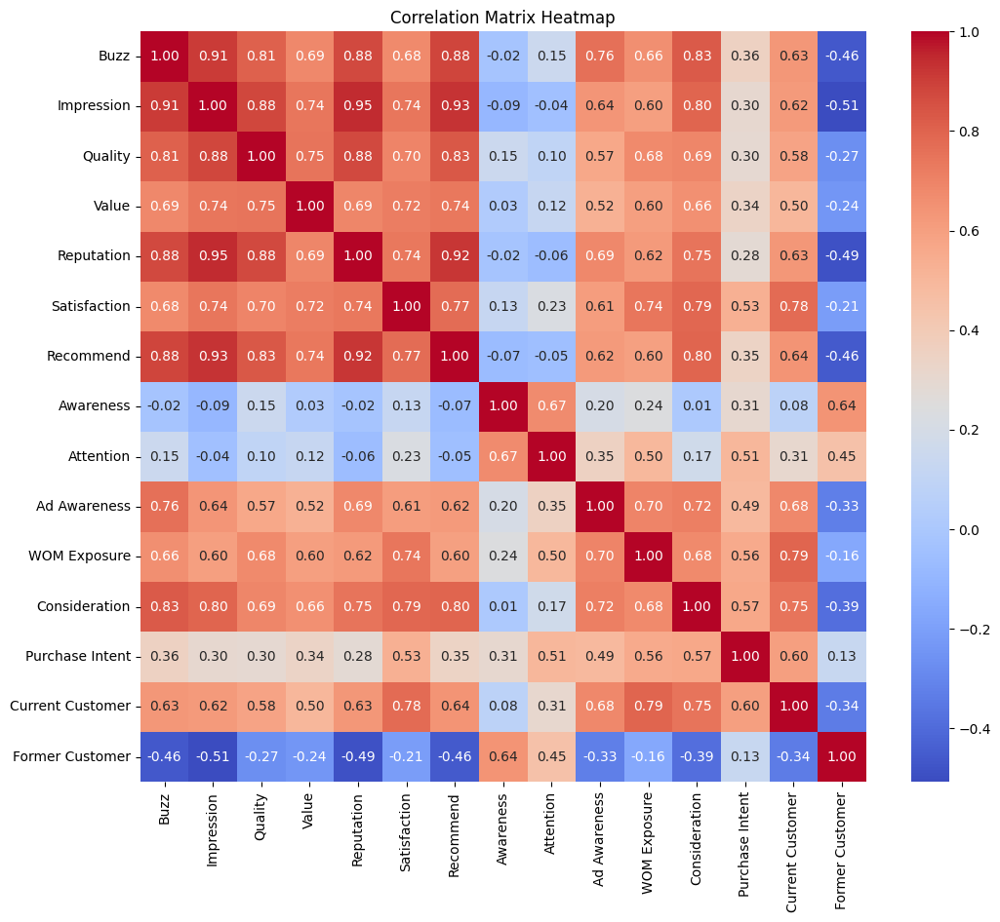

Top correlated variables for weekly_data_Red Bull.csv:
            Variable Top Correlated Variable  Correlation  Best Lag
0               Buzz              Impression     0.910783         0
1               Buzz               Recommend     0.884796         0
2               Buzz              Reputation     0.875804         0
3               Buzz           Consideration     0.826549         0
4               Buzz                 Quality     0.807549         0
..               ...                     ...          ...       ...
68  Current Customer            Ad Awareness     0.682276         0
69  Current Customer               Recommend     0.641356         0
70   Former Customer               Awareness     0.644144         0
71   Former Customer               Attention     0.447241         0
72   Former Customer         Purchase Intent     0.131156         0

[73 rows x 4 columns]


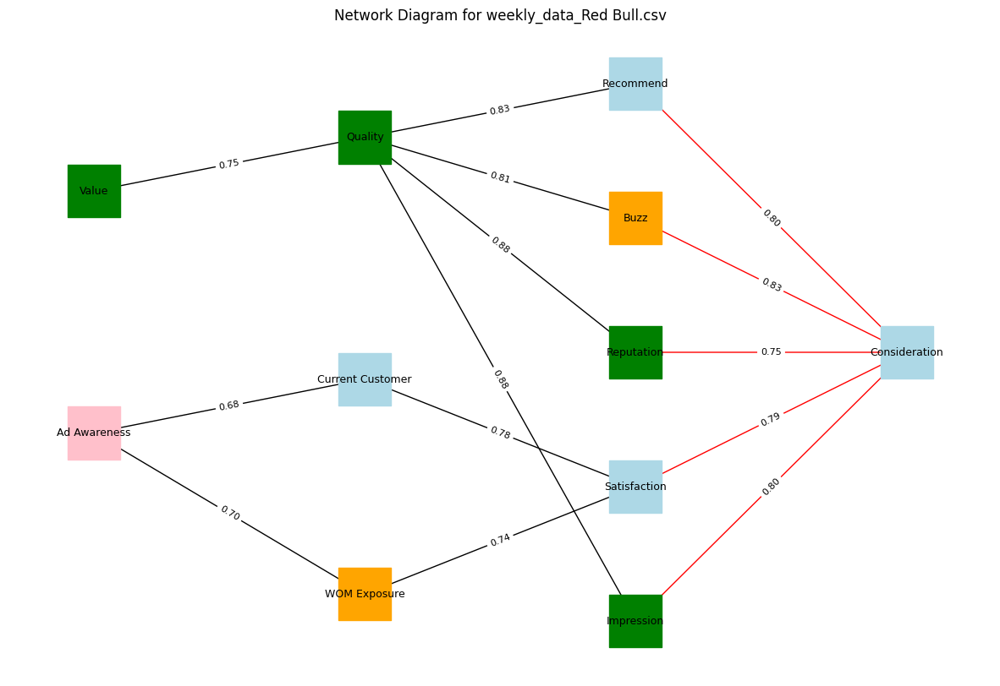

Processing weekly data for weekly_data_Power horse.csv


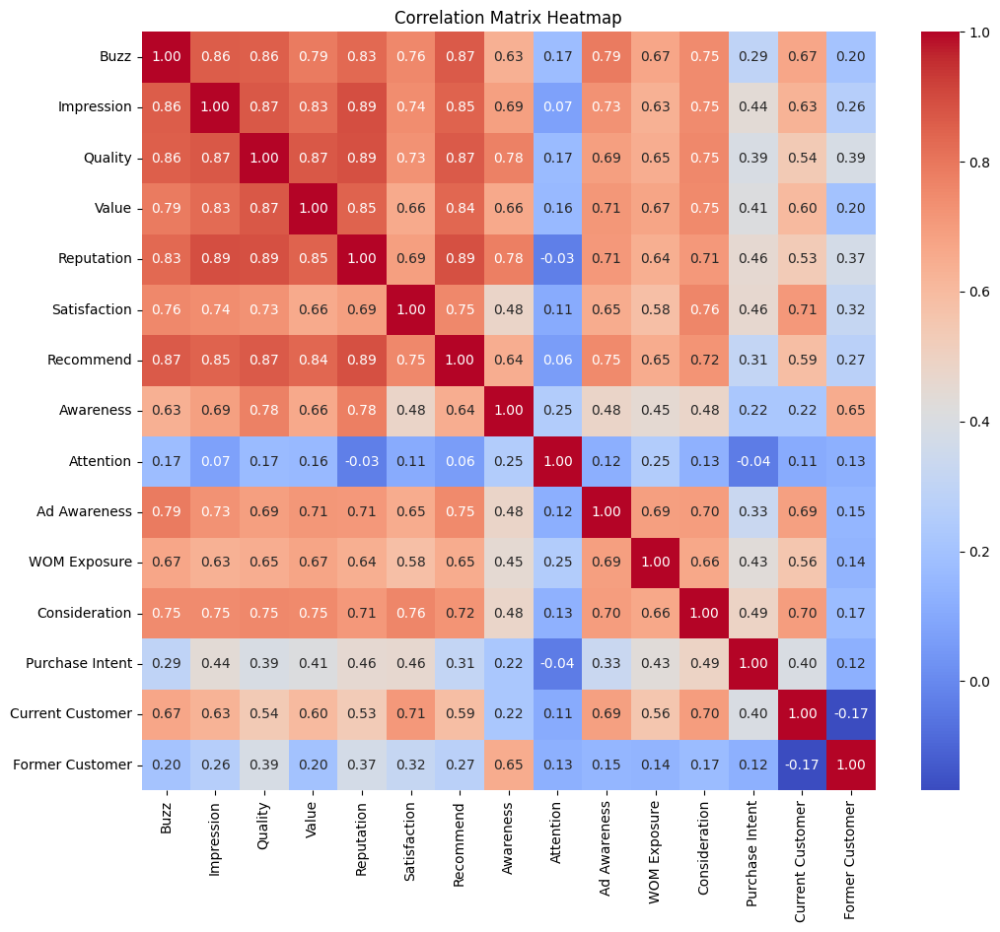

Top correlated variables for weekly_data_Power horse.csv:
           Variable Top Correlated Variable  Correlation  Best Lag
0              Buzz               Recommend     0.867086         0
1              Buzz              Impression     0.860039         0
2              Buzz                 Quality     0.855734         0
3              Buzz              Reputation     0.834215         0
4              Buzz                   Value     0.789263         0
..              ...                     ...          ...       ...
70  Former Customer               Awareness     0.651862         0
71  Former Customer                 Quality     0.386522         0
72  Former Customer              Reputation     0.373074         0
73  Former Customer            Satisfaction     0.319534         0
74  Former Customer               Recommend     0.274793         0

[75 rows x 4 columns]


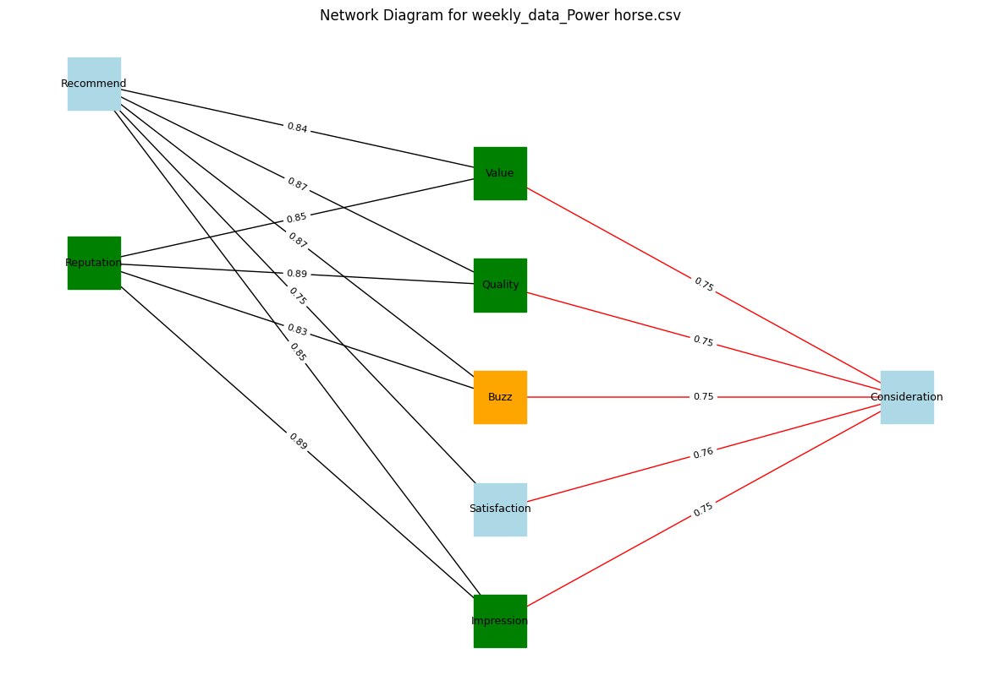

Processing weekly data for weekly_data_Sting.csv


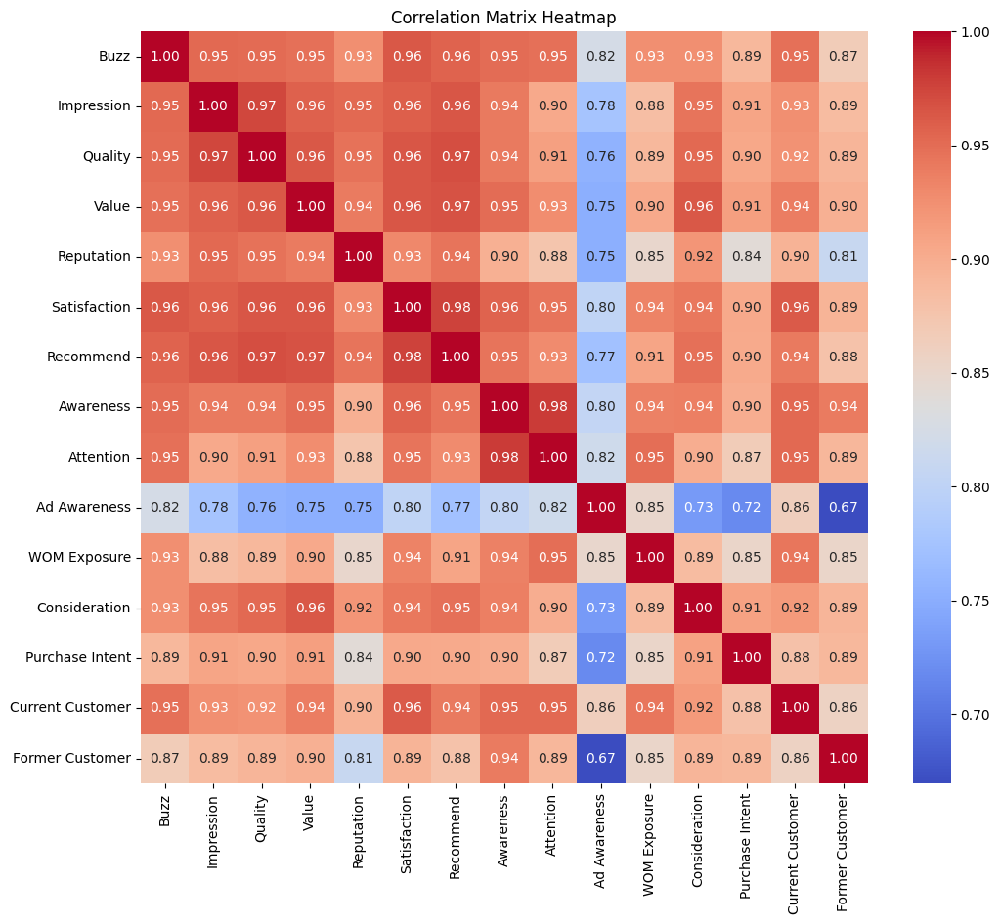

Top correlated variables for weekly_data_Sting.csv:
           Variable Top Correlated Variable  Correlation  Best Lag
0              Buzz            Satisfaction     0.962598         0
1              Buzz               Recommend     0.957401         0
2              Buzz              Impression     0.953365         0
3              Buzz                 Quality     0.951206         0
4              Buzz               Awareness     0.949942         0
..              ...                     ...          ...       ...
70  Former Customer               Awareness     0.939567         0
71  Former Customer                   Value     0.897866         0
72  Former Customer            Satisfaction     0.893362         0
73  Former Customer                 Quality     0.892687         0
74  Former Customer           Consideration     0.892648         0

[75 rows x 4 columns]


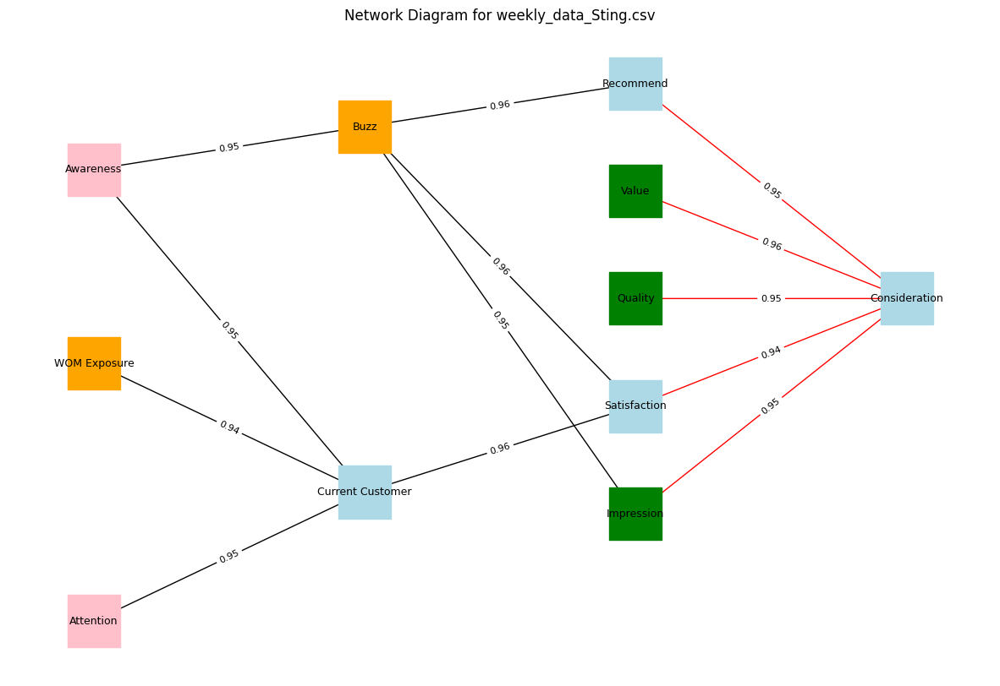

Processing monthly data for monthly_data_Red Bull.csv


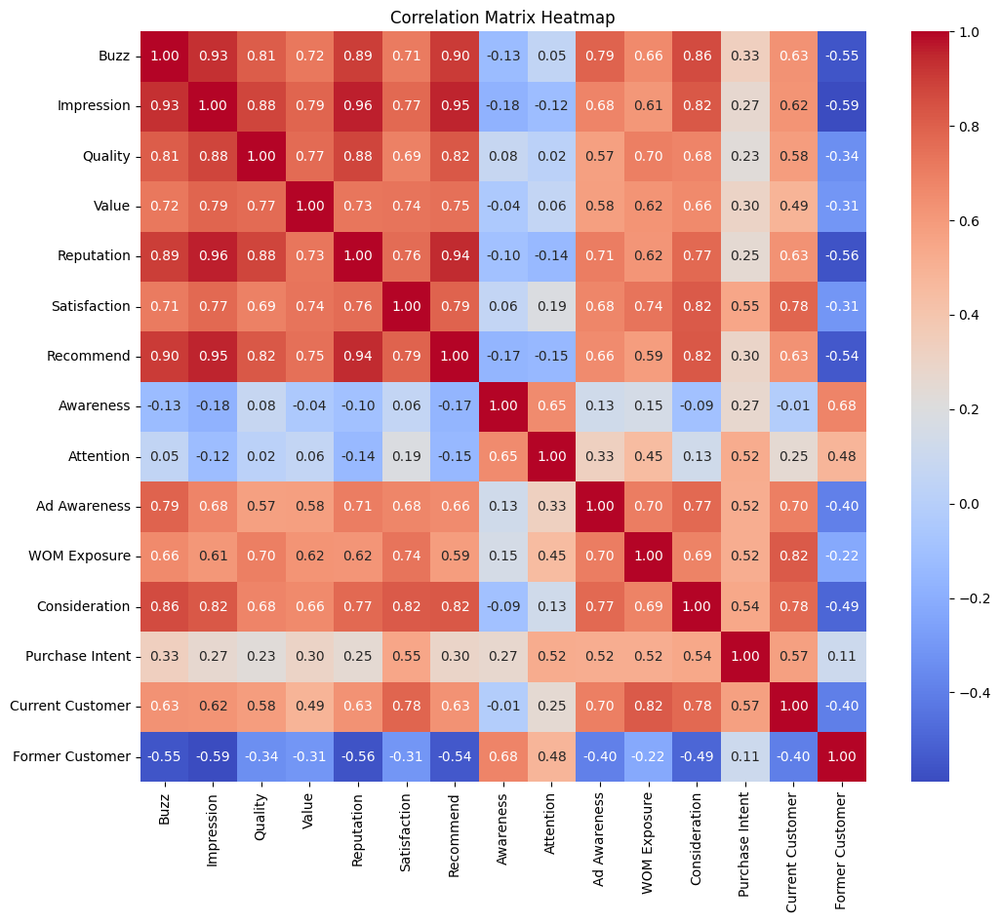

Top correlated variables for monthly_data_Red Bull.csv:
            Variable Top Correlated Variable  Correlation  Best Lag
0               Buzz              Impression     0.929222         0
1               Buzz               Recommend     0.903597         0
2               Buzz              Reputation     0.894707         0
3               Buzz           Consideration     0.861629         0
4               Buzz                 Quality     0.808836         0
..               ...                     ...          ...       ...
68  Current Customer            Ad Awareness     0.699257         0
69  Current Customer              Reputation     0.632298         0
70   Former Customer               Awareness     0.677906         0
71   Former Customer               Attention     0.478466         0
72   Former Customer         Purchase Intent     0.111825         0

[73 rows x 4 columns]


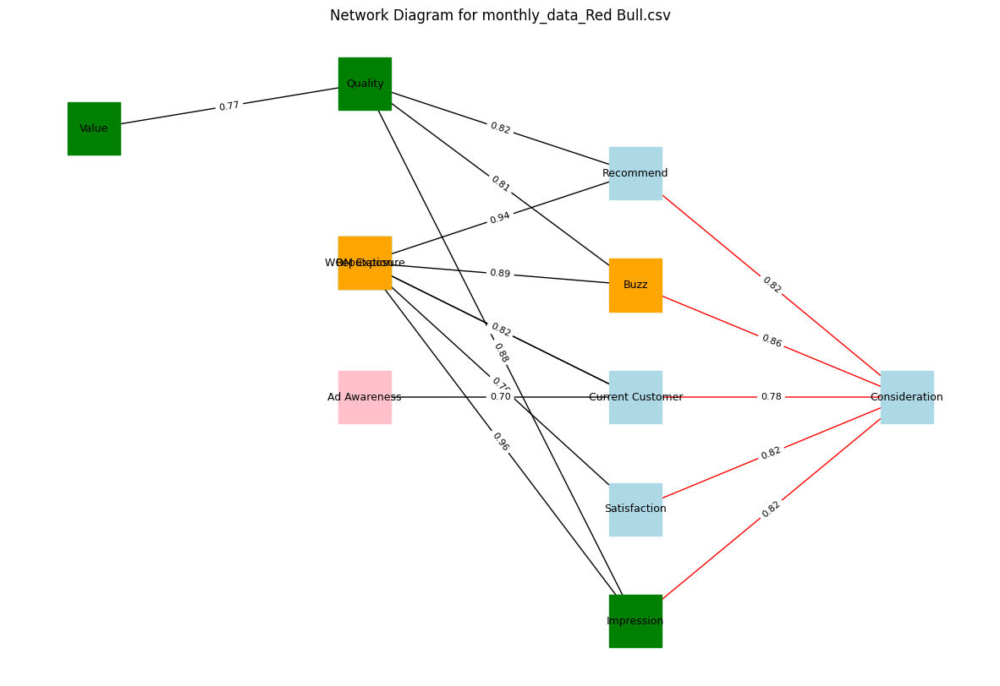

Processing monthly data for monthly_data_Power horse.csv


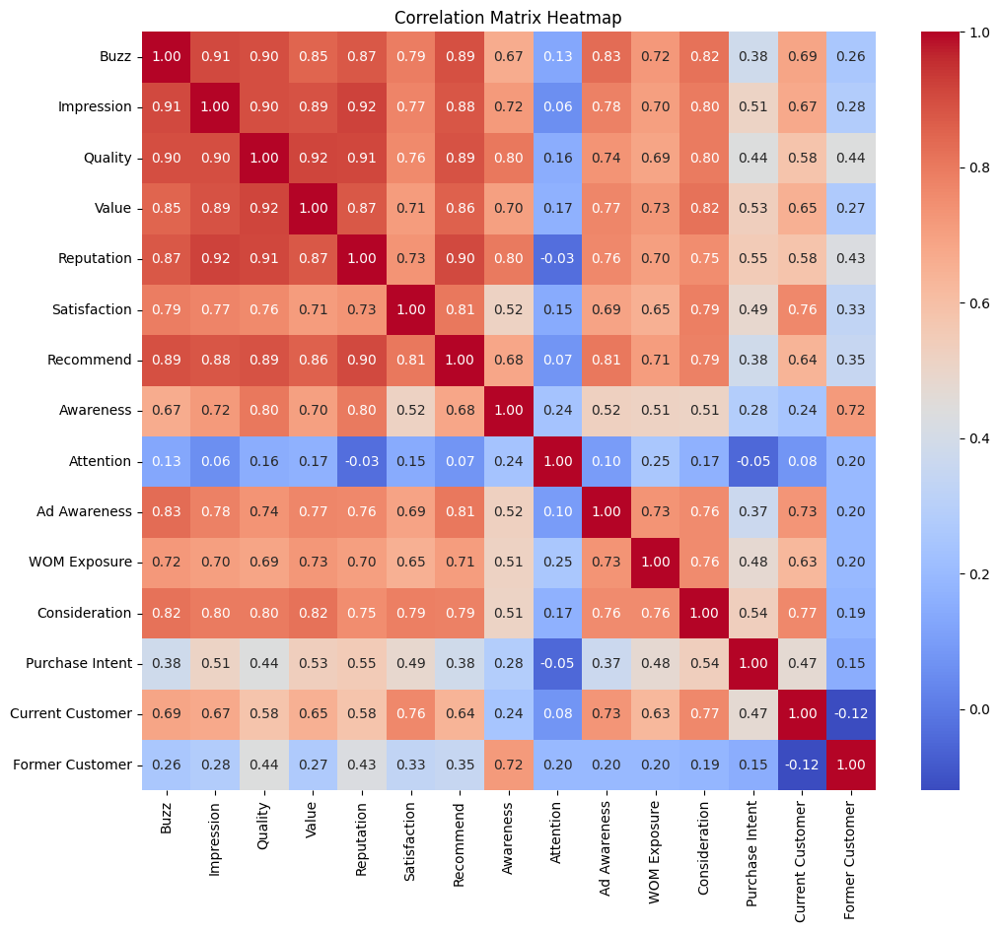

Top correlated variables for monthly_data_Power horse.csv:
           Variable Top Correlated Variable  Correlation  Best Lag
0              Buzz              Impression     0.907814         0
1              Buzz                 Quality     0.896900         0
2              Buzz               Recommend     0.891997         0
3              Buzz              Reputation     0.873483         0
4              Buzz                   Value     0.846983         0
..              ...                     ...          ...       ...
70  Former Customer               Awareness     0.718054         0
71  Former Customer                 Quality     0.439528         0
72  Former Customer              Reputation     0.428701         0
73  Former Customer               Recommend     0.351231         0
74  Former Customer            Satisfaction     0.331334         0

[75 rows x 4 columns]


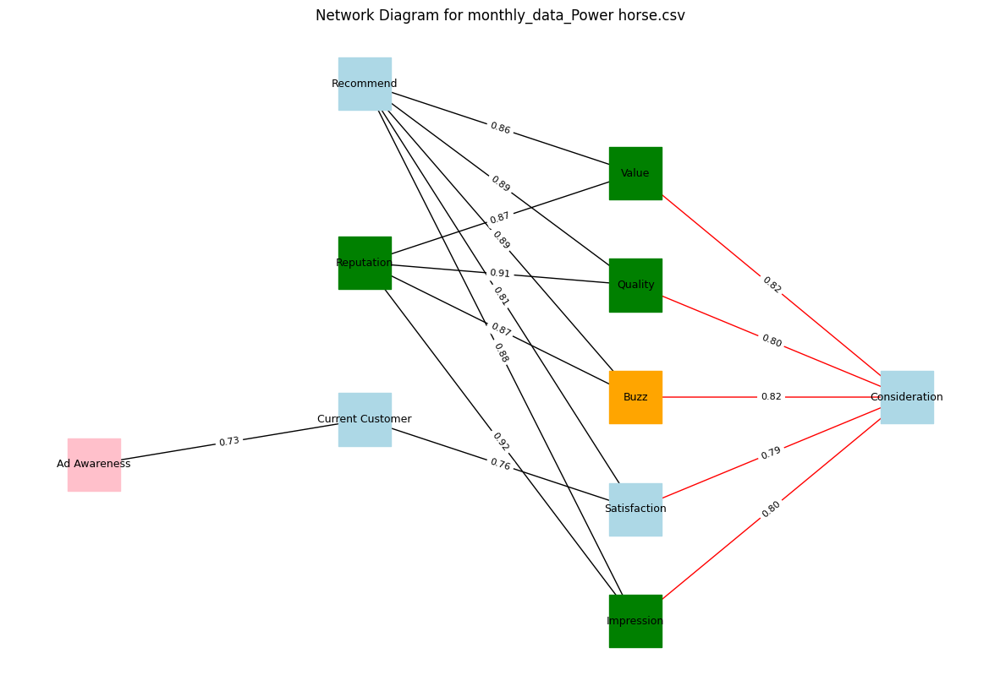

Processing monthly data for monthly_data_Sting.csv


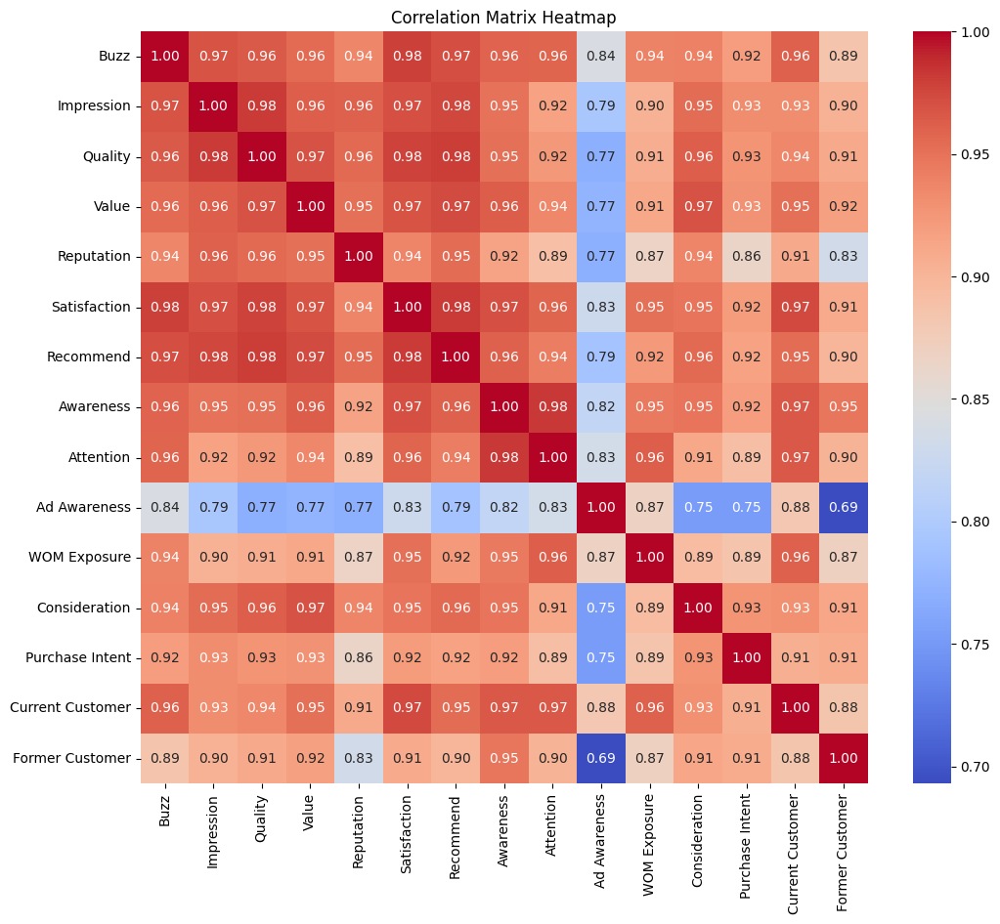

Top correlated variables for monthly_data_Sting.csv:
           Variable Top Correlated Variable  Correlation  Best Lag
0              Buzz            Satisfaction     0.979444         0
1              Buzz               Recommend     0.972258         0
2              Buzz              Impression     0.968204         0
3              Buzz                 Quality     0.964781         0
4              Buzz        Current Customer     0.961376         0
..              ...                     ...          ...       ...
70  Former Customer               Awareness     0.948329         0
71  Former Customer                   Value     0.918077         0
72  Former Customer           Consideration     0.912971         0
73  Former Customer                 Quality     0.910258         0
74  Former Customer            Satisfaction     0.909465         0

[75 rows x 4 columns]


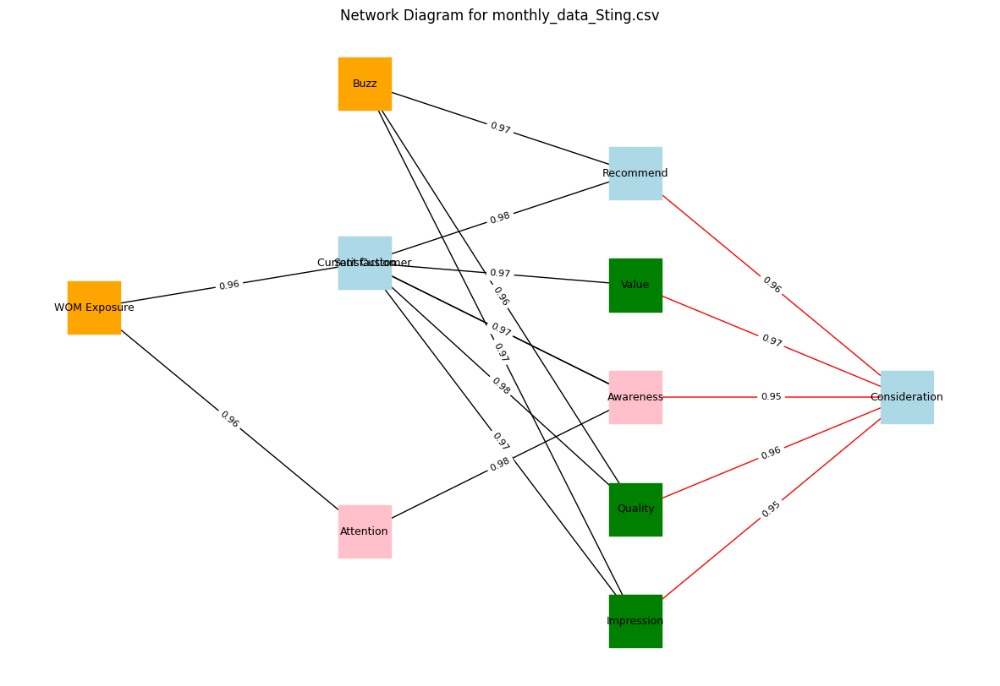

In [ ]:

import networkx as nx

for weekly_sums, weekly_file_name in week_results: # Removed the extra indentation here
    print(f"Processing weekly data for {weekly_file_name}")
    correlation_results = find_top_correlated_variables_no_lag(weekly_sums, Weekly_Dep_Var)
    print(f"Top correlated variables for {weekly_file_name}:\n{correlation_results}")
    build_network_diagram_no_lag(correlation_results, Weekly_Dep_Var, Weekly_Cor_Threshold, max_indirect_features, 5, weekly_file_name)

for monthly_sums, monthly_file_name in month_results: # Removed the extra indentation here
    print(f"Processing monthly data for {monthly_file_name}")
    correlation_results = find_top_correlated_variables_no_lag(monthly_sums, Monthly_Dep_Var)
    print(f"Top correlated variables for {monthly_file_name}:\n{correlation_results}")
    build_network_diagram_no_lag(correlation_results, Monthly_Dep_Var, Monthly_Cor_Threshold, max_indirect_features, 5, monthly_file_name)

In [ ]:

import pandas as pd

def calculate_3Vs_monthly(monthly_sums, monthly_file_name):
  df = monthly_sums.copy()
  df = df.reset_index()
  df['Date'] = pd.to_datetime(df['Date'])
  # Calculate Visibility
  df['Visibility'] = 2.947842 * (df['Ad Awareness'] * 0.609028 + df['Attention'] * 0.611609 + df['Awareness'] * 1)

  # Calculate Vibrancy
  df['Vibrancy'] = 1.316305 * (2 * df['Buzz'] + 2 * df['WOM Exposure'])

  # Calculate Variability
  df['Variability'] = 1 * (2.077761 * df['Impression'] + 1.488485 * df['Quality'] + 1.951797 * df['Value'] + 1 * df['Reputation'])

  # Save the DataFrame to a CSV file
  df.to_csv(f"{monthly_file_name}_with_metrics.csv", index=False)
  print_subheading(monthly_file_name)
  print(df)
  return(df)

In [ ]:

import pandas as pd

def summarize_yearly_data(df, monthly_file_name):
    # Convert 'Date' column to datetime objects if it's not already
    df = df.reset_index()
    df['Date'] = pd.to_datetime(df['Date'])

    # Extract the year from the 'Date' column
    df['Year'] = df['Date'].dt.year

    # Group by year and calculate the mean for all other columns
    yearly_data = df.groupby('Year').mean()

    # Calculate yearly Visibility, Vibrancy, and Variability
    yearly_data['Visibility'] = 2.947842 * (yearly_data['Ad Awareness'] * 0.609028 + yearly_data['Attention'] * 0.611609 + yearly_data['Awareness'] * 1)
    yearly_data['Vibrancy'] = 1.316305 * (2 * yearly_data['Buzz'] + 2 * yearly_data['WOM Exposure'])
    yearly_data['Variability'] = 1 * (2.077761 * yearly_data['Impression'] + 1.488485 * yearly_data['Quality'] + 1.951797 * yearly_data['Value'] + 1 * yearly_data['Reputation'])

    # Calculate total averages
    total_averages = yearly_data.mean()
    total_averages.name = 'Total Average'

    # Calculate total Visibility, Vibrancy, and Variability
    total_averages['Visibility'] = 2.947842 * (total_averages['Ad Awareness'] * 0.609028 + total_averages['Attention'] * 0.611609 + total_averages['Awareness'] * 1)
    total_averages['Vibrancy'] = 1.316305 * (2 * total_averages['Buzz'] + 2 * total_averages['WOM Exposure'])
    total_averages['Variability'] = 1 * (2.077761 * total_averages['Impression'] + 1.488485 * total_averages['Quality'] + 1.951797 * total_averages['Value'] + 1 * total_averages['Reputation'])


    # Append total averages and totals to the yearly data
    yearly_data = pd.concat([yearly_data, pd.DataFrame(total_averages).T])

    # Add total visibility, vibrancy, and variability to the end of the dataframe
    yearly_data.loc['Total', 'Visibility'] = total_averages['Visibility']
    yearly_data.loc['Total', 'Vibrancy'] = total_averages['Vibrancy']
    yearly_data.loc['Total', 'Variability'] = total_averages['Variability']


    # Save the yearly data to a new file
    yearly_data.to_csv(f"{monthly_file_name}_with_yearly_metrics.csv", index=False)
    print(f"Yearly data saved to {monthly_file_name}_with_yearly_metrics.csv")
    print_subheading(monthly_file_name)
    print(yearly_data)
    return (yearly_data)
# Example usage (assuming you have a DataFrame called 'df' and want to save it to 'yearly_data.csv')
# Replace with the actual DataFrame name and filename
#summarize_yearly_data(df, 'yearly_data.csv')

In [ ]:
import pandas as pd
monthly_sums_3vs = []
yearly_sums_3vs = []
sum_3V_df = None
sum_3V_df_yearly = None

for monthly_sums, monthly_file_name in month_results:
    sum_3V_df = calculate_3Vs_monthly(monthly_sums, monthly_file_name)
    sum_3V_df_yearly = summarize_yearly_data(monthly_sums, monthly_file_name)
    monthly_sums_3vs.append((sum_3V_df, monthly_file_name))
    yearly_sums_3vs.append((sum_3V_df_yearly, monthly_file_name))


---

monthly_data_Red Bull.csv

---

         Date        Volume       Buzz  Impression    Quality      Value  \
0  2022-01-01  33759.276988  16.783275   17.547351  19.243582  13.586383   
1  2022-02-01  27968.478245  18.747846   20.584178  23.977500  15.876963   
2  2022-03-01  32346.841211  20.985334   21.179403  26.582361  16.439451   
3  2022-04-01  31183.613576  21.703874   22.062580  26.550499  16.352529   
4  2022-05-01  33843.478458  17.525761   19.441579  24.107176  15.462979   
5  2022-06-01  31419.155425  18.193221   18.528944  22.259990  14.683208   
6  2022-07-01  31802.218262  19.071544   18.114957  22.023092  14.244245   
7  2022-08-01  34456.311774  20.185137   20.469035  23.921848  14.683845   
8  2022-09-01  33151.726779  20.422420   20.324642  23.866308  14.482902   
9  2022-10-01  33510.161967  17.717026   18.382831  20.781387  14.881618   
10 2022-11-01  31784.788064  18.880356   19.007936  22.146880  14.497303   
11 2022-12-01  32828.523280  20.047673   18.300543

In [ ]:
# prompt: Please write a code to create a data frame with one line for each filenames and their associated total annual 3v score for Visibility,  Vibrancy,  Variability from yearly_sums_3vs using the monthly_file_name for file name and the last total 3V score for each Visibility Variability and Vibrancy from sum_3V_df_yearly and print the same

import pandas as pd

# Assuming yearly_sums_3vs and sum_3V_df_yearly are defined as in the provided code

def create_3v_summary_dataframe(yearly_sums_3vs):
    """
    Creates a DataFrame with filenames and their total annual 3V scores.

    Args:
        yearly_sums_3vs: A list of tuples, where each tuple contains a DataFrame
                         (yearly_sums) and a filename (monthly_file_name).

    Returns:
        A pandas DataFrame.
    """

    data = []
    for yearly_sums, monthly_file_name in yearly_sums_3vs:
        # Extract the last row which contains the total 3V scores
        last_row = yearly_sums.iloc[-1]

        # Append data for each file
        data.append({
            'Filename': monthly_file_name,
            'Total Visibility': last_row['Visibility'],
            'Total Vibrancy': last_row['Vibrancy'],
            'Total Variability': last_row['Variability']
        })

    # Create the dataframe
    df = pd.DataFrame(data)

    return df

# Example usage:
df_3v_summary = create_3v_summary_dataframe(yearly_sums_3vs)
print(df_3v_summary)

                       Filename  Total Visibility  Total Vibrancy  \
0     monthly_data_Red Bull.csv        284.870404       92.232407   
1  monthly_data_Power horse.csv        113.836697       27.009901   
2        monthly_data_Sting.csv        212.037184       66.673520   

   Total Variability  
0         119.480554  
1          39.863417  
2          73.073489  


In [ ]:
# prompt: Please write a code to create a data frame with one line for each filenames and their associated Total Average all variables except for Date, Volume and Index, if present,  from yearly_sums_3vs using the monthly_file_name for file name and the Total Average value for each field (except for Date, Volume and Index, if present) from sum_3V_df_yearly and print the same. the Total average row is last but one row

import pandas as pd

def create_3v_summary_dataframe(yearly_sums_3vs):
    """
    Creates a DataFrame with filenames and their total annual 3V scores.

    Args:
        yearly_sums_3vs: A list of tuples, where each tuple contains a DataFrame
                         (yearly_sums) and a filename (monthly_file_name).

    Returns:
        A pandas DataFrame.
    """

    data = []
    for yearly_sums, monthly_file_name in yearly_sums_3vs:
        # Extract the second last row which contains the total averages
        total_averages_row = yearly_sums.iloc[-2]

        # Create a dictionary to store the data for this file
        file_data = {'Filename': monthly_file_name}

        # Iterate through the columns and add total average values to the file_data dictionary, excluding specified columns
        columns_to_exclude = ['Date', 'Volume', 'Index','index']  # Add 'Index' if it's present
        for column in yearly_sums.columns:
          if column not in columns_to_exclude:
              file_data[f'Total Average {column}'] = total_averages_row[column]

        data.append(file_data)

    # Create the dataframe
    df = pd.DataFrame(data)

    return df

# Example usage (assuming yearly_sums_3vs is defined as in your provided code):
df_feature_summary = create_3v_summary_dataframe(yearly_sums_3vs)
df_feature_summary

,Filename,Total Average Buzz,Total Average Impression,Total Average Quality,Total Average Value,Total Average Reputation,Total Average Satisfaction,Total Average Recommend,Total Average Awareness,Total Average Attention,Total Average Ad Awareness,Total Average WOM Exposure,Total Average Consideration,Total Average Purchase Intent,Total Average Current Customer,Total Average Former Customer,Total Average Visibility,Total Average Vibrancy,Total Average Variability
0,monthly_data_Red Bull.csv,17.730254,17.850227,21.480626,14.823852,21.485309,12.015708,17.288274,65.206509,29.914488,21.566253,17.304335,11.812475,4.039503,10.630278,16.149215,284.870404,92.232407,119.480554
1,monthly_data_Power horse.csv,5.592444,5.692129,6.989972,5.356092,7.178062,3.380460,5.673717,29.844369,10.202527,4.158484,4.667298,3.374442,0.439925,2.851434,5.673744,113.836697,27.009901,39.863417
2,monthly_data_Sting.csv,12.677067,11.272025,10.558055,11.778666,10.947846,8.184001,10.410039,48.782898,23.432720,14.473997,12.648948,8.346707,2.382065,9.853514,12.198569,212.037184,66.673520,73.073489


In [ ]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.linear_model import LinearRegression

def analyze_dependent_variable(df, file_path, dependent_var, start_date, end_date):
  """
  Analyzes a dependent variable within a specified date range, identifies outliers, imputes missing values,
  and provides descriptive statistics.

  Args:
      df: The DataFrame containing the data.
      file_path: The file path of the data source.
      dependent_var: The name of the dependent variable column.
      start_date: The start date of the analysis range (YYYY-MM-DD).
      end_date: The end date of the analysis range (YYYY-MM-DD).

  Returns:
      A dictionary containing the analysis results:
          - line_chart: The line chart of the dependent variable with outliers highlighted.
          - imputed_df: The DataFrame with missing values imputed.
          - descriptive_stats: A table with descriptive statistics (mean, median, std, etc.).
          - normality_test: The results of a normality test.
  """

  # Filter the DataFrame based on the date range
  df['Date'] = pd.to_datetime(df['Date'])
  filtered_df = df[(df['Date'] >= start_date) & (df['Date'] <= end_date)]

  # Identify outliers using the IQR method
  Q1 = filtered_df[dependent_var].quantile(0.25)
  Q3 = filtered_df[dependent_var].quantile(0.75)
  IQR = Q3 - Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR
  outliers = filtered_df[(filtered_df[dependent_var] < lower_bound) | (filtered_df[dependent_var] > upper_bound)]

  # Impute missing values using linear regression
  imputed_df = filtered_df.copy()
  if imputed_df[dependent_var].isnull().any():
    # Create a linear regression model
    X = imputed_df.index.values.reshape(-1, 1)
    y = imputed_df[dependent_var].fillna(imputed_df[dependent_var].mean())  # Fill with mean for modeling

    # Fit the model
    model = LinearRegression()
    model.fit(X, y)

    # Predict missing values and replace them with the predictions
    missing_indices = imputed_df[dependent_var].isnull()
    predicted_values = model.predict(np.array(imputed_df.index[missing_indices]).reshape(-1, 1))
    imputed_df.loc[missing_indices, dependent_var] = predicted_values

  # Create the line chart
  plt.figure(figsize=(12, 6))
  plt.plot(filtered_df['Date'], filtered_df[dependent_var], label ='Actual Data', color='blue', linestyle='-')
  if not outliers.empty:
    plt.scatter(outliers['Date'], outliers[dependent_var], color='red', label='Outliers',marker='o')

    # Plot the imputed values
  plt.plot(imputed_df['Date'], imputed_df[dependent_var], label='Imputed Data', color='green', linestyle='--')

  plt.xlabel('Date')
  plt.ylabel(dependent_var)
  plt.title(f'Line Chart of {dependent_var} ({start_date} - {end_date})')
  plt.grid(True)

  if not outliers.empty:
      plt.legend()

  # Calculate descriptive statistics
  descriptive_stats = filtered_df[dependent_var].describe()
  yearly_stats = {}
  for year in filtered_df['Date'].dt.year.unique():
    yearly_data = filtered_df[filtered_df['Date'].dt.year == year][dependent_var]
    yearly_stats[year] = {
        'mean': yearly_data.mean(),
        'median': yearly_data.median(),
        'std': yearly_data.std(),
    }

  # Perform a normality test (Shapiro-Wilk)
  normality_test = stats.shapiro(filtered_df[dependent_var].dropna())

  results = {
      'line_chart': plt,  # Store the matplotlib plot object
      'imputed_df': imputed_df,
      'descriptive_stats': descriptive_stats,
      'yearly_stats': yearly_stats,
      'normality_test': normality_test
  }

  return results

# Example usage (replace with your own DataFrame and variable names)
#df = pd.read_csv('your_file.csv')  # Replace with your file path
#results = analyze_dependent_variable(df, 'your_file.csv', 'Consideration', '2023-01-01', '2023-12-31')

# Access the results
#plt.show(results['line_chart'])
#print(results['descriptive_stats'])
#print(results['yearly_stats'])
#print(results['normality_test'])



Analysis Results for monthly_data_Red Bull.csv
Descriptive Statistics:
count    36.000000
mean     11.828332
std       1.446494
min       9.099959
25%      10.944276
50%      11.790530
75%      12.903846
max      14.639069
Name: Consideration, dtype: float64

Yearly Statistics:
{2022: {'mean': 12.084944012911812, 'median': 11.891254364015168, 'std': 1.049073790860548}, 2023: {'mean': 12.709110173025527, 'median': 12.991983020969188, 'std': 1.414569948040624}, 2024: {'mean': 10.690941581267294, 'median': 10.923178166620769, 'std': 1.107474743278456}}

Normality Test:
ShapiroResult(statistic=0.9754661720220238, pvalue=0.5920600023534387)


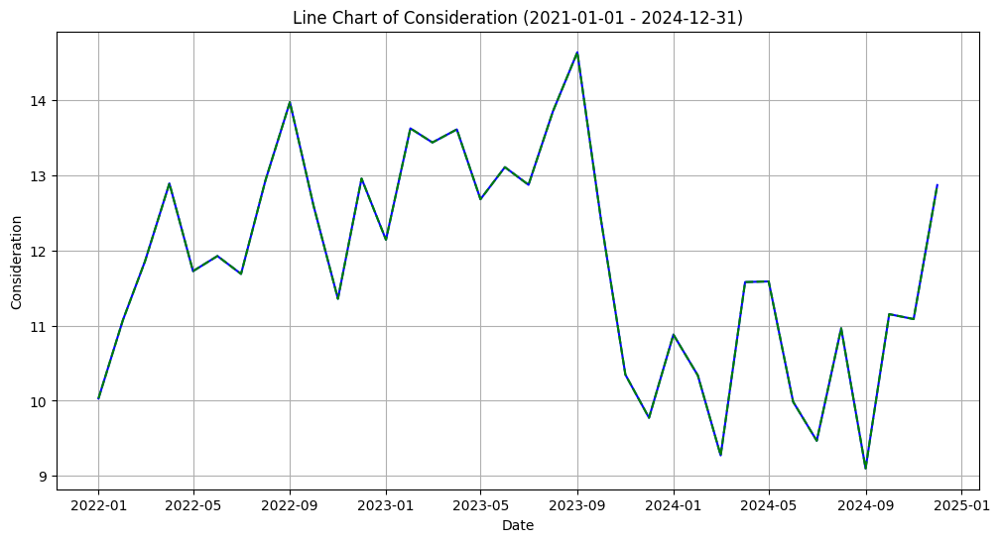

Analysis Results for monthly_data_Power horse.csv
Descriptive Statistics:
count    36.000000
mean      3.556809
std       0.770665
min       2.348870
25%       2.995329
50%       3.585629
75%       3.986240
max       5.549087
Name: Consideration, dtype: float64

Yearly Statistics:
{2022: {'mean': 3.891249077684591, 'median': 3.9242743032258387, 'std': 0.28791432210061013}, 2023: {'mean': 3.8662762303317013, 'median': 3.7645588166254473, 'std': 1.0157319378702818}, 2024: {'mean': 2.912901396443534, 'median': 2.9518930136756616, 'std': 0.3104012761062922}}

Normality Test:
ShapiroResult(statistic=0.963935513379683, pvalue=0.2834119654855078)


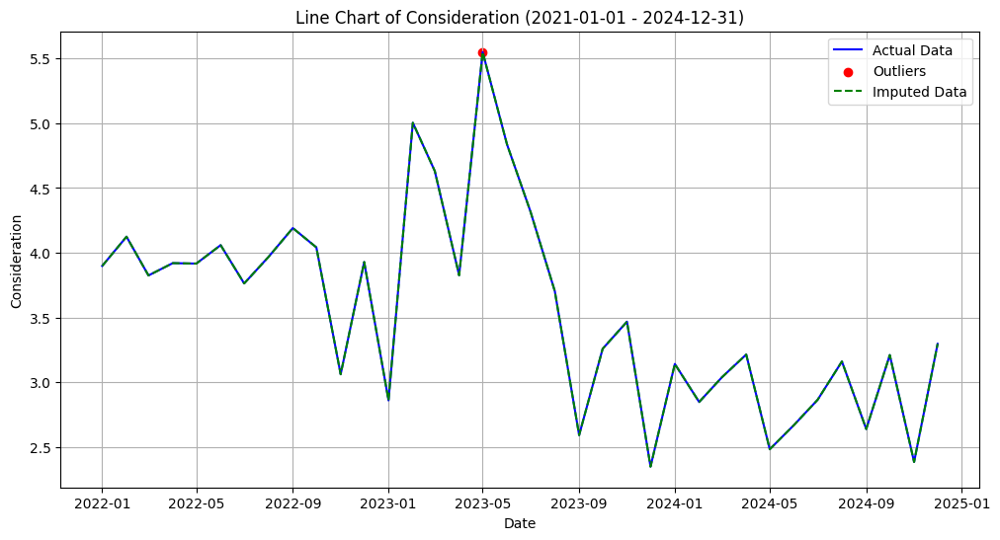

Analysis Results for monthly_data_Sting.csv
Descriptive Statistics:
count    36.000000
mean      7.407101
std       2.658939
min       2.695933
25%       5.419035
50%       7.546193
75%       9.411127
max      12.068343
Name: Consideration, dtype: float64

Yearly Statistics:
{2022: {'mean': 4.496662164056352, 'median': 4.9272059043194965, 'std': 1.2713538930875337}, 2023: {'mean': 7.473076802538054, 'median': 7.546193441397579, 'std': 1.2647654084594742}, 2024: {'mean': 10.251565102941148, 'median': 10.468069563135412, 'std': 1.098798961469326}}

Normality Test:
ShapiroResult(statistic=0.9633890802355123, pvalue=0.2728619573866167)


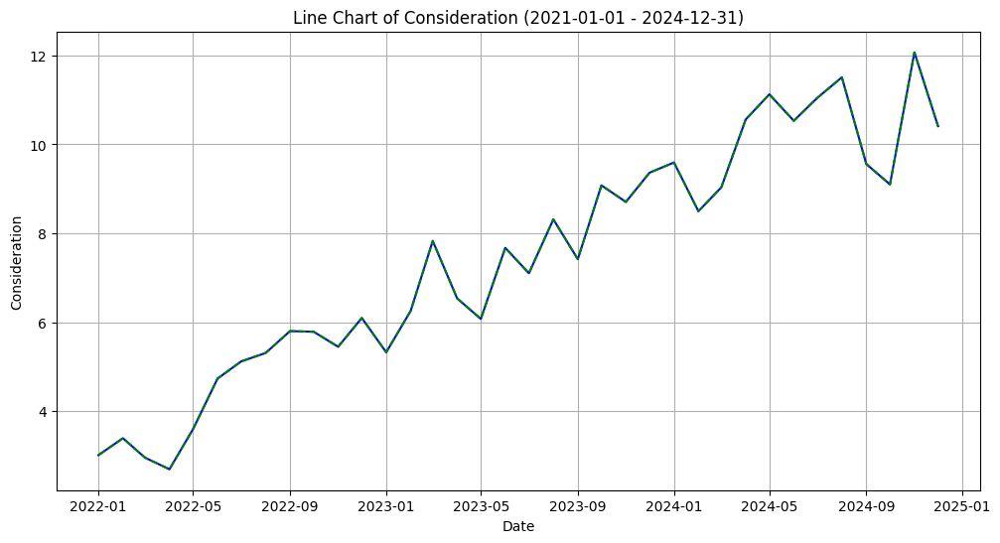

In [ ]:

all_analysis_results = []

for monthly_sums, monthly_file_name in month_results:
    df = monthly_sums.copy()
    df = df.reset_index()
    dependent_var = Monthly_Dep_Var
    start_date = '2021-01-01'
    end_date = '2024-12-31'

    try:
        results = analyze_dependent_variable(df, monthly_file_name, dependent_var, start_date, end_date)
        analysis_result = {
            'file_path': monthly_file_name,
            'dependent_var': dependent_var,
            'start_date': start_date,
            'end_date': end_date,
            'descriptive_stats': results['descriptive_stats'],
            'yearly_stats': results['yearly_stats'],
            'normality_test': results['normality_test'],
        }
        all_analysis_results.append(analysis_result)

        # Print results for each file
        print('\033[1m' + f"Analysis Results for {monthly_file_name}" + '\033[0m')
        print("Descriptive Statistics:")
        print(results['descriptive_stats'])
        print("\nYearly Statistics:")
        print(results['yearly_stats'])
        print("\nNormality Test:")
        print(results['normality_test'])
        plt.show(results['line_chart'])

    except Exception as e:
        print(f"Error analyzing {monthly_file_name}: {e}")


# Now you have a list of analysis results for each file in all_analysis_results


In [ ]:

def create_flat_table_from_weekly_sums(weekly_sums, weekly_file_name, weekly_correlation_results_dfs, dependent_var, correlation_threshold=0.4):
    """
    Creates a flat table from weekly_sums, including only independent variables with a correlation
    value greater than the specified threshold, lagged according to the correlation results.

    Args:
        weekly_sums: The DataFrame containing the weekly summary data.
        weekly_file_name: The name of the weekly file.
        weekly_correlation_results_dfs: A list of tuples (correlation_results_df, file_name).
        correlation_threshold: The minimum correlation value to include an independent variable.

    Returns:
        A new DataFrame with lagged independent variables and the dependent variable.
    """

    # Find the correlation results for the current file
    correlation_results = None
    for results, file_name in weekly_correlation_results_dfs:
        if file_name == weekly_file_name:
            correlation_results = results
            break

    if correlation_results is None:
        print(f"Correlation results not found for {weekly_file_name}")
        return None

    #df_all = weekly_sums.drop(columns=['Purchase Intent']).copy()
    df_all = weekly_sums.copy()


    flat_table_data = {
        #'Date': df_all.index,  # Assuming the index is the date
        dependent_var: df_all[dependent_var]
    }

    #df = weekly_sums.copy()
    df = pd.DataFrame()

    # Debug: Print correlation results to track which variables are correlated
    print("Correlation Results:")


    # Iterate through correlation results and add lagged variables
    for _, row in correlation_results.iterrows():
        if row['Correlation'] > correlation_threshold:
            variable = row['Variable']
            lagged_variable = row['Top Correlated Variable']
            best_lag = row['Best Lag']

            # Check if lagged_variable is the dependent variable
            if lagged_variable.strip().lower() == dependent_var.strip().lower() or lagged_variable == 'Purchase Intent'  :
                print(f"Skipping lagged variable: {lagged_variable}")
                continue  # Skip if the lagged variable is the dependent variable

            lagged_column = f'{lagged_variable}_lag_{best_lag}'
            if lagged_column not in df.columns:
                df[lagged_column] = df_all[lagged_variable].shift(best_lag)
                flat_table_data[f'{lagged_variable}_lagged_{best_lag}'] = df[lagged_column]

    # Add at least one independent variable even if correlation is below threshold
    if len(flat_table_data) == 1:  # Only dependent variable present
        print(f"No correlated variables found above threshold {correlation_threshold} for {weekly_file_name}. Adding at least one independent variable.")
        for _, row in correlation_results.iterrows():
            lagged_variable = row['Top Correlated Variable']
            if lagged_variable.strip().lower() != dependent_var.strip().lower() and lagged_variable != 'Purchase Intent':
                best_lag = row['Best Lag']
                flat_table_data[f'{lagged_variable}_lagged_{best_lag}'] = df_all[lagged_variable].shift(best_lag)
                break  # Add only one independent variable

    flat_table = pd.DataFrame(flat_table_data)
    print(flat_table.head())
    flat_table = flat_table.dropna()

    return flat_table, weekly_file_name, correlation_threshold, dependent_var


# Example usage:
# Assuming you have week_results and weekly_correlation_results_dfs as defined in your code:




In [ ]:

def prepare_data_for_modeling(flat_table, weekly_file_name, dependent_var):
  """
  Prepares data for modeling by removing null values, calculating log of fraction changes,
  and checking for multicollinearity.

  Args:
      flat_table: DataFrame with lagged independent variables and dependent variable.
      weekly_file_name: The name of the weekly file.
      dependent_var: Name of the dependent variable.

  Returns:
      A tuple containing:
          - prepared_df: DataFrame with processed data.
          - vif_scores: Variance Inflation Factor scores for multicollinearity.
  """
  print(f"\nPreparing data for modeling for {weekly_file_name}...")

  prepared_df = flat_table.copy()

  # Remove rows with null values
  prepared_df = prepared_df.dropna()

  lr = Log_Variance

  if lr == 'y':

    # Calculate log of fraction change for each variable (including dependent)
    for column in prepared_df.columns:
      if column != 'Date':
        prepared_df[column] = np.log(prepared_df[column] / prepared_df[column].shift(1))

    # Remove rows with infinite or NaN values after log transformation
    prepared_df = prepared_df.replace([np.inf, -np.inf], np.nan).dropna()

  # Check for multicollinearity using Variance Inflation Factor (VIF)
  from statsmodels.stats.outliers_influence import variance_inflation_factor

  independent_vars = prepared_df.columns.difference([dependent_var, 'Date'])
  vif_scores = pd.DataFrame()
  vif_scores['Variable'] = independent_vars
  vif_scores['VIF'] = [variance_inflation_factor(prepared_df[independent_vars].values, i) for i in range(prepared_df[independent_vars].shape[1])]


  print(f"\nVIF Scores for {weekly_file_name}:")
  print(vif_scores)

  # Other potential qualifying factors:
  # 1. Correlation matrix to visualize relationships between variables (already done in previous step)
  # 2. Distribution of variables (can be checked using histograms or density plots)
  # 3. Outlier detection and handling

  return prepared_df, vif_scores, weekly_file_name


# Example usage (replace with your actual flat_table and dependent_var):
# flat_table, weekly_file_name, correlation_threshold, dependent_var = create_flat_table_from_weekly_sums(...)

# for weekly_sums, weekly_file_name in week_results:
#   flat_table, weekly_file_name, correlation_threshold, dependent_var = create_flat_table_from_weekly_sums(
#       weekly_sums, weekly_file_name, weekly_correlation_results_dfs, 'Consideration')
#   if flat_table is not None:
#       prepared_df, vif_scores = prepare_data_for_modeling(flat_table, weekly_file_name, dependent_var)


# You can now use the prepared_df for your modeling.
# Be sure to address multicollinearity if the VIF scores are high.


In [ ]:

import statsmodels.formula.api as sm
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression, Ridge, Lasso # Import Ridge and Lasso
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LogisticRegression
from statsmodels.stats.stattools import durbin_watson
from sklearn.preprocessing import PolynomialFeatures


def polynomial_regression_analysis(prepared_df, dependent_var, weekly_file_name):
    """
    Performs polynomial regression analysis on the prepared DataFrame.

    Args:
        prepared_df: The prepared DataFrame with log-transformed variables.
        dependent_var: The name of the dependent variable.
        weekly_file_name: The name of the weekly file.

    Returns:
        None
    """
    print(f"\nPolynomial Regression Analysis for {weekly_file_name}...")

    #prepared_df = prepared_df.drop(columns=['Reputation_lagged_1', 'Reputation_lagged_16']).copy()

    independent_vars = prepared_df.columns.difference([dependent_var, 'Date'])
    X = prepared_df[independent_vars]
    y = prepared_df[dependent_var]

    # Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Multiple Linear Regression
    print("\nMultiple Linear Regression:")
    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print_regression_metrics(y_test, y_pred, model, weekly_file_name, "Multiple Linear Regression", X_train.columns)

    # Polynomial Regression (degree 2)
    print("\nPolynomial Regression (degree 2):")
    polynomial_features = PolynomialFeatures(degree=2)
    X_poly = polynomial_features.fit_transform(X_train)
    model = LinearRegression()
    model.fit(X_poly, y_train)
    y_pred = model.predict(polynomial_features.transform(X_test))
    poly_feature_names = polynomial_features.get_feature_names_out(X_train.columns)
    print_regression_metrics(y_test, y_pred, model, weekly_file_name, "Polynomial Regression (degree 2)", poly_feature_names)

    # Gradient Boosting Regressor
    print("\nGradient Boosting Regressor:")
    model = GradientBoostingRegressor()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print_regression_metrics(y_test, y_pred, model, weekly_file_name, "Gradient Boosting Regressor", X_train.columns)

    # Random Forest Regressor
    print("\nRandom Forest Regressor:")
    model = RandomForestRegressor()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print_regression_metrics(y_test, y_pred, model, weekly_file_name, "Random Forest Regressor", X_train.columns)


    # Lasso Regression
    print("\nLasso Regression:")
    model = Lasso(alpha=2.0)  # You can adjust the alpha parameter
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print_regression_metrics(y_test, y_pred, model, weekly_file_name, "Lasso Regression", X_train.columns)

    # Ridge Regression
    print("\nRidge Regression:")
    model = Ridge(alpha=2.0)  # You can adjust the alpha parameter
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    adjusted_r2, r2, equation, dw = print_regression_metrics(y_test, y_pred, model, weekly_file_name, "Ridge Regression", X_train.columns)

    # Feature Importance Analysis for Ridge Regression
    feature_importance = pd.Series(index=independent_vars, data=np.abs(model.coef_))
    feature_importance = feature_importance.sort_values(ascending=False)

    print("\nFeature Importance (Ridge Regression):")
    print(feature_importance)

    return feature_importance, r2, adjusted_r2, equation, dw



def print_regression_metrics(y_test, y_pred, model, weekly_file_name, model_name, independent_vars):
    """
    Prints regression metrics for a given model.
    """

    # Calculate metrics
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)

    # Adjusted R-squared calculation
    if hasattr(model, 'rsquared_adj'):
        adjusted_r2 = model.rsquared_adj
    else:
        n = len(y_test)
        p = len(model.coef_) if hasattr(model, 'coef_') else 0  # Check if model has coef_ attribute
        adjusted_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)  # Calculate adjusted R-squared

    dw = durbin_watson(y_test - y_pred)  # Calculate Durbin-Watson statistic

    # Print metrics
    print(f"Model: {model_name}")
    print(f"Adjusted R-squared: {adjusted_r2:.4f}")
    print(f"R-squared: {r2:.4f}")
    print(f"MSE: {mse:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"Durbin-Watson: {dw:.4f}")
    equation = ""

    # Print equation for relevant models
    if model_name in ["Multiple Linear Regression", "Polynomial Regression (degree 2)", "Ridge Regression", "Lasso Regression"]:
        equation = f"{dependent_var} = "

        num_coefs = len(model.coef_)  # Get number of coefficients
        num_vars = len(independent_vars)  # Get number of independent variables

        # Iterate through coefficients and variables, ensuring they match in length
        for i in range(min(num_coefs, num_vars)):
            equation += f"{model.coef_[i]:.4f} * {independent_vars[i]} + "

        equation += f"{model.intercept_:.4f}"  # Add intercept to the equation
        print(f"Equation: {equation}")

    # Plot actual vs. estimated values
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_pred)
    plt.xlabel("Actual Values")
    plt.ylabel("Estimated Values")
    plt.title(f"Actual vs. Estimated Values for {weekly_file_name} ({model_name})")
    plt.show()
    return adjusted_r2, r2, equation, dw


Correlation Results:
Skipping lagged variable: Consideration
Skipping lagged variable: Consideration
Skipping lagged variable: Consideration
Skipping lagged variable: Consideration
Skipping lagged variable: Purchase Intent
Skipping lagged variable: Consideration
Skipping lagged variable: Consideration
Skipping lagged variable: Consideration
Skipping lagged variable: Consideration
Skipping lagged variable: Consideration
Skipping lagged variable: Purchase Intent
Skipping lagged variable: Consideration
Skipping lagged variable: Consideration
Skipping lagged variable: Consideration
Skipping lagged variable: Consideration
            Consideration  Buzz_lagged_1  Reputation_lagged_1  \
Date                                                            
2022-01-01      10.031462            NaN                  NaN   
2022-02-01      11.074780      16.783275            20.695601   
2022-03-01      11.855890      18.747846            25.653256   
2022-04-01      12.893575      20.985334          

/usr/local/lib/python3.11/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)



VIF Scores for monthly_data_Red Bull.csv:
                     Variable  VIF
0       Ad Awareness_lagged_1  inf
1      Ad Awareness_lagged_11  inf
2       Ad Awareness_lagged_3  inf
3       Ad Awareness_lagged_5  inf
4          Attention_lagged_5  inf
5          Attention_lagged_6  inf
6          Awareness_lagged_4  inf
7               Buzz_lagged_1  inf
8               Buzz_lagged_3  inf
9               Buzz_lagged_5  inf
10  Current Customer_lagged_1  inf
11  Current Customer_lagged_4  inf
12  Current Customer_lagged_8  inf
13   Former Customer_lagged_1  inf
14  Former Customer_lagged_15  inf
15        Impression_lagged_1  inf
16       Impression_lagged_10  inf
17        Impression_lagged_3  inf
18           Quality_lagged_1  inf
19           Quality_lagged_3  inf
20           Quality_lagged_8  inf
21         Recommend_lagged_1  inf
22         Recommend_lagged_3  inf
23         Recommend_lagged_4  inf
24         Recommend_lagged_8  inf
25        Reputation_lagged_1  inf
26       Rep

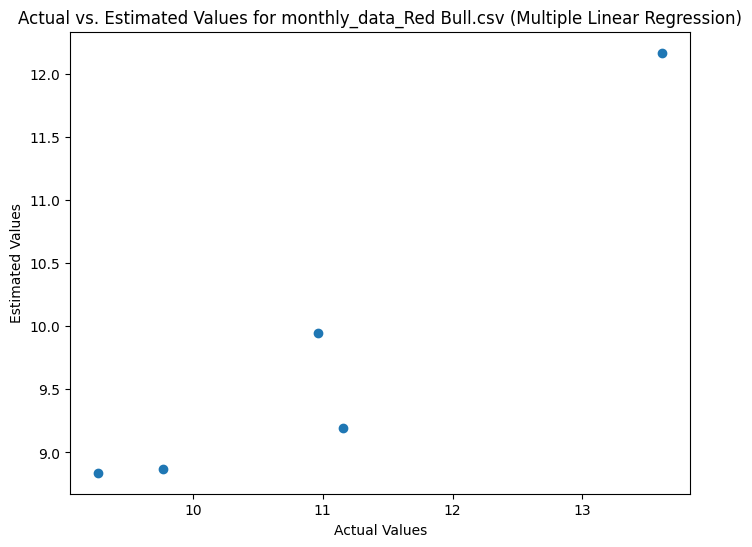


Polynomial Regression (degree 2):
Model: Polynomial Regression (degree 2)
Adjusted R-squared: 1.0038
R-squared: 0.2286
MSE: 1.7476
RMSE: 1.3220
Durbin-Watson: 0.3104
Equation: Consideration = -0.0000 * 1 + 0.0000 * Ad Awareness_lagged_1 + -0.0000 * Ad Awareness_lagged_11 + 0.0000 * Ad Awareness_lagged_3 + -0.0000 * Ad Awareness_lagged_5 + 0.0000 * Attention_lagged_5 + 0.0000 * Attention_lagged_6 + -0.0000 * Awareness_lagged_4 + 0.0000 * Buzz_lagged_1 + -0.0000 * Buzz_lagged_3 + -0.0000 * Buzz_lagged_5 + 0.0000 * Current Customer_lagged_1 + -0.0000 * Current Customer_lagged_4 + 0.0000 * Current Customer_lagged_8 + -0.0000 * Former Customer_lagged_1 + 0.0000 * Former Customer_lagged_15 + -0.0000 * Impression_lagged_1 + -0.0000 * Impression_lagged_10 + 0.0000 * Impression_lagged_3 + -0.0000 * Quality_lagged_1 + 0.0000 * Quality_lagged_3 + -0.0000 * Quality_lagged_8 + -0.0000 * Recommend_lagged_1 + -0.0000 * Recommend_lagged_3 + 0.0000 * Recommend_lagged_4 + 0.0000 * Recommend_lagged_8 + 

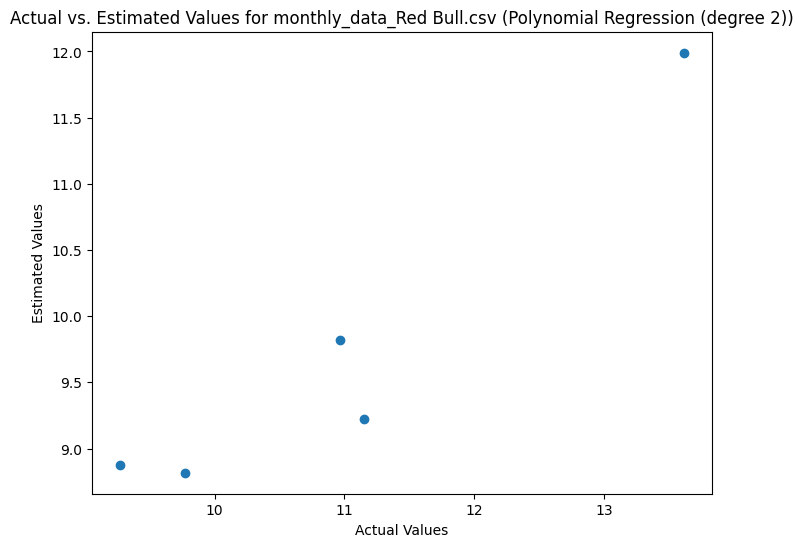


Gradient Boosting Regressor:
Model: Gradient Boosting Regressor
Adjusted R-squared: 0.3316
R-squared: 0.3316
MSE: 1.5142
RMSE: 1.2305
Durbin-Watson: 0.8216


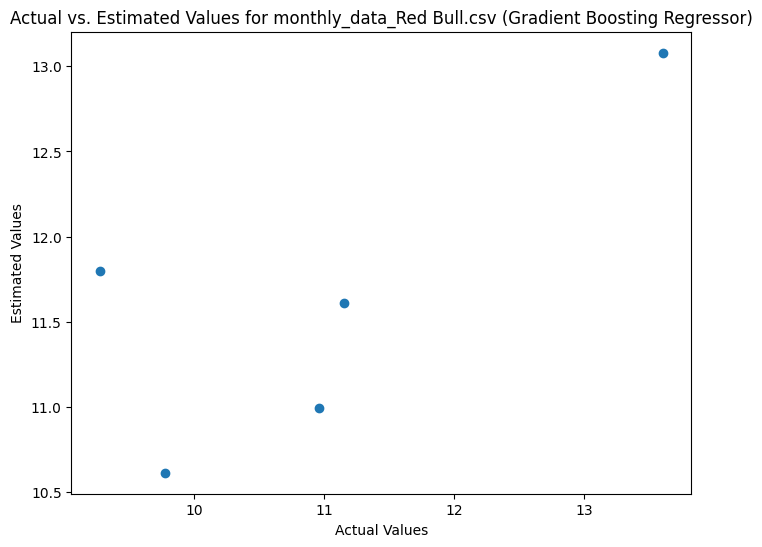


Random Forest Regressor:
Model: Random Forest Regressor
Adjusted R-squared: 0.5648
R-squared: 0.5648
MSE: 0.9858
RMSE: 0.9929
Durbin-Watson: 1.0673


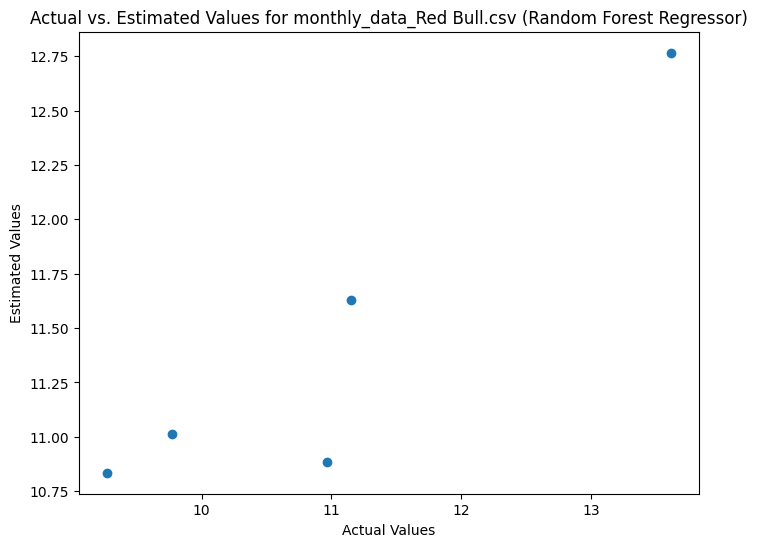


Lasso Regression:
Model: Lasso Regression
Adjusted R-squared: 1.0983
R-squared: 0.1397
MSE: 1.9490
RMSE: 1.3961
Durbin-Watson: 1.2327
Equation: Consideration = 0.0000 * Ad Awareness_lagged_1 + -0.0000 * Ad Awareness_lagged_11 + 0.0000 * Ad Awareness_lagged_3 + 0.0000 * Ad Awareness_lagged_5 + -0.0000 * Attention_lagged_5 + -0.0000 * Attention_lagged_6 + -0.0000 * Awareness_lagged_4 + 0.0000 * Buzz_lagged_1 + 0.0000 * Buzz_lagged_3 + 0.0000 * Buzz_lagged_5 + 0.0000 * Current Customer_lagged_1 + 0.0000 * Current Customer_lagged_4 + 0.0000 * Current Customer_lagged_8 + -0.0000 * Former Customer_lagged_1 + 0.0000 * Former Customer_lagged_15 + 0.0000 * Impression_lagged_1 + -0.0000 * Impression_lagged_10 + 0.0000 * Impression_lagged_3 + 0.0000 * Quality_lagged_1 + 0.0000 * Quality_lagged_3 + -0.0000 * Quality_lagged_8 + 0.0000 * Recommend_lagged_1 + 0.0000 * Recommend_lagged_3 + 0.0000 * Recommend_lagged_4 + 0.0000 * Recommend_lagged_8 + 0.0907 * Reputation_lagged_1 + -0.0000 * Reputation_

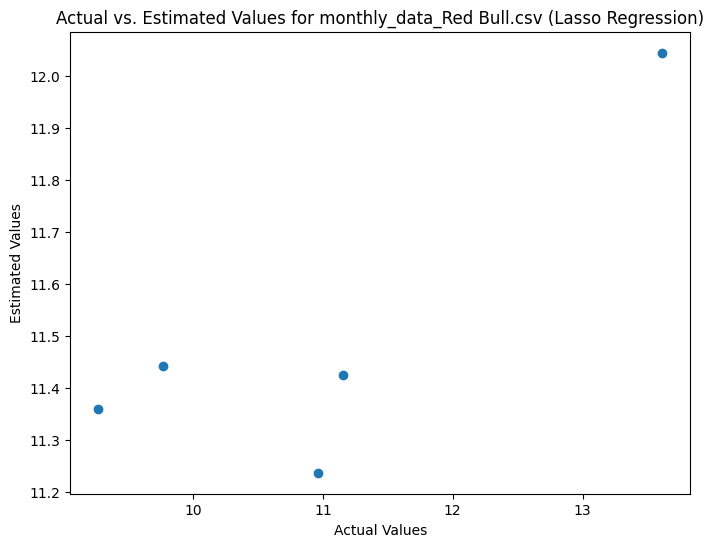


Ridge Regression:
Model: Ridge Regression
Adjusted R-squared: 1.0568
R-squared: 0.5032
MSE: 1.1254
RMSE: 1.0608
Durbin-Watson: 0.5104
Equation: Consideration = 0.1535 * Ad Awareness_lagged_1 + -0.1967 * Ad Awareness_lagged_11 + 0.0001 * Ad Awareness_lagged_3 + -0.1157 * Ad Awareness_lagged_5 + 0.1193 * Attention_lagged_5 + 0.1359 * Attention_lagged_6 + -0.1408 * Awareness_lagged_4 + 0.0522 * Buzz_lagged_1 + -0.0477 * Buzz_lagged_3 + -0.1312 * Buzz_lagged_5 + 0.1862 * Current Customer_lagged_1 + -0.2544 * Current Customer_lagged_4 + 0.1385 * Current Customer_lagged_8 + -0.0760 * Former Customer_lagged_1 + 0.2439 * Former Customer_lagged_15 + -0.1367 * Impression_lagged_1 + -0.0509 * Impression_lagged_10 + 0.0201 * Impression_lagged_3 + -0.1337 * Quality_lagged_1 + 0.1010 * Quality_lagged_3 + -0.1054 * Quality_lagged_8 + -0.0537 * Recommend_lagged_1 + -0.0082 * Recommend_lagged_3 + 0.1374 * Recommend_lagged_4 + 0.2388 * Recommend_lagged_8 + 0.0301 * Reputation_lagged_1 + 0.0616 * Reputa

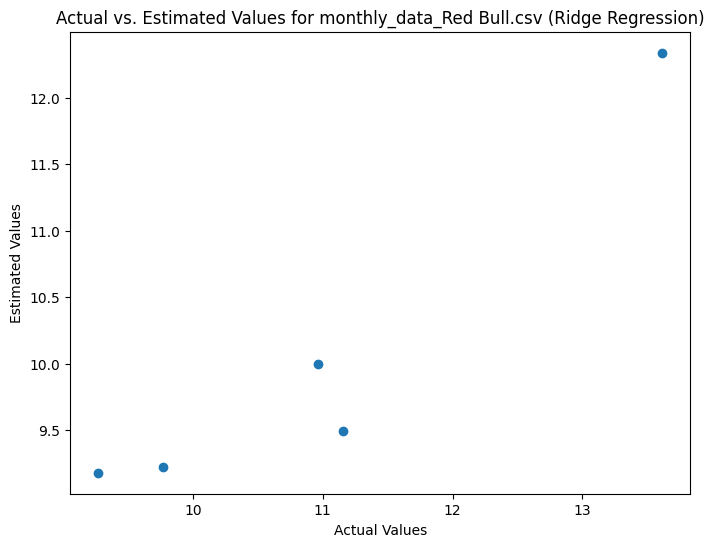


Feature Importance (Ridge Regression):
WOM Exposure_lagged_7        0.273774
Current Customer_lagged_4    0.254425
Former Customer_lagged_15    0.243948
Recommend_lagged_8           0.238792
WOM Exposure_lagged_10       0.219707
Value_lagged_2               0.198828
Ad Awareness_lagged_11       0.196742
Value_lagged_3               0.187433
Current Customer_lagged_1    0.186240
Satisfaction_lagged_10       0.159315
Ad Awareness_lagged_1        0.153517
Reputation_lagged_3          0.150855
Awareness_lagged_4           0.140780
Current Customer_lagged_8    0.138518
Satisfaction_lagged_1        0.138036
Recommend_lagged_4           0.137384
Impression_lagged_1          0.136679
Attention_lagged_6           0.135919
Quality_lagged_1             0.133699
Buzz_lagged_5                0.131151
Attention_lagged_5           0.119290
Ad Awareness_lagged_5        0.115699
Quality_lagged_8             0.105355
Quality_lagged_3             0.101034
Value_lagged_10              0.100636
Satisfacti

/usr/local/lib/python3.11/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)



VIF Scores for monthly_data_Power horse.csv:
                      Variable  VIF
0        Ad Awareness_lagged_1  inf
1       Ad Awareness_lagged_12  inf
2        Ad Awareness_lagged_3  inf
3        Ad Awareness_lagged_4  inf
4           Awareness_lagged_1  inf
5          Awareness_lagged_12  inf
6          Awareness_lagged_14  inf
7          Awareness_lagged_15  inf
8           Awareness_lagged_8  inf
9                Buzz_lagged_1  inf
10              Buzz_lagged_14  inf
11               Buzz_lagged_3  inf
12               Buzz_lagged_8  inf
13   Current Customer_lagged_1  inf
14  Current Customer_lagged_11  inf
15   Current Customer_lagged_2  inf
16   Current Customer_lagged_3  inf
17   Current Customer_lagged_4  inf
18   Current Customer_lagged_8  inf
19   Former Customer_lagged_14  inf
20   Former Customer_lagged_15  inf
21   Former Customer_lagged_16  inf
22         Impression_lagged_1  inf
23        Impression_lagged_14  inf
24        Impression_lagged_16  inf
25         Impress

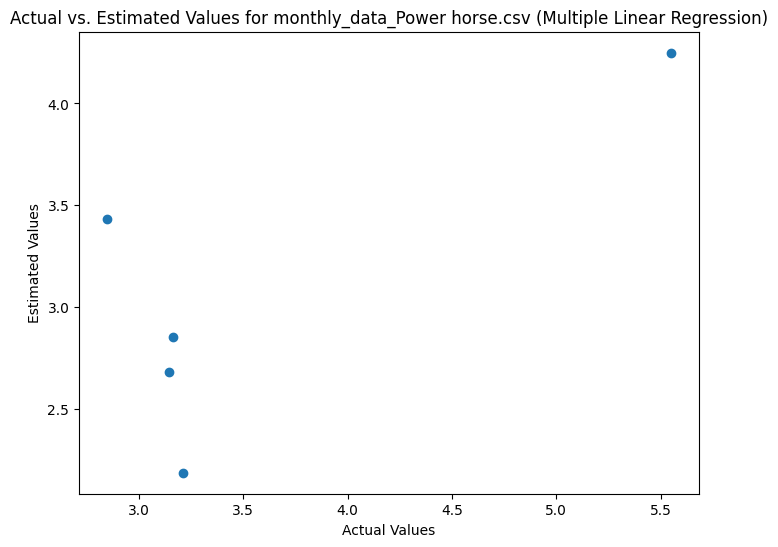


Polynomial Regression (degree 2):
Model: Polynomial Regression (degree 2)
Adjusted R-squared: 1.0016
R-squared: 0.3093
MSE: 0.6793
RMSE: 0.8242
Durbin-Watson: 1.5863
Equation: Consideration = -0.0000 * 1 + 0.0000 * Ad Awareness_lagged_1 + -0.0000 * Ad Awareness_lagged_12 + -0.0000 * Ad Awareness_lagged_3 + 0.0000 * Ad Awareness_lagged_4 + -0.0000 * Awareness_lagged_1 + -0.0000 * Awareness_lagged_12 + -0.0000 * Awareness_lagged_14 + 0.0000 * Awareness_lagged_15 + -0.0000 * Awareness_lagged_8 + 0.0000 * Buzz_lagged_1 + 0.0000 * Buzz_lagged_14 + 0.0000 * Buzz_lagged_3 + 0.0000 * Buzz_lagged_8 + -0.0000 * Current Customer_lagged_1 + -0.0000 * Current Customer_lagged_11 + 0.0000 * Current Customer_lagged_2 + -0.0000 * Current Customer_lagged_3 + 0.0000 * Current Customer_lagged_4 + 0.0000 * Current Customer_lagged_8 + -0.0000 * Former Customer_lagged_14 + 0.0000 * Former Customer_lagged_15 + 0.0000 * Former Customer_lagged_16 + -0.0000 * Impression_lagged_1 + 0.0000 * Impression_lagged_14 

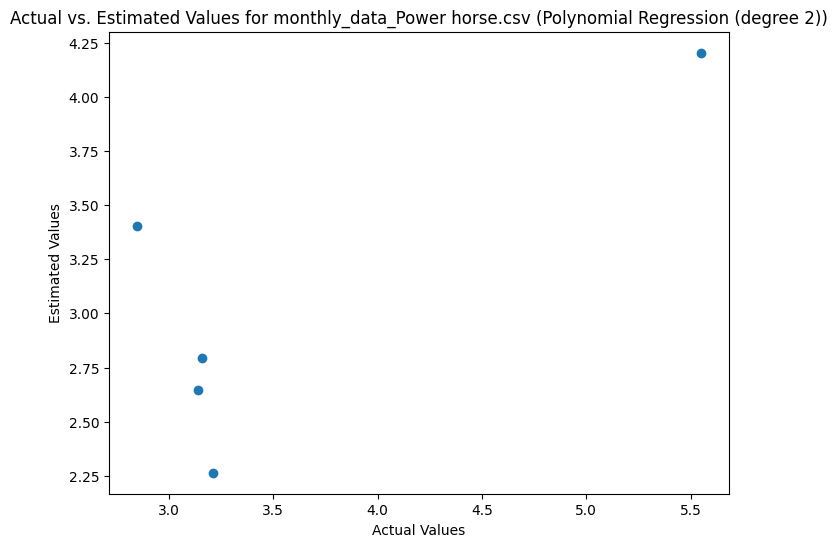


Gradient Boosting Regressor:
Model: Gradient Boosting Regressor
Adjusted R-squared: 0.4208
R-squared: 0.4208
MSE: 0.5696
RMSE: 0.7547
Durbin-Watson: 1.9427


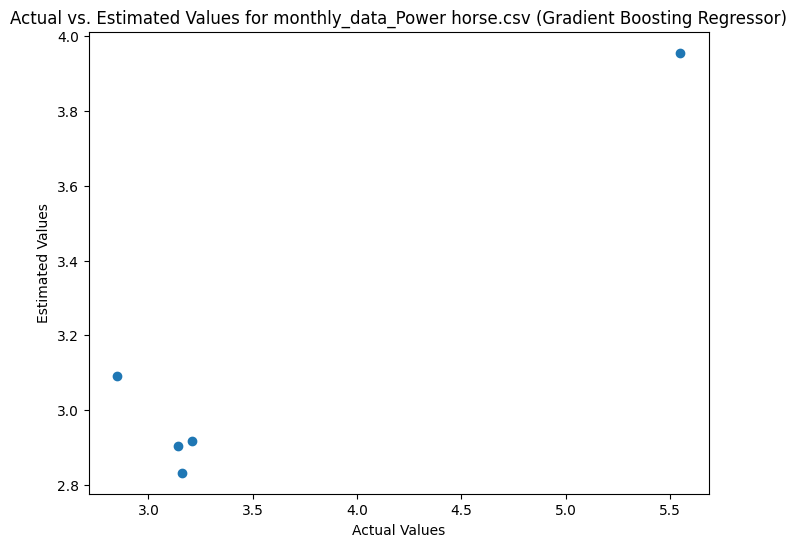


Random Forest Regressor:
Model: Random Forest Regressor
Adjusted R-squared: 0.3517
R-squared: 0.3517
MSE: 0.6376
RMSE: 0.7985
Durbin-Watson: 1.7085


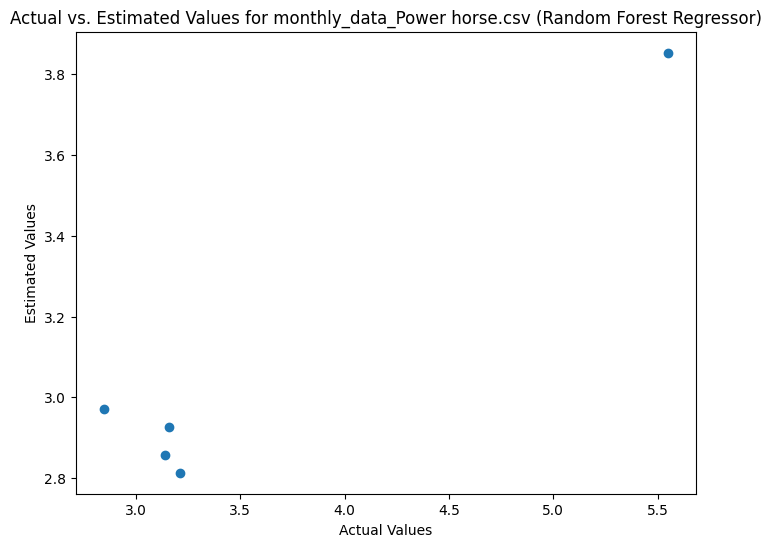


Lasso Regression:
Model: Lasso Regression
Adjusted R-squared: 1.0941
R-squared: -0.2472
MSE: 1.2266
RMSE: 1.1075
Durbin-Watson: 2.1513
Equation: Consideration = 0.0000 * Ad Awareness_lagged_1 + -0.0000 * Ad Awareness_lagged_12 + 0.0000 * Ad Awareness_lagged_3 + 0.0000 * Ad Awareness_lagged_4 + 0.0000 * Awareness_lagged_1 + 0.0000 * Awareness_lagged_12 + 0.0000 * Awareness_lagged_14 + 0.0000 * Awareness_lagged_15 + 0.0000 * Awareness_lagged_8 + 0.0000 * Buzz_lagged_1 + 0.0000 * Buzz_lagged_14 + 0.0000 * Buzz_lagged_3 + 0.0000 * Buzz_lagged_8 + 0.0000 * Current Customer_lagged_1 + 0.0000 * Current Customer_lagged_11 + 0.0000 * Current Customer_lagged_2 + 0.0000 * Current Customer_lagged_3 + 0.0000 * Current Customer_lagged_4 + 0.0000 * Current Customer_lagged_8 + 0.0000 * Former Customer_lagged_14 + 0.0000 * Former Customer_lagged_15 + 0.0000 * Former Customer_lagged_16 + 0.0000 * Impression_lagged_1 + 0.0000 * Impression_lagged_14 + 0.0000 * Impression_lagged_16 + 0.0000 * Impression_l

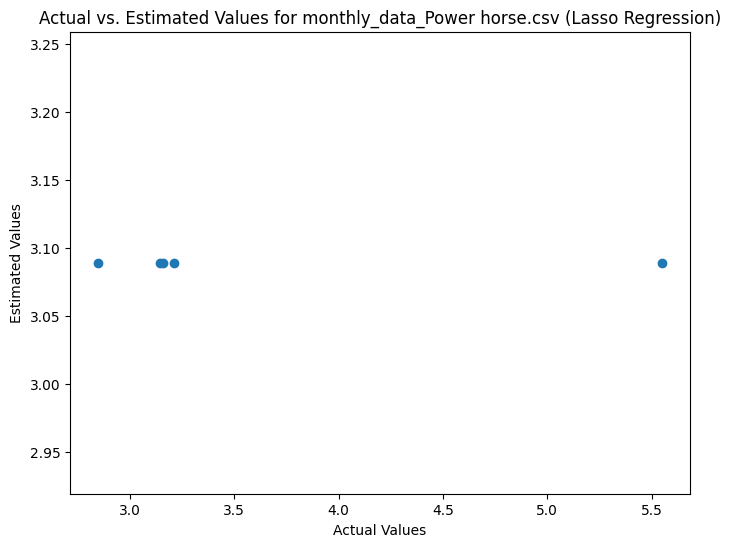


Ridge Regression:
Model: Ridge Regression
Adjusted R-squared: 1.0441
R-squared: 0.4160
MSE: 0.5743
RMSE: 0.7579
Durbin-Watson: 1.6241
Equation: Consideration = 0.0833 * Ad Awareness_lagged_1 + -0.0593 * Ad Awareness_lagged_12 + -0.0702 * Ad Awareness_lagged_3 + 0.0083 * Ad Awareness_lagged_4 + -0.0320 * Awareness_lagged_1 + 0.0185 * Awareness_lagged_12 + 0.0194 * Awareness_lagged_14 + 0.0732 * Awareness_lagged_15 + -0.0050 * Awareness_lagged_8 + 0.1248 * Buzz_lagged_1 + 0.0564 * Buzz_lagged_14 + 0.0275 * Buzz_lagged_3 + 0.0191 * Buzz_lagged_8 + -0.0165 * Current Customer_lagged_1 + -0.0039 * Current Customer_lagged_11 + 0.0234 * Current Customer_lagged_2 + -0.0492 * Current Customer_lagged_3 + 0.0185 * Current Customer_lagged_4 + 0.1085 * Current Customer_lagged_8 + -0.0053 * Former Customer_lagged_14 + 0.0835 * Former Customer_lagged_15 + 0.0857 * Former Customer_lagged_16 + -0.0176 * Impression_lagged_1 + 0.0152 * Impression_lagged_14 + -0.0130 * Impression_lagged_16 + 0.0008 * Impr

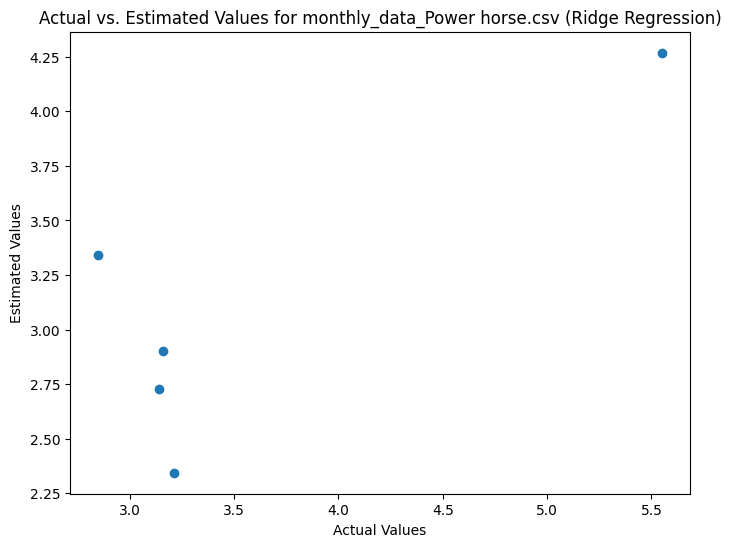


Feature Importance (Ridge Regression):
Quality_lagged_14             0.145088
Buzz_lagged_1                 0.124752
WOM Exposure_lagged_7         0.124416
Current Customer_lagged_8     0.108463
Reputation_lagged_4           0.106669
Quality_lagged_8              0.091674
Former Customer_lagged_16     0.085731
Former Customer_lagged_15     0.083504
Ad Awareness_lagged_1         0.083349
WOM Exposure_lagged_3         0.080987
Quality_lagged_1              0.078980
Value_lagged_8                0.073889
Impression_lagged_9           0.073837
Awareness_lagged_15           0.073216
Ad Awareness_lagged_3         0.070163
Satisfaction_lagged_1         0.065466
WOM Exposure_lagged_5         0.064885
Satisfaction_lagged_3         0.060459
Ad Awareness_lagged_12        0.059287
Buzz_lagged_14                0.056398
Current Customer_lagged_3     0.049247
Recommend_lagged_1            0.046436
Reputation_lagged_3           0.041155
Recommend_lagged_14           0.040187
Reputation_lagged_16    

/usr/local/lib/python3.11/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)



VIF Scores for monthly_data_Sting.csv:
                  Variable  VIF
0    Ad Awareness_lagged_1  inf
1    Ad Awareness_lagged_3  inf
2    Ad Awareness_lagged_8  inf
3       Attention_lagged_1  inf
4      Attention_lagged_16  inf
..                     ...  ...
59  WOM Exposure_lagged_16  inf
60   WOM Exposure_lagged_3  inf
61   WOM Exposure_lagged_4  inf
62   WOM Exposure_lagged_7  inf
63   WOM Exposure_lagged_8  inf

[64 rows x 2 columns]

Polynomial Regression Analysis for monthly_data_Sting.csv...

Multiple Linear Regression:
Model: Multiple Linear Regression
Adjusted R-squared: 1.0291
R-squared: 0.5638
MSE: 1.3468
RMSE: 1.1605
Durbin-Watson: 1.5166
Equation: Consideration = 0.0493 * Ad Awareness_lagged_1 + 0.0293 * Ad Awareness_lagged_3 + 0.0569 * Ad Awareness_lagged_8 + -0.0060 * Attention_lagged_1 + -0.0119 * Attention_lagged_16 + 0.1070 * Attention_lagged_4 + 0.0529 * Attention_lagged_6 + -0.1154 * Attention_lagged_7 + 0.0523 * Attention_lagged_8 + -0.0080 * Awareness_lagged_

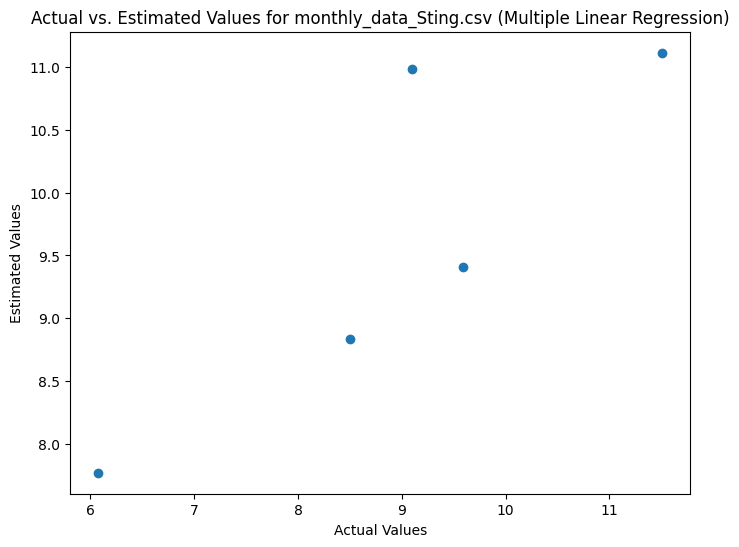


Polynomial Regression (degree 2):
Model: Polynomial Regression (degree 2)
Adjusted R-squared: 1.0009
R-squared: 0.5181
MSE: 1.4878
RMSE: 1.2198
Durbin-Watson: 1.4739
Equation: Consideration = -0.0000 * 1 + 0.0000 * Ad Awareness_lagged_1 + -0.0000 * Ad Awareness_lagged_3 + 0.0000 * Ad Awareness_lagged_8 + -0.0000 * Attention_lagged_1 + 0.0000 * Attention_lagged_16 + 0.0000 * Attention_lagged_4 + 0.0000 * Attention_lagged_6 + -0.0000 * Attention_lagged_7 + 0.0000 * Attention_lagged_8 + -0.0000 * Awareness_lagged_1 + -0.0000 * Awareness_lagged_5 + 0.0000 * Awareness_lagged_6 + 0.0000 * Awareness_lagged_8 + -0.0000 * Buzz_lagged_1 + 0.0000 * Buzz_lagged_10 + 0.0000 * Buzz_lagged_2 + 0.0000 * Buzz_lagged_3 + 0.0000 * Buzz_lagged_6 + -0.0000 * Current Customer_lagged_1 + 0.0000 * Current Customer_lagged_10 + 0.0000 * Current Customer_lagged_2 + -0.0000 * Current Customer_lagged_3 + -0.0000 * Current Customer_lagged_4 + 0.0000 * Current Customer_lagged_6 + -0.0000 * Current Customer_lagged_8

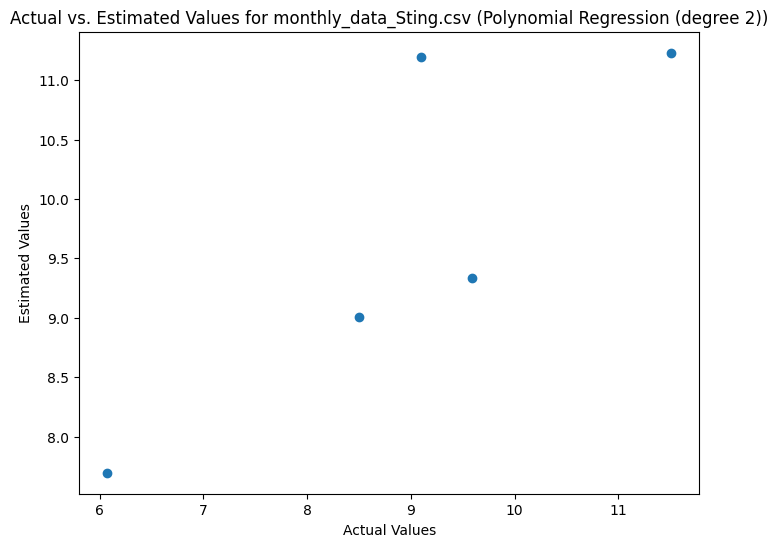


Gradient Boosting Regressor:
Model: Gradient Boosting Regressor
Adjusted R-squared: 0.2797
R-squared: 0.2797
MSE: 2.2240
RMSE: 1.4913
Durbin-Watson: 1.4642


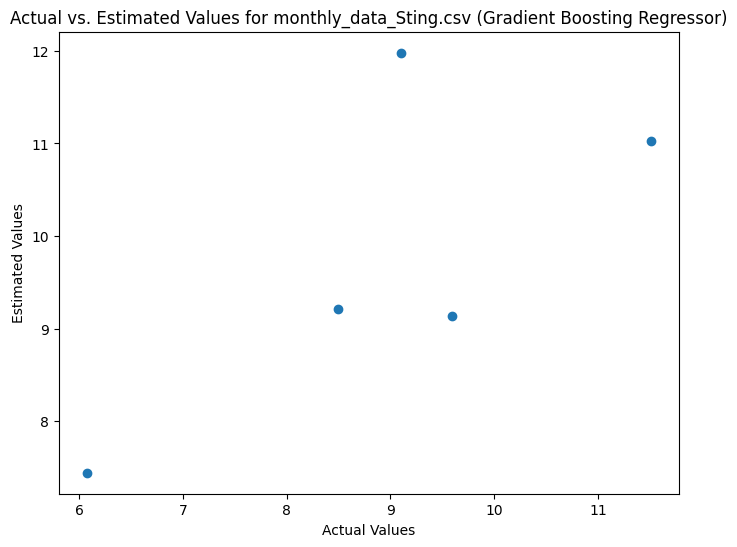


Random Forest Regressor:
Model: Random Forest Regressor
Adjusted R-squared: 0.5037
R-squared: 0.5037
MSE: 1.5325
RMSE: 1.2379
Durbin-Watson: 1.6381


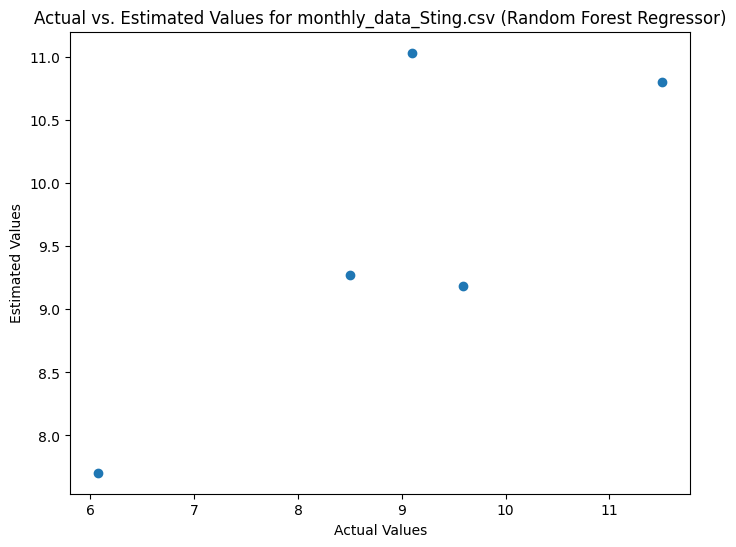


Lasso Regression:
Model: Lasso Regression
Adjusted R-squared: 1.0304
R-squared: 0.5435
MSE: 1.4095
RMSE: 1.1872
Durbin-Watson: 2.0145
Equation: Consideration = 0.0000 * Ad Awareness_lagged_1 + 0.0000 * Ad Awareness_lagged_3 + 0.0000 * Ad Awareness_lagged_8 + 0.0000 * Attention_lagged_1 + 0.0000 * Attention_lagged_16 + 0.0000 * Attention_lagged_4 + 0.0000 * Attention_lagged_6 + 0.0000 * Attention_lagged_7 + 0.0000 * Attention_lagged_8 + 0.0000 * Awareness_lagged_1 + 0.0122 * Awareness_lagged_5 + 0.0000 * Awareness_lagged_6 + 0.1204 * Awareness_lagged_8 + 0.0000 * Buzz_lagged_1 + 0.0000 * Buzz_lagged_10 + 0.0000 * Buzz_lagged_2 + 0.0000 * Buzz_lagged_3 + 0.0000 * Buzz_lagged_6 + 0.0000 * Current Customer_lagged_1 + 0.0000 * Current Customer_lagged_10 + 0.0000 * Current Customer_lagged_2 + 0.0000 * Current Customer_lagged_3 + 0.0000 * Current Customer_lagged_4 + 0.0000 * Current Customer_lagged_6 + 0.0000 * Current Customer_lagged_8 + 0.0000 * Former Customer_lagged_1 + 0.0000 * Former C

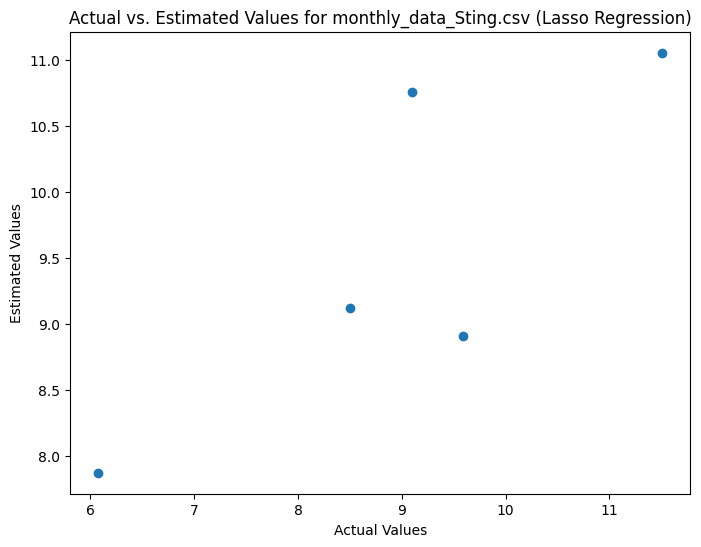


Ridge Regression:
Model: Ridge Regression
Adjusted R-squared: 1.0300
R-squared: 0.5501
MSE: 1.3892
RMSE: 1.1786
Durbin-Watson: 1.5662
Equation: Consideration = 0.0461 * Ad Awareness_lagged_1 + 0.0340 * Ad Awareness_lagged_3 + 0.0605 * Ad Awareness_lagged_8 + -0.0101 * Attention_lagged_1 + -0.0081 * Attention_lagged_16 + 0.1007 * Attention_lagged_4 + 0.0418 * Attention_lagged_6 + -0.0965 * Attention_lagged_7 + 0.0455 * Attention_lagged_8 + -0.0057 * Awareness_lagged_1 + -0.0246 * Awareness_lagged_5 + -0.0085 * Awareness_lagged_6 + 0.0495 * Awareness_lagged_8 + -0.0524 * Buzz_lagged_1 + 0.0157 * Buzz_lagged_10 + -0.0259 * Buzz_lagged_2 + 0.1268 * Buzz_lagged_3 + 0.0272 * Buzz_lagged_6 + -0.0380 * Current Customer_lagged_1 + 0.0536 * Current Customer_lagged_10 + 0.0811 * Current Customer_lagged_2 + -0.0249 * Current Customer_lagged_3 + -0.0475 * Current Customer_lagged_4 + 0.0356 * Current Customer_lagged_6 + -0.0320 * Current Customer_lagged_8 + 0.0468 * Former Customer_lagged_1 + -0.02

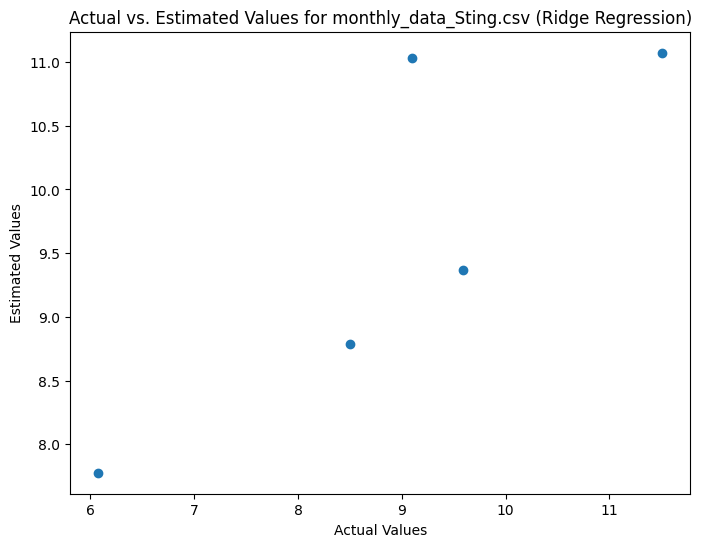


Feature Importance (Ridge Regression):
Buzz_lagged_3            0.126764
Impression_lagged_10     0.117009
Reputation_lagged_9      0.105650
Recommend_lagged_14      0.104255
Attention_lagged_4       0.100738
                           ...   
Awareness_lagged_1       0.005705
Value_lagged_2           0.005697
Recommend_lagged_2       0.005693
WOM Exposure_lagged_7    0.002157
Satisfaction_lagged_4    0.000423
Length: 64, dtype: float64


In [ ]:

from sklearn.preprocessing import PolynomialFeatures

dep_var = 'Consideration'
model_result = []

for monthly_sums, monthly_file_name in month_results:
  flat_table, monthly_file_name, correlation_threshold, dependent_var = create_flat_table_from_weekly_sums(
      monthly_sums, monthly_file_name, monthly_correlation_results_dfs, Monthly_Dep_Var, Monthly_Cor_Threshold)
  if flat_table is not None:
      prepared_df, vif_scores, weekly_file_name = prepare_data_for_modeling(flat_table, monthly_file_name, Monthly_Dep_Var)
      feature_importance, r2, adjusted_r2, equation, dw = polynomial_regression_analysis(prepared_df, Monthly_Dep_Var, monthly_file_name)
      model_result.append((feature_importance, r2, adjusted_r2, equation, dw, Monthly_Dep_Var, monthly_file_name))


In [ ]:
# prompt: write a code to write a CSV file with the following details - 1) Brand Pattern 3V Summary: df_3v_summary with column heads 2) Brand Pattern YouGov Feature Summary: df_feature_summary with column heads 3) Brand Pattern Model Results: model_result per file name with title for each variable that are feature_importance, r2, adjusted_r2, equation, dw, dependent_var. Add feature importance as a seperate table from r2, adjusted_r2, equation, dw,  and dependent_var. Before starting each section add a row saying starting section, for example Starting  Brand Pattern YouGov Feature Summary, and once this block is done add another row saying Ending Brand Pattern YouGov Feature Summary. Do this for each of the three sections. Auto Downloand file

import pandas as pd
from io import BytesIO
from google.colab import files

def create_csv_from_dataframes(df_3v_summary, df_feature_summary, model_result, relationships_dfs):
    # Create an in-memory buffer for the CSV file
    csv_buffer = BytesIO()

    # Create a list to store all rows
    all_rows = []
    all_rows.append(["Starting Intro Section"])
    all_rows.append(["Clent Intro"])
    all_rows.append(["Brand Name:"])
    all_rows.append(["Industry:"])
    all_rows.append(["Target Audience:"])
    all_rows.append(["Key Goals:"])
    all_rows.append(["Ending Intro Section"])
    all_rows.append([""])
    all_rows.append(["Starting Filename to Brand conversion table"])
    all_rows.append(["Source Files", "Lag Measure", "Brand - Segment - Country"])
    for _ , filename in month_results:
        all_rows.append([filename, "Monthly",""])


    # Helper function to add a section header and footer
    def add_section(header, heads, rows, footer):
      all_rows.append([""])
      all_rows.append([header])
      all_rows.append(heads)
      all_rows.extend(rows)
      all_rows.append([footer])

    # Brand Pattern 3V Summary section
    add_section("Starting Brand Pattern 3V Summary", df_3v_summary.columns.tolist(), df_3v_summary.values.tolist(), "Ending Brand Pattern 3V Summary")

    # Brand Pattern YouGov Feature Summary section
    add_section("Starting Brand Pattern YouGov Feature Summary", df_feature_summary.columns.tolist(), df_feature_summary.values.tolist(), "Ending Brand Pattern YouGov Feature Summary")

    # Brand Pattern Model Results section
    all_rows.append([""])
    all_rows.append(["Starting Brand Pattern Model Results"])

    for feature_importance, r2, adjusted_r2, equation, dw, dependent_var, file_name in model_result:

        all_rows.append([""])
        all_rows.append([f"File: {file_name}"])  # Add filename for each model result
        all_rows.append([""])
        all_rows.append(["Feature Importance"])
        all_rows.extend(feature_importance.reset_index().values.tolist())
        all_rows.append([""])
        all_rows.append(["Model Metrics"])
        all_rows.append(["r2", r2])
        all_rows.append(["adjusted_r2", adjusted_r2])
        all_rows.append(["equation", equation])
        all_rows.append(["dw", dw])
        all_rows.append(["dependent_var", dependent_var])


    all_rows.append([""])
    all_rows.append(["Ending Brand Pattern Model Results"])

    # Brand Pattern Relationships section
    all_rows.append([""])
    all_rows.append(["Starting Brand Pattern Relationships"])

    for relationships_df, file_name in relationships_dfs:
      all_rows.append([""])
      all_rows.append([f"File: {file_name}"])  # Add filename for each model result
      all_rows.append([""])
      all_rows.append(["Relationships"])
      all_rows.append(relationships_df.columns.tolist())
      all_rows.extend(relationships_df.values.tolist())
      all_rows.append([""])
    all_rows.append([""])
    all_rows.append(["Ending Brand Pattern Relationships"])
    # Create the CSV file from the list of rows
    df_all = pd.DataFrame(all_rows)

    brand = input("Input Brand Name : ")
    market = input("Input Market Name : ")

    # Write to the buffer
    df_all.to_csv(csv_buffer, index=False, header=False)

    # Rewind the buffer
    csv_buffer.seek(0)

    with open(f"combined_results_{brand}_{market}.csv", "wb") as f:
        f.write(csv_buffer.getbuffer())  # Write buffer content to file


    # Create the download link
    files.download(f"combined_results_{brand}_{market}.csv")



create_csv_from_dataframes(df_3v_summary, df_feature_summary, model_result, relationships_dfs)

Input Brand Name : RedBull
Input Market Name : EG


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>